## Tic-Tac-Toe Agent

In this notebook, we will learn to build an RL agent (using Q-learning) that learns to play Numerical Tic-Tac-Toe with odd numbers. The environment is playing randomly with the agent, i.e. its strategy is to put an even number randomly in an empty cell. The following is the layout of the notebook:
        - Defining epsilon-greedy strategy
        - Tracking state-action pairs for convergence
        - Define hyperparameters for the Q-learning algorithm
        - Generating episode and applying Q-update equation
        - Checking convergence in Q-values

#### Importing libraries
Code to import Tic-Tac-Toe class from the environment file

In [42]:
from TCGame_Env import TicTacToe
import collections
import numpy as np
import random
import pickle
import time
import copy 
from matplotlib import pyplot as plt

In [43]:
# Function to convert state array into a string to store it as keys in the dictionary
# states in Q-dictionary will be of form: x-4-5-3-8-x-x-x-x
#   x | 4 | 5
#   ----------
#   3 | 8 | x
#   ----------
#   x | x | x

def Q_state(state):

    return ('-'.join(str(e) for e in state)).replace('nan','x')

In [44]:
# Function which will return valid (all possible actions) actions corresponding to a state
# Important to avoid errors during deployment.
def valid_actions(state):
    valid_Actions = []
    valid_Actions = [i for i in env.action_space(state)[0]]
    return valid_Actions

In [45]:
# Function which will add new Q-values to the Q-dictionary. 
def add_to_dict(state, valid_acts):
    state1 = Q_state(state)
    if state1 not in Q_dict.keys():
        Q_dict[state1] = {}
        for action in valid_acts:
            Q_dict[state1][action]=0

#### Epsilon-greedy strategy

## Many values were considered to find out the optimum max_epsilon, min_epsilon and x in the following function. 
#### The aim was to find the values which could give high epsilon initially for more exploration

In [46]:
# Defining epsilon-greedy policy.
# After many values of x, we have come to the conclusion to select x as -0.0000008
#Please look at the graph at last of the notebook
max_epsilon = 1.0
min_epsilon = 0.001
x = -0.0000008
def epsilon_greedy(state, time):
    #epsilon = - 1/ (1 + np.exp((-time+7500000)/1700000)) + 1
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(x * time)
    z = np.random.random()
    q_state = Q_state(state)
    
    if z > epsilon:
        action = max(Q_dict[q_state],key=Q_dict[q_state].get)   #Exploitation: this gets the action corresponding to max q-value of current state
    else:
        possible_actions = valid_actions(state)
        action = random.choice(possible_actions)   #Exploration: randomly choosing an action  
    return action

#### Tracking the state-action pairs for checking convergence

In [47]:
# Initialise Q_dictionary as 'Q_dict' and States_tracked as 'States_track' (for convergence)
Q_dict = collections.defaultdict(dict)
States_track = collections.defaultdict(dict)

print(len(Q_dict))
print(len(States_track))

0
0


In [48]:
# Initialise states to be tracked for convergence
def initialise_tracking_states():
    sample_q_values = [('1-6-5-8-x-3-4-7-2', (4, 9)), ('9-x-x-1-4-6-x-x-x',(1, 7)), ('x-x-x-8-x-2-1-7-x',(2, 3)),('x-x-x-8-x-x-1-x-x',(7, 7))]    #select any 4 Q-values
    for q_values in sample_q_values:
        state = q_values[0]
        action = q_values[1]
        States_track[state][action] = []


In [49]:
# Function to save the Q-dictionary as a pickle file

def save_obj(obj, name ):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

In [50]:
# Function to save values to the tracking states
def save_tracking_states():
    for state in States_track.keys():
        for action in States_track[state].keys():
            if state in Q_dict and action in Q_dict[state]:
                States_track[state][action].append(Q_dict[state][action])

In [51]:
initialise_tracking_states()

#### Define hyperparameters

In [52]:
EPISODES = 10000000
#EPISODES = 10
LR = 0.02                 #learning rate
GAMMA = 0.9
threshold = 2000          # every these many episodes, the 4 Q-values will be stored/appended (convergence graphs)
#threshold = 1
policy_threshold = 3000    #every these many episodes, the Q-dict will be updated


### Q-update loop

In [53]:
# Main code

# Tracking the total time
start_time = time.time()

# Running for EPISODES number of times
for episode in range(EPISODES):
    env = TicTacToe()
    
    # initial state which is initialized in the environment file
    initial_state = copy.deepcopy(env.state)
    curr_state = copy.deepcopy(env.state)
    
    # add initial state to Q_dict
    add_to_dict(curr_state,valid_actions(curr_state))
    
    # initial reward
    reward = None
    
    # finding all possible actions for the current state
    # possible_actions = valid_actions(curr_state)
    
    # randomly choosing an action for the agent
    # curr_action = random.choice(list(possible_actions))
    
    # calculating the next state after the first agent and enviroment move
    # next_state = env.initial_step(curr_state, curr_action)
    
    # add the next state to the dictionary
    # add_to_dict(next_state,valid_actions(next_state))
    
    #curr_state = copy.deepcopy(next_state)
    
    total_reward = 0
    terminated = False
    
    # loop on termination condition of Win(Wins), Loss(Wins) or Tie(Tie)
    while not terminated:
        
        # calculating the next action on the basis of the epsilon policy
        curr_action = epsilon_greedy(curr_state, episode)
        
        # finding the next_state and reward
        next_state, reward, terminated = env.step(copy.deepcopy(curr_state), curr_action)
        # print(next_state)
        
        # add the next state to the dictionary
        add_to_dict(next_state,valid_actions(next_state))
        
        # converting the list into "-" separated string and replacing nan by x
        next_q_state = Q_state(next_state)
        curr_q_state = Q_state(curr_state)
        
        # UPDATE RULE
        if not terminated:
            max_next = max(Q_dict[next_q_state],key=Q_dict[next_q_state].get)
            dis = GAMMA*(Q_dict[next_q_state][max_next])
        else:
            # if the next state is a terminal state, then the Q-values from that state are 0. (No action is possible from that state)
            dis = 0
        
        Q_dict[curr_q_state][curr_action] += LR * ((reward + dis) - Q_dict[curr_q_state][curr_action])
        
        curr_state = copy.deepcopy(next_state)
        total_reward += reward

    # print(total_reward)
    # print(terminated)
        
    #TRACKING Q-VALUES
    if (episode == threshold-1):        #at the 1999th episode
        initialise_tracking_states()
        
    #TRACKING Q-VALUES
    # save the tracked state action pair Q values in intervals   
    if ((episode+1) % threshold) == 0:
        #print('saving tracking')
        save_tracking_states()
        save_obj(States_track,'States_tracked')        
    
    # Commenting out the below code inorder to print the final value
    #SAVING POLICY
    #if ((episode+1)% policy_threshold ) == 0:  #every 3000th episodes, the Q-dict will be saved
    #   save_obj(Q_dict,'Policy')   
    
elapsed_time = time.time() - start_time
print('Total time taken ',elapsed_time)
save_obj(States_track,'States_tracked')   
save_obj(Q_dict,'Policy')

Total time taken  6558.696670055389


#### Check the Q-dictionary

In [54]:
Q_dict

defaultdict(dict,
            {'x-x-x-x-x-x-x-x-x': {(0, 1): 0.032507470786390734,
              (0, 3): -0.4408776163053696,
              (0, 5): 0.018670933886478138,
              (0, 7): -0.4689174831443152,
              (0, 9): -0.5889386801022464,
              (1, 1): -0.5322217097817507,
              (1, 3): -0.13781179143861297,
              (1, 5): -0.28800601724020186,
              (1, 7): 0.18523710761806872,
              (1, 9): -0.47476032099000587,
              (2, 1): 0.6438929063643133,
              (2, 3): -0.12339934573284696,
              (2, 5): 0.09427309781225607,
              (2, 7): -0.1597500840147213,
              (2, 9): -0.10637123231524233,
              (3, 1): 1.8400178094046369,
              (3, 3): 0.3299322398542363,
              (3, 5): 3.4404975510364495,
              (3, 7): 0.4737065533344304,
              (3, 9): -0.4017573716708751,
              (4, 1): 0.3534915670901131,
              (4, 3): -0.9601699175909534,
              

In [55]:
len(Q_dict)

2425332

### try checking for one of the states

# We choose a random state and lets observe a q-value

In [56]:
Q_dict['9-x-x-1-4-6-x-x-x']

{(1, 3): -0.2196,
 (1, 5): -0.02,
 (1, 7): -0.02,
 (2, 3): -0.02,
 (2, 5): 0,
 (2, 7): 0,
 (6, 3): 0,
 (6, 5): 0,
 (6, 7): 0,
 (7, 3): 0,
 (7, 5): -0.2,
 (7, 7): 0,
 (8, 3): 0,
 (8, 5): -0.02,
 (8, 7): 0}

# We see above that our RL has been trained really well. As per the results, we see that the best possible next action is (6,5) which will result in agent winning

### Checking 1 more random state

In [57]:
Q_dict['x-x-x-8-x-2-1-7-x']

{(0, 3): -0.02,
 (0, 5): -0.02,
 (0, 9): -0.02,
 (1, 3): -0.02,
 (1, 5): -0.02,
 (1, 9): 0,
 (2, 3): 0,
 (2, 5): -0.02,
 (2, 9): 0,
 (4, 3): -0.02,
 (4, 5): 0,
 (4, 9): 0,
 (8, 3): 0,
 (8, 5): 0,
 (8, 9): 0}

In [58]:
if (1,7) in Q_dict['9-x-x-1-4-6-x-x-x']:
    print(Q_dict['9-x-x-1-4-6-x-x-x'][(1, 7)])

-0.02


### checking for a particular position

In [59]:
pos = (0,1)
for key in Q_dict.keys():
    if pos in Q_dict[key]:
        print(key)
        print(Q_dict[key][pos])
    

x-x-x-x-x-x-x-x-x
0.032507470786390734
x-9-x-x-x-x-x-6-x
-0.455930042669944
x-9-4-x-x-x-3-6-x
-0.02
x-x-5-x-8-x-x-x-x
-0.5726566323044492
x-x-8-x-x-7-x-x-x
-0.5069253793819217
x-x-7-6-x-x-x-x-x
-0.6014383840499404
x-x-7-6-5-x-x-x-2
-0.02
x-8-7-6-5-x-x-9-2
-0.2
x-3-x-x-x-x-x-8-x
-0.7197440080897554
x-x-x-x-x-x-7-x-6
-0.7703587681062842
x-x-x-x-9-2-7-x-6
-0.396
x-8-x-x-x-x-x-3-x
-0.789292577301092
x-7-2-x-x-x-x-x-x
-0.6101077471605711
x-7-2-x-8-x-x-x-3
0
x-7-2-x-8-x-5-x-3
0
x-4-x-x-3-x-x-x-x
-0.6962888096387714
x-4-x-x-3-5-x-x-6
-0.02
x-2-x-x-7-x-x-x-x
-0.6442171805759961
x-x-x-x-5-x-x-2-x
-0.8047791740696759
x-x-x-x-9-2-x-x-x
-0.7448452045479498
x-x-x-8-9-2-x-x-7
-0.02
x-7-x-x-6-x-x-x-x
-0.9116381872028277
x-x-x-x-x-8-x-x-9
-0.5410918330147506
x-8-x-x-x-x-x-9-x
-0.6665945224718052
x-8-6-x-x-5-x-9-x
0.396
x-x-x-x-6-x-x-x-3
-0.5110029796464145
x-3-x-x-6-x-x-x-x
-0.4982651103353038
x-3-x-x-6-x-x-7-2
-0.036000000000000004
x-3-8-x-6-x-5-7-2
-0.02
x-x-x-3-x-4-x-x-x
-0.8971200623352792
x-9-x-3

x-x-x-x-x-x-x-9-8
-0.6432347199807842
x-x-x-6-5-x-x-9-8
-0.2
x-x-x-x-x-x-8-x-9
-0.6500402300800285
x-6-x-5-x-x-8-x-9
-0.02
x-6-2-5-7-x-8-x-9
0
x-x-x-x-x-x-x-8-5
-0.5788142101018865
x-x-x-x-5-x-4-x-x
-0.6015887858573213
x-x-9-2-5-x-4-x-x
-0.02
x-x-9-2-5-x-4-8-7
0
x-x-x-9-x-x-x-2-x
-0.5014751528804431
x-x-8-4-x-x-7-x-5
-0.02
x-x-x-8-2-9-x-7-x
-0.2
x-x-x-2-x-x-3-x-x
-0.5512368491677545
x-6-x-2-x-x-3-9-x
-0.02
x-6-x-2-x-8-3-9-7
0
x-x-x-9-6-8-x-x-7
-0.02
x-2-3-x-x-x-x-5-6
-0.2
x-x-x-6-x-7-x-x-x
-0.7587162134472626
x-x-x-6-8-7-5-x-x
-0.02
x-x-9-6-8-7-5-4-x
0
x-x-5-x-8-7-x-x-6
0.396
x-9-x-3-6-x-x-x-4
-0.02
x-x-x-x-5-4-8-9-x
-0.2196
x-3-2-x-5-4-8-9-x
0
x-5-4-x-x-2-x-x-9
0
x-x-x-x-9-x-x-6-x
-0.5302851573244011
x-x-2-x-x-x-x-x-3
-0.5479005623417338
x-x-x-x-x-x-5-x-2
-0.7593621937415294
x-9-x-x-4-x-5-x-2
-0.02
x-9-8-x-4-x-5-7-2
0
x-6-x-x-7-x-x-x-x
-0.6350747857185989
x-6-x-2-7-x-x-x-5
-0.02
x-x-7-x-x-x-2-x-x
-0.7784945385216799
x-2-x-5-x-x-x-x-x
-0.4334827601293512
x-2-x-5-x-x-8-x-7
-0.02
x-x-3-x

x-5-x-x-6-9-x-x-8
0.58808
x-7-x-8-x-6-x-9-x
-0.02
x-x-9-4-8-7-x-x-x
0
x-x-9-4-8-7-6-5-x
0
x-2-9-4-8-7-6-5-3
0
x-x-3-2-x-x-x-9-6
-0.02
x-x-x-8-x-x-x-7-x
-0.4761168596651073
x-x-x-8-6-3-x-7-x
-0.02
x-2-x-6-5-x-3-x-x
0
x-4-7-x-9-2-x-x-x
-0.02
x-8-x-x-7-x-x-5-2
-0.039599999999999996
x-8-x-3-7-4-x-5-2
0
x-x-x-8-x-x-7-x-x
-0.557817863662208
x-3-x-8-x-x-7-x-2
-0.02
x-x-9-8-x-x-x-3-4
-0.02
x-x-x-x-x-6-7-x-x
-0.4865945224718052
x-x-4-x-x-x-x-3-x
-0.512762670581988
x-x-4-2-x-x-x-3-9
-0.02
x-5-4-2-x-6-x-3-9
0
x-x-4-5-x-6-x-9-x
-0.02
x-7-4-5-2-6-x-9-x
0
x-2-8-5-x-x-3-x-x
-0.039599999999999996
x-2-8-5-x-9-3-6-x
-0.02
x-8-x-x-x-7-x-x-x
-0.7275729042250907
x-9-x-x-x-x-x-x-2
-0.4614515707730778
x-9-8-x-5-x-x-x-2
-0.02
x-9-8-6-5-x-7-x-2
0
x-9-x-x-x-2-x-3-8
-0.039599999999999996
x-8-7-x-5-6-9-4-x
-0.02
x-6-x-x-x-x-x-9-x
-0.5609668589505602
x-3-x-2-x-x-x-x-x
-0.4545156806175628
x-3-6-x-9-x-x-2-x
-0.02
x-2-5-9-x-8-x-x-x
-0.039599999999999996
x-x-9-x-x-x-8-7-2
0
x-x-7-x-x-2-x-4-5
-0.036072
x-7-x-6-x-8-x-3-

x-6-3-9-x-x-5-2-8
0
x-x-x-x-x-9-5-4-2
-0.02
x-x-3-x-8-9-5-4-2
0
x-x-4-x-8-x-3-x-7
0
x-x-x-x-7-3-x-6-4
0
x-3-x-x-x-5-x-4-8
-0.02
x-x-2-9-x-8-x-7-x
-0.02
x-7-x-4-3-x-6-x-x
-0.02
x-x-5-x-x-4-8-9-x
-0.2
x-x-4-8-x-x-7-9-x
-0.02
x-x-x-9-2-x-4-5-x
-0.02
x-3-x-9-2-x-4-5-8
0
x-4-x-8-x-5-x-x-3
-0.02
x-4-x-8-2-5-x-7-3
0
x-4-9-3-x-x-x-x-6
-0.21600000000000003
x-9-x-6-x-3-4-x-x
-0.039599999999999996
x-9-2-6-7-3-4-x-x
-0.0192872
x-3-x-x-x-8-2-5-x
-0.02
x-6-x-5-x-3-2-x-x
-0.02
x-4-5-x-x-x-x-8-7
0
x-8-x-x-x-3-x-4-9
-0.02
x-8-5-x-6-3-x-4-9
0
x-8-x-3-x-4-x-9-x
0
x-x-9-2-5-x-6-x-x
-0.02
x-x-x-7-8-4-x-x-9
-0.02
x-8-x-x-9-x-6-5-x
-0.02
x-8-x-7-9-2-6-5-x
-0.02
x-x-x-9-x-8-3-x-2
-0.02
x-x-3-6-4-x-x-x-9
-0.02
x-x-3-6-4-x-7-8-9
0
x-x-3-6-4-5-7-8-9
0
x-6-3-x-9-8-x-5-4
0
x-x-4-x-5-x-7-6-x
-0.02
x-x-4-8-5-x-7-6-9
0.2
x-2-x-4-x-x-x-9-5
-0.02
x-2-x-4-3-6-x-9-5
-0.02
x-x-x-3-x-x-4-6-5
0
x-x-x-9-2-7-4-x-x
-0.039599999999999996
x-8-5-9-2-7-4-x-x
0
x-8-x-x-x-x-4-7-3
-0.02
x-x-x-6-x-9-x-4-7
-0.016399999999999998
x-x-x-x

x-x-7-2-9-x-6-x-x
-0.039599999999999996
x-x-7-2-9-8-6-5-x
0
x-x-5-8-9-x-6-x-x
0.2
x-x-x-x-5-x-6-3-2
-0.02
x-x-x-9-5-8-6-3-2
0
x-x-x-x-7-x-9-4-2
0
x-5-x-4-9-8-x-x-x
-0.02
x-x-x-5-2-6-9-x-x
5.719493320455066
x-x-7-5-x-6-x-x-4
-0.02
x-6-x-x-7-3-x-x-4
-0.02
x-6-x-x-7-3-8-5-4
0
x-x-6-x-5-x-x-2-9
0.9607920320000001
x-7-6-x-5-x-8-2-9
0
x-6-x-5-x-x-8-3-x
-0.02
x-7-9-x-2-8-x-x-x
-0.02
x-2-9-x-x-x-x-6-7
-0.02
x-x-x-7-x-x-4-5-6
0
x-x-x-2-9-x-8-7-x
-0.02
x-x-x-9-6-7-x-x-4
-0.02
x-4-x-x-7-x-5-6-x
-0.02
x-3-x-7-x-x-2-6-x
-0.02
x-6-3-8-x-x-x-5-x
-0.02
x-6-3-8-4-x-7-5-x
0
x-3-x-x-x-7-6-x-8
-0.02
x-x-2-6-x-x-x-7-3
-0.039599999999999996
x-x-2-6-x-8-9-7-3
-0.02
x-x-9-4-x-x-3-x-6
-0.02
x-5-9-4-x-2-3-x-6
0
x-5-9-4-8-2-3-7-6
0.2
x-7-x-8-3-x-x-x-4
-0.016399999999999998
x-6-8-x-x-x-5-7-x
0.396
x-7-x-4-x-2-x-3-x
-0.016399999999999998
x-9-x-x-4-x-x-8-5
-0.02
x-8-x-x-6-x-7-x-9
-0.02
x-x-3-6-x-7-4-x-x
-0.02
x-5-4-x-6-x-x-x-9
-0.02
x-x-4-6-7-x-3-x-x
-0.039599999999999996
x-5-4-6-7-8-3-x-x
-0.01860262688
x-5-4-6-7-

x-7-x-x-2-8-3-x-x
-0.02
x-7-x-x-x-x-8-4-5
-0.2
x-7-9-x-x-2-8-4-5
0
x-4-x-x-9-7-x-x-8
-0.02
x-4-x-x-7-6-x-3-x
-0.2
x-x-5-4-2-x-7-x-x
-0.02
x-x-5-4-2-x-7-8-3
0
x-x-7-x-x-5-x-4-6
-0.02
x-8-7-x-x-5-3-4-6
0
x-x-x-6-5-4-x-9-x
0
x-3-x-2-9-x-x-4-x
-0.02
x-x-7-x-x-x-4-6-3
-0.02
x-6-x-x-3-8-x-5-x
-0.02
x-x-5-x-6-3-x-4-x
-0.02
x-x-8-4-9-3-x-x-x
-0.036000000000000004
x-x-x-x-x-3-8-7-6
-0.02
x-2-x-x-9-3-8-7-6
0
x-x-8-x-4-x-9-5-x
-0.039599999999999996
x-x-x-5-9-2-x-4-x
-0.02
x-x-x-5-9-2-7-4-6
-0.02
x-x-x-8-5-x-9-x-6
-0.02
x-x-4-8-5-x-9-3-6
0
x-x-2-4-3-x-x-9-x
-0.02
x-8-x-7-3-x-x-x-2
-0.235208
x-x-x-x-2-x-7-5-8
-0.039599999999999996
x-6-x-4-x-x-7-3-x
0
x-5-x-7-x-x-x-4-2
-0.02
x-5-x-7-x-9-8-4-2
0
x-2-5-x-x-7-4-x-x
-0.02
x-4-x-6-x-x-5-7-x
-0.02
x-2-x-7-x-x-x-8-5
-0.02
x-2-5-x-7-6-x-x-x
-0.02
x-x-3-4-x-x-x-2-5
0
x-x-3-4-x-7-x-2-5
0
x-x-4-3-x-2-9-x-x
-0.0964080735381632
x-8-x-6-x-9-x-7-x
-0.02
x-8-x-6-2-9-x-7-5
0
x-x-x-8-2-5-x-3-x
0
x-4-x-2-x-x-x-5-9
-0.039599999999999996
x-x-6-8-x-x-9-x-5
-0.02
x-7-5-x-

-0.2
x-x-x-7-3-6-2-x-x
-0.02
x-6-8-3-7-x-x-x-x
0.7763184000000001
x-x-x-6-x-x-3-7-8
-0.02
x-x-8-2-x-7-x-x-5
-0.02
x-x-4-x-x-9-x-3-6
-0.2
x-x-4-x-8-9-5-3-6
0.396
x-7-2-8-x-x-x-x-3
-0.02
x-4-5-x-x-6-x-3-x
-0.02
x-4-5-x-7-6-8-3-x
-0.2
x-6-x-x-2-7-x-9-x
-0.02
x-x-x-5-3-x-x-6-4
-0.02
x-x-x-5-3-2-7-6-4
0
x-x-9-5-3-2-7-6-4
0
x-x-6-x-9-8-x-7-x
-0.016399999999999998
x-5-6-x-9-8-4-7-x
0
x-x-x-9-6-x-7-2-x
-0.02
x-5-x-8-9-x-x-x-2
-0.02
x-5-x-8-9-4-x-3-2
-0.02
x-2-x-8-7-x-3-x-x
-0.02
x-2-x-8-7-x-3-6-5
0
x-x-6-x-3-x-2-x-7
-0.2
x-5-6-x-3-4-2-x-7
-0.02
x-2-x-5-x-x-x-7-6
-0.02
x-x-2-x-9-x-3-8-x
-0.02
x-x-x-x-x-6-7-4-3
-0.02
x-x-x-x-4-7-8-9-x
-0.02
x-6-5-8-x-x-x-7-x
-0.02
x-x-4-x-7-x-x-2-3
0
x-5-x-x-x-4-7-x-8
-0.02
x-5-9-6-x-4-7-x-8
0.2
x-8-7-x-5-x-6-x-x
-0.02
x-x-8-x-2-9-x-x-5
-0.02
x-4-8-7-2-9-x-x-5
-0.02
x-5-2-6-7-x-x-x-x
0
x-2-x-x-4-x-5-x-7
-0.02
x-2-x-x-4-x-5-3-7
0
x-x-x-x-x-8-9-6-5
-0.2196
x-x-x-7-x-x-4-9-8
-0.039599999999999996
x-9-2-3-x-8-x-x-x
-0.02
x-x-5-4-6-x-x-3-x
-0.2
x-9-x-x-2-x-x-3-6
-0.0

x-8-x-x-x-5-2-x-7
-0.02
x-8-9-x-4-5-2-x-7
0
x-x-x-2-3-x-9-x-8
-0.07792475516604311
x-x-4-2-3-5-9-x-8
-0.01860262688
x-x-8-x-4-x-9-3-x
-0.07403184
x-3-x-8-x-7-x-x-6
-0.02
x-x-4-5-x-x-3-x-6
-0.039599999999999996
x-x-4-3-x-8-x-5-x
-0.02
x-8-x-5-x-4-x-9-x
-0.02
x-8-6-5-3-4-x-9-x
0.2
x-3-x-2-x-8-x-9-x
-0.02
x-3-5-6-x-4-x-x-x
-0.02
x-4-3-x-x-x-6-x-7
-0.02
x-4-7-x-6-3-x-x-x
-0.02
x-4-7-x-6-3-5-2-x
0
x-x-x-9-x-8-4-5-x
-0.039599999999999996
x-x-4-x-x-8-5-x-9
-0.02
x-5-x-9-8-x-x-2-x
0
x-6-x-x-x-8-7-9-x
-0.02
x-6-2-x-x-8-7-9-3
-0.01964
x-x-8-5-2-x-9-x-x
9.999999999999957
x-x-x-3-5-x-4-6-x
0
x-4-x-5-3-x-x-2-x
-0.039599999999999996
x-8-x-x-x-7-4-3-x
-0.02
x-8-5-3-x-6-x-x-x
-0.2
x-8-5-3-7-6-4-x-x
-0.02
x-3-x-x-4-2-5-x-x
-0.2
x-3-8-x-4-2-5-x-9
-0.039599999999999996
x-9-x-x-x-6-x-8-7
-0.02
x-9-x-4-5-6-x-8-7
0
x-x-x-9-3-2-4-x-x
0
x-7-x-4-2-3-x-x-x
-0.02
x-x-4-x-x-x-9-6-3
-0.110557619136
x-x-x-2-9-7-x-x-6
-0.02
x-x-5-2-9-7-8-x-6
0
x-2-x-x-6-9-x-x-3
-0.039599999999999996
x-x-x-9-x-3-4-6-x
-0.02
x-4-3-x-x

-0.02
x-6-8-x-x-9-x-x-7
0.7763184000000001
x-x-6-7-x-8-x-5-x
-0.02
x-x-x-x-5-6-x-7-4
-0.02
x-x-x-5-x-7-x-6-2
-0.02
x-x-3-5-x-7-8-6-2
0
x-x-5-x-x-7-6-8-x
0
x-x-5-x-x-7-6-8-3
0
x-6-3-7-x-x-x-4-x
-0.02
x-7-x-x-x-3-6-4-x
-0.02
x-7-x-8-5-3-6-4-x
0.2
x-x-9-8-x-5-x-4-x
-0.2196
x-x-9-8-x-5-2-4-7
0
x-x-8-x-9-x-2-7-x
-0.02
x-x-x-x-x-3-4-7-6
-0.02
x-9-x-2-6-x-x-x-3
-0.02
x-x-x-x-x-3-5-4-2
-0.02
x-7-x-x-8-x-5-x-6
0.2
x-3-2-x-x-x-9-x-8
-0.2
x-x-x-9-6-2-x-7-x
-0.02
x-x-4-9-6-2-x-7-3
0
x-x-4-9-6-2-5-7-3
0
x-8-x-6-x-7-x-3-x
-0.2
x-8-x-6-9-7-x-3-4
0
x-8-2-6-9-7-5-3-4
0.02
x-8-2-x-x-9-x-3-x
-0.2
x-8-2-5-4-9-x-3-x
0
x-x-x-7-x-x-8-5-4
-0.02
x-x-x-5-7-x-4-8-x
-0.016399999999999998
x-x-6-7-x-x-x-8-3
-0.02
x-6-x-4-x-9-x-x-7
-0.2
x-6-3-4-x-9-x-2-7
0
x-6-3-4-5-9-8-2-7
0.02
x-8-x-x-x-3-5-4-x
-0.02
x-8-6-x-7-3-5-4-x
0.396
x-x-8-4-9-x-3-x-x
-0.02
x-x-x-x-7-x-3-8-2
0
x-x-6-x-7-5-3-8-2
-0.0192872
x-4-x-x-x-7-5-x-6
-0.02
x-4-x-x-x-7-2-x-9
-0.02
x-x-x-x-x-4-3-2-9
-0.02
x-7-x-6-x-x-x-5-4
-0.02
x-x-2-x-7-6-x-9-x
-0.02


x-7-6-x-3-x-x-x-8
0
x-x-8-4-x-9-x-x-5
-0.02
x-x-x-5-x-9-4-x-8
0
x-x-3-9-4-x-x-x-8
-0.02
x-2-x-x-x-x-5-6-9
-0.02
x-2-7-x-8-x-5-6-9
0
x-3-x-x-9-x-x-2-8
-0.02
x-6-9-3-x-x-x-x-2
-0.02
x-2-8-x-7-3-x-4-9
-0.02
x-x-x-7-x-8-x-2-9
-0.02
x-x-5-7-x-8-4-2-9
0
x-4-7-x-3-x-6-x-x
-0.02
x-4-7-5-3-x-6-x-8
-0.02
x-6-x-7-x-8-x-5-x
-0.02
x-6-x-7-9-8-x-5-2
0
x-6-3-7-9-8-4-5-2
0.039599999999999996
x-7-8-x-3-x-x-x-2
0
x-7-8-x-3-x-6-9-2
0
x-5-x-x-9-x-6-x-4
-0.2
x-5-8-x-9-3-6-x-4
0
x-x-7-x-4-x-3-2-x
-0.02
x-x-7-x-4-6-3-2-5
0
x-8-7-9-4-6-3-2-5
0.039599999999999996
x-x-4-x-x-x-8-7-3
-0.02
x-9-x-6-4-x-x-x-7
-0.2
x-x-x-x-6-5-x-4-9
-0.02
x-2-x-x-6-5-3-4-9
0
x-8-x-5-6-x-9-x-x
8.619121658738512
x-3-8-x-7-x-x-4-x
-0.02
x-x-x-x-6-x-5-3-2
-0.2
x-2-9-x-6-x-x-3-x
-0.02
x-8-7-x-x-5-x-6-x
-0.02
x-7-x-9-8-x-x-6-x
-0.02
x-x-x-5-6-x-8-7-x
-0.039599999999999996
x-x-4-6-3-9-x-x-x
0
x-x-2-x-6-x-9-x-3
-0.10067826930183975
x-x-2-x-6-8-9-7-3
0
x-9-x-2-4-x-x-x-7
-0.02
x-x-6-x-x-x-8-5-7
-0.039599999999999996
x-x-5-6-7-x-x-8-x
-0.2
x-2

x-x-9-4-5-2-x-x-x
0
x-x-x-2-3-6-x-x-5
-0.02
x-x-8-x-5-6-x-x-9
0.9607920320000001
x-x-8-2-5-6-7-x-9
0
x-x-2-x-x-7-x-6-9
-0.016399999999999998
x-8-4-7-x-x-x-x-5
-0.02
x-8-4-7-9-x-6-x-5
0
x-x-6-x-5-3-8-x-x
-0.02
x-5-3-8-x-x-x-x-2
0
x-5-3-8-x-x-7-4-2
0
x-x-5-x-x-6-2-x-3
-0.02
x-8-5-9-x-6-2-x-3
-0.02
x-x-x-9-3-2-x-8-x
-0.039599999999999996
x-6-x-9-3-2-7-8-x
0
x-x-x-4-3-7-x-8-x
-0.02
x-x-2-4-x-5-9-x-x
-0.43050383999999997
x-x-9-x-x-x-8-2-3
-0.2
x-x-9-5-4-x-8-2-3
-0.2
x-8-5-4-x-x-9-x-x
-0.039599999999999996
x-8-5-4-7-6-9-x-x
-0.018941456000000002
x-6-4-3-x-7-x-x-x
-0.02
x-6-4-3-x-7-9-x-8
-0.2
x-6-4-3-2-7-9-5-8
0
x-7-x-8-6-9-x-x-x
0
x-x-8-x-5-x-x-9-6
-0.02
x-x-8-7-5-2-x-9-6
0
x-4-x-2-9-x-x-3-x
-0.02
x-8-9-6-7-x-x-x-x
-0.02
x-8-9-6-7-x-5-2-x
0
x-7-8-6-9-x-x-x-x
-0.036000000000000004
x-6-8-x-x-7-x-x-9
0.58808
x-6-8-4-x-7-3-x-9
0
x-x-x-x-9-2-4-x-5
0.9607920320000001
x-x-x-6-x-5-4-7-x
-0.02
x-x-3-4-x-x-5-8-x
-0.02
x-x-6-4-x-9-3-x-x
-0.039599999999999996
x-x-6-4-x-9-3-5-8
0
x-x-x-x-x-7-2-3-4
0
x-x-

-0.039599999999999996
x-x-7-x-5-8-6-x-x
-0.02
x-x-7-4-5-8-6-9-x
0
x-x-4-7-x-9-x-x-8
-0.02
x-x-x-5-x-x-4-7-2
-0.02
x-7-x-x-x-3-6-x-4
0
x-7-x-x-x-3-6-5-4
0
x-x-4-x-x-9-x-8-3
-0.039599999999999996
x-7-4-2-x-9-x-8-3
0
x-7-4-2-6-9-5-8-3
0
x-6-x-x-5-9-2-x-x
-0.02
x-7-x-5-8-4-x-x-x
-0.2
x-7-3-5-8-4-x-x-6
0
x-7-3-5-8-4-9-2-6
0.396
x-5-x-4-x-x-6-7-x
-0.2
x-6-9-4-7-x-x-x-x
0
x-8-9-x-2-x-3-x-x
-0.039599999999999996
x-8-9-x-2-x-3-4-7
0
x-3-5-x-8-x-x-x-6
0.2
x-x-2-3-6-x-5-9-4
0
x-x-x-5-x-4-6-x-9
-0.2
x-x-7-x-6-9-x-8-x
-0.02
x-3-7-x-6-9-2-8-x
0
x-4-x-8-9-x-x-x-3
-0.02
x-x-4-9-x-3-6-x-x
-0.02
x-x-x-9-7-4-x-x-8
-0.02
x-3-4-x-9-x-8-x-x
-0.02
x-3-x-x-x-8-x-7-4
-0.02
x-x-x-4-x-x-9-2-7
-0.10744880256
x-7-9-6-x-5-8-x-2
0
x-7-9-6-3-5-8-4-2
0.2
x-7-2-x-x-6-3-x-x
-0.02
x-7-2-4-x-6-3-9-x
0
x-4-x-8-x-7-x-9-x
-0.039599999999999996
x-4-x-9-8-x-x-5-x
-0.02
x-6-3-x-x-x-9-x-2
-0.23348346855552
x-x-8-9-6-x-5-x-x
0.7763184000000001
x-x-x-9-x-7-x-6-2
-0.02
x-x-6-9-x-x-x-7-8
-0.02
x-x-6-9-x-4-3-7-8
-0.2
x-9-x-8-x-x-x-6-

-0.02
x-9-2-4-3-7-x-x-6
0
x-6-x-4-3-x-x-x-5
-0.02
x-x-5-7-x-x-2-x-8
-0.02
x-9-5-7-6-x-2-x-8
0.2
x-9-5-7-6-4-2-3-8
0.2
x-x-x-x-5-4-6-9-x
-0.02
x-x-7-8-5-4-6-9-x
0.2
x-x-2-x-x-7-3-4-x
-0.2
x-x-x-8-2-x-7-5-x
0
x-8-6-x-x-x-7-3-x
0.396
x-6-9-x-x-x-x-7-2
0
x-x-6-x-8-3-5-x-x
-0.2
x-7-x-x-4-x-8-x-9
-0.02
x-3-2-x-x-x-4-x-9
-0.02
x-4-2-5-x-x-x-x-9
-0.02
x-9-x-x-x-x-2-4-3
-0.02
x-5-8-x-7-6-x-x-x
-0.02
x-6-x-x-x-x-3-7-4
-0.02
x-6-x-8-5-x-3-7-4
-0.02
x-x-x-x-x-7-4-2-3
0
x-x-5-x-x-7-4-2-3
0
x-x-2-4-9-x-3-x-x
-0.02
x-7-2-4-9-x-3-x-6
0
x-x-8-9-3-x-x-x-2
-0.02
x-x-7-x-9-2-x-4-x
-0.02
x-x-4-x-x-3-9-x-8
0
x-x-2-3-x-x-7-4-x
-0.039599999999999996
x-x-6-x-x-9-5-8-x
-0.02
x-x-6-x-7-9-5-8-2
0
x-2-x-x-8-x-x-7-5
0
x-7-2-x-4-x-x-x-5
0
x-7-2-x-4-x-9-x-5
0
x-x-8-x-x-2-x-5-7
-0.039599999999999996
x-x-4-9-x-x-6-x-5
-0.02
x-x-4-9-7-2-6-x-5
-0.02
x-4-8-7-x-6-x-3-5
0
x-9-x-x-6-3-x-2-x
-0.02
x-9-6-8-x-x-x-x-7
-0.02
x-9-6-8-x-x-3-4-7
-0.2
x-8-x-x-2-x-5-9-x
0
x-8-6-x-2-x-5-9-3
0
x-8-6-7-2-4-5-9-3
0.2
x-2-7-x-x-4-8-9-3
0
x

0
x-7-x-6-x-x-x-5-8
-0.02
x-7-x-8-x-x-x-2-3
-0.02
x-x-5-x-3-8-2-x-x
-0.02
x-5-2-x-x-x-4-x-7
-0.02
x-x-x-4-7-3-x-8-x
-0.02
x-x-x-6-x-x-9-7-2
-0.0960792032
x-x-8-6-x-3-9-7-2
-0.02
x-9-x-8-x-2-x-x-3
-0.02
x-9-5-8-6-2-x-x-3
0
x-2-5-x-x-3-x-8-x
0
x-2-5-x-x-3-x-8-7
0
x-4-5-3-x-2-x-x-x
-0.02
x-2-x-3-x-x-8-x-9
-0.039599999999999996
x-8-5-x-x-4-7-x-x
0
x-x-x-4-9-x-x-8-5
0.2
x-x-7-4-9-6-x-8-5
0.2
x-x-8-7-3-4-x-x-x
-0.02
x-x-8-7-3-4-x-6-5
0
x-9-8-x-x-x-2-x-7
-0.039599999999999996
x-9-8-x-4-x-2-3-7
0
x-3-x-5-4-x-2-x-x
-0.02
x-3-x-x-9-x-6-x-8
-0.02
x-x-9-7-x-4-8-2-5
0
x-4-5-x-x-6-x-7-x
-0.02
x-x-x-6-5-x-7-x-8
-0.02
x-x-2-4-x-7-x-x-9
-0.02
x-6-x-x-x-3-4-x-7
-0.02
x-x-x-x-8-9-6-x-7
-0.039599999999999996
x-x-8-x-3-x-4-x-9
0
x-x-x-4-x-x-7-2-9
-0.02
x-3-x-4-x-6-7-2-9
0
x-x-x-5-x-x-4-9-6
-0.02
x-x-7-x-2-x-3-x-6
-0.02
x-3-x-2-9-8-x-x-x
-0.02
x-x-x-x-6-x-4-9-3
-0.02
x-7-8-x-6-x-4-9-3
0
x-7-8-2-6-5-4-9-3
0.02
x-x-6-2-x-x-9-5-x
-0.23203352000000002
x-x-x-x-5-3-x-6-8
0
x-x-7-x-5-3-4-6-8
-0.02
x-5-9-x-8-x-x-4-

x-5-x-x-x-3-8-x-4
-0.02
x-3-4-6-x-7-x-x-x
-0.2
x-3-4-6-x-7-x-5-8
0
x-x-3-8-7-x-x-2-x
-0.02
x-x-3-x-x-8-6-x-9
-0.02
x-x-3-7-x-8-6-4-9
0
x-9-6-5-3-4-8-x-x
0
x-x-4-x-5-7-6-x-x
0
x-2-x-7-x-x-4-3-x
-0.02
x-2-8-7-9-x-4-3-x
0
x-x-x-4-5-x-7-x-6
0
x-x-8-4-5-3-7-x-6
0
x-2-x-x-8-x-x-9-5
0
x-2-x-4-8-7-x-9-5
0
x-x-7-5-9-2-6-x-4
-0.02
x-4-8-x-9-x-x-x-3
-0.02
x-4-8-x-9-x-6-5-3
0
x-2-3-x-x-5-4-x-7
0
x-2-8-9-x-x-x-x-3
-0.02
x-x-4-x-5-3-x-x-8
0
x-7-x-x-2-3-x-6-x
0
x-x-x-6-x-9-x-8-5
-0.02
x-7-2-6-x-9-x-8-5
-0.01964
x-x-7-8-x-5-x-2-x
-0.02
x-3-7-8-x-5-x-2-4
-0.2
x-x-x-6-7-5-2-x-x
-0.02
x-x-8-6-7-5-2-x-9
-0.2
x-3-7-x-4-x-x-8-x
0
x-x-5-6-3-x-x-4-x
-0.2
x-x-5-6-3-8-x-4-9
0
x-x-x-x-5-2-8-7-x
-0.036000000000000004
x-4-x-x-5-2-8-7-3
0
x-3-5-x-4-x-x-x-8
-0.2
x-7-3-x-x-4-x-2-x
-0.032472
x-7-3-x-x-4-9-2-8
0
x-2-x-x-5-x-9-6-x
0
x-2-3-x-5-8-9-6-x
-0.2
x-9-6-3-x-4-x-x-x
-0.02
x-6-5-x-4-x-7-x-x
-0.02
x-6-5-x-4-2-7-x-3
-0.02
x-4-x-7-x-3-x-x-6
-0.02
x-x-x-2-7-x-x-6-5
-0.2
x-x-9-x-x-4-2-x-5
-0.02
x-x-9-7-8-4-2-x-5
-0.02


x-5-6-8-7-4-x-x-3
-0.2
x-9-x-x-x-x-8-5-6
-0.02
x-9-6-8-x-x-7-x-x
-0.02
x-9-6-8-x-x-7-3-4
0
x-x-8-x-5-x-9-4-x
-0.294157619136
x-8-x-x-x-x-2-7-9
-0.039599999999999996
x-8-x-3-x-4-2-7-9
0
x-8-6-3-5-4-2-7-9
0.2
x-x-5-8-x-9-6-x-x
0
x-9-4-6-x-5-x-x-x
-0.02
x-x-3-8-x-x-9-4-x
-0.05436918406472141
x-x-3-8-x-5-9-4-2
0
x-2-x-x-x-9-5-8-x
-0.02
x-2-x-x-4-9-5-8-3
0
x-x-4-x-x-6-3-5-x
-0.058808
x-x-x-6-x-x-7-8-3
-0.058808
x-9-4-6-x-x-7-8-3
0
x-x-9-x-4-6-x-5-x
-0.02
x-x-x-5-x-7-x-2-6
-0.02
x-3-x-x-4-x-8-9-x
-0.039599999999999996
x-4-2-3-x-8-5-x-9
-0.02
x-x-x-x-9-3-6-8-x
-0.02
x-x-4-x-9-3-6-8-7
0
x-x-x-2-7-x-x-3-6
-0.02
x-8-x-2-7-x-5-3-6
0
x-8-4-2-7-9-5-3-6
0.039599999999999996
x-3-6-7-x-8-x-x-x
-0.02
x-6-x-x-5-x-4-x-9
0.9607920320000001
x-7-x-4-x-x-x-9-8
-0.2
x-x-x-x-5-6-7-4-x
-0.02
x-9-3-x-8-x-2-x-x
0
x-x-x-2-x-x-7-9-6
-0.02
x-2-x-7-6-x-x-3-x
-0.058808
x-6-x-4-x-3-5-x-x
-0.02
x-x-x-x-2-9-4-7-x
-0.02
x-6-8-x-x-x-x-5-3
1.14157619136
x-7-x-4-x-x-2-x-5
-0.02
x-7-6-4-x-9-2-x-5
-0.2
x-7-6-4-3-9-2-8-5
0
x-x-

-0.039599999999999996
x-2-x-3-x-8-x-5-x
-0.039599999999999996
x-6-x-7-4-x-9-3-8
-0.02
x-x-8-x-x-5-2-x-7
-0.2
x-5-x-7-x-x-4-x-8
0
x-6-8-x-x-x-7-5-x
0.396
x-9-2-x-x-3-8-4-5
0
x-9-x-x-2-4-3-x-x
-0.039599999999999996
x-9-8-7-2-4-3-x-x
-0.02
x-6-9-x-7-4-x-x-x
0
x-x-4-x-5-9-8-x-x
-0.2196
x-9-7-x-8-6-x-x-x
-0.02
x-8-x-4-x-x-x-5-7
-0.415208
x-5-x-x-4-9-x-x-2
-0.02
x-4-x-9-3-x-6-x-x
-0.02
x-x-x-3-8-x-x-2-9
0
x-x-5-3-8-x-4-2-9
0
x-9-x-x-x-6-x-5-8
-0.039599999999999996
x-9-4-7-x-6-x-5-8
-0.2
x-9-2-3-x-x-x-x-8
-0.02
x-x-x-9-8-x-5-x-6
1.3187446675328
x-7-x-x-6-3-x-x-2
0
x-7-4-x-6-3-9-x-2
-0.016399999999999998
x-x-x-5-x-9-4-6-x
-0.02
x-x-3-8-x-4-6-9-5
0.2
x-7-4-x-x-6-x-x-5
0
x-x-x-x-9-x-8-2-5
0
x-x-3-2-x-x-x-8-5
-0.02
x-4-x-3-2-9-x-x-x
-0.039599999999999996
x-4-x-x-x-7-8-5-x
-0.2
x-7-3-6-8-2-x-x-5
-0.2
x-x-x-7-4-x-8-5-x
-0.02
x-x-2-5-x-8-x-x-9
-0.039599999999999996
x-5-x-4-x-8-x-x-7
0
x-x-x-5-7-6-x-2-x
-0.039599999999999996
x-3-x-5-7-6-4-2-x
0
x-2-9-x-x-8-x-5-x
-0.02
x-2-9-x-6-8-7-5-x
-0.02
x-7-x-6-

x-x-9-4-x-x-3-x-8
-0.2
x-x-9-4-x-5-3-2-8
-0.2
x-x-2-x-x-x-9-5-6
-0.2196
x-x-x-9-6-2-x-x-5
-0.02
x-7-8-9-6-2-x-x-5
0
x-x-5-8-x-9-x-x-2
-0.039599999999999996
x-3-5-8-x-9-6-x-2
0
x-x-7-4-x-9-x-x-6
-0.02
x-x-x-2-7-8-x-5-x
-0.05528
x-6-9-2-7-8-x-5-x
0
x-x-9-x-4-x-7-x-2
-0.02
x-x-6-4-7-9-x-x-x
-0.2
x-6-x-x-4-3-7-x-x
-0.02
x-6-9-x-4-3-7-2-x
0
x-x-8-x-x-6-3-x-9
-0.02
x-7-x-9-8-2-x-6-5
0
x-x-x-x-4-x-5-9-6
-0.02
x-x-x-8-4-7-5-9-6
0
x-4-5-8-2-7-3-x-x
0
x-4-5-8-2-7-3-9-x
0
x-8-4-7-x-9-x-x-x
-0.02
x-x-6-7-x-9-4-x-x
-0.039599999999999996
x-x-6-7-3-9-4-x-2
0
x-x-9-x-x-x-4-6-5
0
x-6-x-x-8-5-x-x-3
-0.02
x-6-x-x-8-5-7-2-3
0
x-x-7-x-4-3-x-x-6
-0.02
x-8-x-x-5-2-x-3-x
-0.02
x-8-x-6-5-2-7-3-x
0
x-3-8-x-x-x-2-x-7
-0.02
x-3-8-6-x-x-2-5-7
0
x-5-6-2-x-9-x-7-4
0
x-x-x-4-x-6-9-5-x
-0.02
x-x-x-4-3-6-9-5-8
-0.02
x-4-x-x-x-5-2-x-9
0
x-4-6-7-x-5-2-x-9
-0.02
x-6-5-3-x-2-x-x-x
-0.02
x-6-5-3-x-2-9-x-8
0
x-7-x-9-5-2-6-x-8
0
x-7-3-9-5-2-6-4-8
0.039599999999999996
x-x-7-x-8-x-x-2-5
-0.02
x-9-x-x-5-x-6-2-x
-0.02
x-9-7-x-5-x

x-6-x-x-8-x-3-5-x
-0.02
x-8-x-x-x-x-4-9-5
-0.039599999999999996
x-3-4-x-x-x-5-x-2
-0.02
x-x-x-6-8-x-x-3-5
-0.016399999999999998
x-x-9-6-8-2-x-3-5
0
x-5-x-6-8-4-3-x-9
-0.2
x-x-x-5-6-3-x-8-x
-0.02
x-x-x-9-8-6-7-x-x
-0.02
x-7-x-2-4-x-x-x-5
-0.02
x-7-6-2-4-x-x-9-5
-0.01964
x-5-x-x-x-x-3-2-8
-0.02
x-x-2-6-x-x-7-x-3
-0.02
x-x-9-x-5-6-4-x-x
-0.039599999999999996
x-x-9-x-5-6-4-3-2
-0.02
x-9-x-x-6-2-5-x-x
0
x-9-3-x-6-2-5-8-x
0
x-9-2-x-4-x-x-x-3
-0.02
x-6-x-x-5-4-x-3-x
-0.02
x-x-x-7-6-5-8-x-x
-0.02
x-2-9-8-x-3-x-x-x
-0.02
x-2-9-8-x-3-x-6-7
0
x-x-x-4-x-7-8-x-9
-0.039599999999999996
x-x-x-6-x-7-9-8-x
-0.0960792032
x-x-5-6-2-7-9-8-x
0
x-7-x-x-6-x-8-x-5
0
x-x-x-x-8-3-7-x-4
-0.02
x-2-x-5-8-3-7-x-4
-0.02
x-x-6-9-x-4-x-x-5
0
x-9-5-x-x-2-x-x-6
0.58808
x-8-x-6-x-x-9-x-5
0
x-2-x-x-x-3-4-5-x
-0.02
x-x-3-x-x-5-2-x-6
0
x-x-x-6-x-x-5-4-7
-0.02
x-7-x-8-x-3-x-2-x
-0.2
x-x-x-7-x-x-2-6-3
-0.02
x-x-x-7-4-9-2-6-3
0
x-7-2-x-x-x-x-4-3
-0.02
x-x-5-x-7-2-x-x-8
0
x-8-2-x-x-7-x-9-x
-0.02
x-8-2-x-x-7-4-9-3
0
x-8-2-5-6-7-4

x-x-x-3-4-7-8-x-x
-0.02
x-x-5-8-7-4-2-x-3
0
x-x-9-8-5-2-x-x-x
0
x-x-x-7-x-9-x-6-4
-0.02
x-3-8-7-x-9-x-6-4
-0.016399999999999998
x-3-8-7-5-9-2-6-4
0
x-4-x-x-3-x-6-7-x
-0.02
x-5-x-x-x-7-x-6-2
-0.02
x-5-4-x-x-7-9-6-2
-0.018941456000000002
x-x-7-x-6-x-4-9-x
-0.02
x-9-3-x-x-4-x-x-8
0
x-x-5-x-x-6-2-x-7
-0.02
x-x-5-4-9-6-2-x-7
0
x-x-7-9-x-8-x-4-x
-0.02
x-6-7-9-x-8-5-4-x
0.2
x-6-7-x-8-x-x-5-x
-0.02
x-x-9-x-6-5-2-x-x
-0.039599999999999996
x-x-6-5-x-3-x-x-4
-0.02
x-2-8-4-7-3-x-5-x
0
x-4-x-x-x-3-8-x-5
-0.02
x-7-x-x-x-x-4-6-9
-0.02
x-8-9-x-x-5-x-6-x
0
x-2-x-x-6-x-x-3-5
-0.02
x-2-x-x-6-9-8-3-5
-0.01964
x-x-2-9-4-3-7-6-x
0
x-5-2-9-4-3-7-6-x
0
x-9-3-x-6-x-8-x-x
-0.039599999999999996
x-x-5-x-x-4-8-x-9
-0.02
x-9-6-5-3-2-8-x-x
0
x-7-x-4-8-9-2-x-5
-0.02
x-x-9-x-4-x-x-6-3
0
x-5-9-x-4-x-x-6-3
0
x-3-6-8-5-4-x-x-7
0
x-3-6-8-5-4-2-9-7
0.02
x-6-x-x-9-2-x-x-5
4.761168596651072
x-x-7-x-4-2-9-8-5
-0.02
x-x-x-9-4-7-8-x-x
-0.02
x-3-x-9-4-7-8-x-2
-0.2
x-6-x-9-x-7-x-x-4
-0.02
x-6-x-9-3-7-2-x-4
-0.02
x-6-5-9-3-7-2-8-4

x-x-x-x-x-9-7-2-6
0
x-9-3-x-x-x-x-2-8
-0.2
x-x-3-4-x-x-x-7-2
-0.039599999999999996
x-9-3-4-x-6-x-7-2
-0.02
x-7-x-x-6-x-5-8-x
0
x-7-2-x-6-x-5-8-9
-0.02
x-x-2-x-9-x-4-3-x
0
x-x-x-3-5-4-2-x-x
-0.02
x-5-x-6-x-8-x-3-x
0
x-x-5-x-4-2-x-x-3
-0.02
x-x-x-5-7-3-2-4-x
0
x-x-8-x-x-x-9-3-6
-0.058808
x-x-8-4-7-x-9-3-6
-0.016399999999999998
x-x-6-x-7-x-2-3-x
0
x-6-x-x-3-x-4-9-x
-0.02
x-x-x-5-x-7-2-8-x
-0.02
x-x-9-7-x-8-3-4-2
0
x-x-6-x-5-7-x-x-4
0
x-3-6-x-5-7-x-8-4
0
x-2-x-x-x-4-x-7-5
-0.02
x-2-x-6-x-4-9-7-5
-0.01964
x-x-x-6-8-5-x-9-x
-0.02
x-8-6-x-x-7-x-x-9
0.396
x-5-3-x-8-x-x-x-4
-0.02
x-2-8-x-9-x-x-x-7
0
x-9-x-8-4-5-x-6-7
-0.2
x-5-x-x-4-6-x-9-x
-0.02
x-5-x-8-4-6-7-9-x
0
x-3-x-x-x-9-8-6-x
-0.02
x-x-3-8-4-5-x-x-x
0
x-2-3-8-4-5-x-9-x
0
x-2-9-x-5-x-x-4-x
-0.02
x-2-9-x-5-7-x-4-8
0
x-x-4-8-x-3-5-7-6
-0.02
x-3-2-x-x-5-x-4-x
-0.02
x-3-2-x-6-5-7-4-x
0
x-4-3-x-2-x-x-x-9
-0.039599999999999996
x-5-2-x-x-x-7-8-x
-0.02
x-5-2-x-6-9-7-8-x
0
x-3-8-6-x-x-x-x-7
-0.02
x-3-8-6-2-x-9-x-7
-0.02
x-3-8-6-2-4-9-5-7
0.058808


x-4-3-x-9-x-8-x-x
-0.02
x-x-x-6-x-2-5-7-x
-0.039599999999999996
x-4-2-x-x-9-x-x-5
-0.02
x-2-5-9-4-x-x-x-x
-0.039599999999999996
x-2-5-9-4-7-6-x-x
0
x-x-7-4-2-5-x-x-x
-0.039599999999999996
x-9-x-4-3-2-7-8-x
-0.02
x-x-8-x-6-x-5-x-7
-0.02
x-8-7-x-9-3-x-6-2
0
x-2-9-8-x-x-x-7-x
0
x-2-9-8-x-x-6-7-3
0
x-2-9-8-4-5-6-7-3
0.396
x-x-8-x-9-4-x-5-x
-0.02
x-x-8-2-9-4-3-5-x
0
x-x-6-7-5-x-8-3-2
0
x-x-9-2-x-x-7-x-6
-0.02
x-8-x-x-9-x-x-3-6
-0.02
x-8-2-x-9-7-x-3-6
0
x-x-x-x-6-9-x-5-2
-0.02
x-x-x-3-6-9-8-5-2
0
x-x-4-2-3-x-9-7-6
0
x-5-4-2-3-x-9-7-6
0
x-x-x-7-x-x-3-6-4
-0.039599999999999996
x-x-7-4-6-5-x-x-x
0
x-x-x-x-6-9-8-3-x
-0.039599999999999996
x-2-7-x-6-9-8-3-x
-0.02
x-4-6-3-7-x-2-9-x
0
x-x-8-4-3-5-6-x-9
0
x-9-6-x-4-x-5-x-x
0
x-x-2-5-x-3-x-4-x
0
x-7-x-6-2-4-3-9-x
0
x-7-5-6-2-4-3-9-8
0.02
x-x-x-x-x-4-7-8-9
-0.02
x-6-x-5-x-4-7-8-9
0
x-6-2-5-3-4-7-8-9
0
x-8-x-x-7-x-4-x-9
-0.02
x-8-2-x-7-5-4-x-9
0
x-x-x-x-2-x-9-5-8
-0.10399136256000001
x-x-7-x-2-8-x-x-5
-0.02
x-6-7-x-2-8-3-x-5
0
x-4-x-x-x-6-9-7-x
-0.06529

x-3-6-5-x-x-x-4-x
-0.02
x-3-6-5-8-9-x-4-x
0
x-3-6-7-x-x-x-8-x
-0.02
x-x-4-5-9-8-x-x-x
-0.02
x-2-5-8-x-x-9-x-x
0
x-2-5-8-3-x-9-x-6
-0.2
x-x-4-x-3-x-5-8-x
-0.02
x-x-x-7-x-8-x-3-6
-0.02
x-x-7-4-5-6-x-x-x
0
x-x-x-9-x-x-6-4-5
0
x-x-x-9-x-x-2-8-5
0
x-9-x-x-6-x-x-4-7
-0.02
x-x-x-x-9-7-2-x-8
-0.02
x-x-3-7-x-6-x-x-2
-0.02
x-9-3-7-x-6-8-x-2
0
x-x-5-x-2-x-3-x-8
-0.02
x-3-x-x-8-4-x-9-x
-0.02
x-8-x-9-x-2-7-x-x
-0.02
x-8-3-9-x-2-7-x-4
0
x-x-x-x-x-3-7-4-6
-0.02
x-x-5-2-x-4-3-x-x
-0.02
x-4-x-x-x-9-5-x-2
-0.02
x-4-6-7-x-9-5-x-2
-0.2
x-4-x-8-x-x-5-x-7
-0.02
x-x-x-6-3-x-x-7-4
-0.02
x-7-6-x-2-x-5-x-x
-0.02
x-4-x-x-6-x-7-x-5
0
x-x-8-5-x-x-9-2-x
9.999999999999957
x-9-8-x-x-x-x-4-3
-0.02
x-9-x-x-x-8-7-4-x
-0.02
x-3-x-x-2-8-x-x-7
-0.02
x-3-x-4-2-8-9-x-7
-0.017945162855552
x-3-6-4-2-8-9-5-7
0.02
x-9-6-x-8-5-x-x-x
-0.02
x-2-x-6-x-5-x-3-x
-0.02
x-x-6-x-8-x-x-7-9
0
x-x-x-3-2-x-x-4-7
-0.039599999999999996
x-8-7-x-x-x-x-4-9
-0.02
x-8-7-2-x-x-3-4-9
-0.02
x-2-7-x-8-x-9-x-x
0
x-2-7-x-8-x-9-5-x
0
x-5-6-x-2-3-x-9-4
-0.0

-0.02
x-9-x-x-3-4-5-2-8
0
x-8-x-7-x-x-5-x-6
-0.02
x-7-3-6-x-2-4-x-9
0
x-x-6-7-4-x-x-3-x
-0.2
x-x-x-9-7-x-4-2-x
-0.02
x-3-9-x-x-8-2-x-x
-0.02
x-2-6-5-x-x-x-x-9
-0.02
x-x-x-6-3-9-x-2-x
-0.02
x-5-6-x-4-x-9-7-8
0
x-8-3-4-x-9-x-x-x
-0.2
x-8-3-4-x-9-x-2-5
0
x-x-x-x-4-3-8-x-5
-0.02
x-7-6-x-4-3-8-x-5
0
x-6-2-x-5-x-x-x-9
0.7763184000000001
x-x-9-x-5-x-6-4-x
-0.2
x-8-9-x-5-x-6-4-3
-0.02
x-6-x-x-3-x-7-x-4
-0.02
x-6-8-x-3-9-7-x-4
0
x-6-8-5-3-9-7-2-4
0.396
x-2-9-x-x-6-7-4-3
-0.02
x-7-4-3-2-9-x-x-8
-0.01964
x-7-4-3-2-9-6-5-8
0.058808
x-x-x-4-3-x-x-2-9
-0.02
x-7-x-2-8-x-5-x-x
-0.02
x-x-6-7-3-x-x-2-x
-0.039599999999999996
x-x-6-7-3-9-x-2-4
0
x-8-6-7-3-9-5-2-4
0.396
x-5-x-x-x-x-2-8-3
-0.02
x-5-9-x-x-6-2-8-3
0.2
x-x-x-x-x-5-8-9-2
-0.02
x-x-2-x-7-x-x-3-8
-0.2196
x-3-x-x-2-4-7-9-6
0
x-x-5-x-x-8-7-4-x
-0.2
x-2-5-x-x-8-7-4-3
-0.02
x-x-x-3-7-x-2-4-x
-0.02
x-x-7-3-x-2-4-x-x
-0.2
x-x-5-x-x-x-2-9-4
0
x-x-x-6-7-x-4-x-9
-0.2
x-5-x-x-4-x-x-2-9
-0.02
x-3-x-8-x-6-5-4-7
0
x-3-2-8-9-6-5-4-7
0
x-x-3-x-2-x-9-x-8
-0.4682

-0.02
x-x-x-3-4-8-x-x-5
0
x-8-x-x-x-6-7-3-x
-0.02
x-9-x-x-6-x-8-7-x
-0.02
x-x-x-9-x-4-x-6-3
-0.02
x-x-8-5-x-3-2-x-x
-0.02
x-7-8-5-x-3-2-6-x
-0.2
x-4-x-6-x-x-9-x-7
-0.0960792032
x-3-5-9-8-2-x-x-6
0
x-8-x-7-x-x-x-3-4
-0.2196
x-9-4-x-x-2-5-x-x
-0.02
x-7-9-8-x-4-x-x-x
-0.2
x-7-9-8-6-4-x-5-x
0
x-2-x-6-x-7-x-5-x
-0.039599999999999996
x-2-x-6-8-7-x-5-9
0
x-x-4-x-x-6-3-x-9
-0.02
x-x-7-x-5-2-x-x-4
-0.02
x-8-7-3-5-2-x-x-4
0
x-4-x-x-9-x-6-7-x
-0.02
x-4-5-2-9-x-6-7-x
-0.02
x-2-7-x-x-6-5-x-x
0
x-2-7-x-3-6-5-x-x
0
x-7-6-x-x-x-5-2-x
-0.02
x-9-5-8-x-7-2-6-x
0
x-x-5-x-7-x-8-x-4
0
x-x-5-6-7-x-8-9-4
0.2
x-x-5-x-x-6-7-x-4
0
x-3-4-x-6-x-x-7-x
-0.02
x-x-2-x-x-3-x-4-5
-0.02
x-5-7-8-3-6-x-4-x
0
x-9-7-x-2-x-x-x-8
0
x-x-6-7-4-x-9-x-x
-0.23168000000000002
x-9-6-4-x-3-x-x-x
-0.02
x-x-2-5-9-x-x-6-x
-0.02
x-2-4-7-x-x-5-x-x
-0.02
x-2-4-7-x-3-5-x-6
0
x-7-x-8-9-2-3-x-6
0
x-3-8-x-6-x-x-5-x
-0.02
x-3-8-4-6-x-7-5-x
0
x-8-x-x-2-5-3-7-4
-0.02
x-x-x-x-9-x-2-3-8
-0.02
x-4-x-9-2-8-5-x-7
0
x-4-3-9-2-8-5-6-7
0.2
x-8-4-x-9-x-7-6

x-4-x-x-7-x-x-2-5
-0.02
x-x-7-x-6-4-x-x-9
-0.2
x-3-7-x-6-4-2-x-9
0
x-x-4-x-5-8-x-9-x
-0.2
x-x-x-x-9-4-x-5-8
-0.02
x-2-x-7-9-4-x-5-8
-0.01964
x-5-x-2-x-3-6-x-x
-0.039599999999999996
x-x-3-9-4-8-x-x-x
-0.02
x-x-9-5-4-x-x-x-6
-0.02
x-8-5-x-x-x-x-2-9
-0.02
x-4-8-x-9-x-5-x-x
-0.02
x-4-8-2-9-x-5-x-3
-0.02
x-x-x-8-4-x-5-x-7
-0.02
x-3-6-8-4-x-5-x-7
0
x-6-x-5-x-x-9-x-4
9.999999999999957
x-6-x-5-8-x-9-3-4
4.204324735203474
x-6-2-5-8-7-9-3-4
0.58808
x-x-2-x-x-4-x-9-7
-0.039599999999999996
x-x-2-5-x-4-6-9-7
-0.01964
x-x-6-4-x-x-3-5-x
-0.02
x-x-8-5-x-x-3-2-x
-0.07763184000000001
x-7-8-5-x-x-3-2-4
0
x-x-8-9-x-2-x-x-3
-0.02
x-3-9-x-x-2-x-6-x
-0.02
x-x-x-7-9-6-2-4-3
-0.02
x-x-x-7-8-2-x-3-x
-0.02
x-2-3-8-4-x-5-x-7
0
x-8-2-x-x-x-x-7-3
0
x-9-8-7-6-3-x-x-2
-0.02
x-9-7-4-x-x-x-x-2
-0.02
x-9-7-4-x-8-5-x-2
-0.01964
x-9-7-4-3-8-5-x-2
0
x-7-x-5-4-x-2-x-x
0
x-7-8-5-4-x-2-9-x
-0.2
x-x-x-x-3-2-7-x-4
-0.02
x-5-6-x-9-4-x-x-x
-0.02
x-7-4-x-5-x-x-x-6
-0.02
x-7-4-x-5-x-8-9-6
-0.02
x-2-x-7-x-x-3-4-x
0
x-6-x-x-x-3-7-2-x

x-x-7-x-3-4-5-6-x
0
x-x-x-x-7-3-x-8-6
0
x-x-5-4-7-9-8-6-x
0
x-3-x-8-7-4-x-x-x
-0.02
x-3-7-x-4-x-8-x-x
-0.039599999999999996
x-5-x-8-x-x-9-x-4
-0.07763184000000001
x-x-8-6-9-x-x-3-x
-0.02
x-x-x-x-9-8-7-4-x
-0.02
x-3-x-4-x-x-x-8-9
-0.016399999999999998
x-3-6-4-x-7-x-8-9
0
x-6-x-8-x-x-x-5-9
0
x-x-3-x-x-4-8-9-x
-0.02
x-x-x-x-5-8-x-6-7
-0.02
x-x-3-x-4-x-9-2-x
-0.089370386624
x-x-x-4-x-2-7-5-x
-0.02
x-x-6-4-x-2-7-5-9
0
x-x-9-x-6-x-x-5-8
1.14157619136
x-2-x-x-9-x-x-4-7
0
x-x-x-8-6-9-x-7-x
-0.02
x-x-x-8-6-9-4-7-3
0
x-x-5-8-6-9-4-7-3
0
x-5-x-9-x-x-x-8-4
-0.02
x-x-3-x-x-2-x-8-5
-0.02
x-x-3-7-x-2-4-8-5
-0.2
x-x-2-x-3-x-9-x-8
-0.02
x-9-7-x-x-x-6-4-x
-0.02
x-x-9-6-x-3-x-x-4
-0.02
x-8-3-x-x-4-x-5-x
0
x-8-3-7-6-4-x-5-x
0
x-3-9-x-2-x-5-8-4
-0.02
x-7-x-8-2-5-x-x-x
0
x-3-9-x-6-x-4-x-x
-0.02
x-3-9-7-6-x-4-8-x
-0.2
x-2-7-5-x-8-9-4-x
2.6143089735459606
x-x-5-x-x-4-9-x-6
0
x-x-2-x-9-3-x-8-x
-0.02
x-6-3-x-7-2-x-x-x
-0.02
x-6-3-8-7-2-9-x-x
-0.01964
x-4-9-x-x-5-6-x-x
-0.02
x-4-9-x-2-5-6-3-x
0
x-3-8-9-x-5-6-4-x

-0.058808
x-6-x-5-4-3-9-2-x
2.7620227940750413
x-x-3-x-x-5-8-4-x
-0.02
x-2-3-9-x-5-8-4-x
0
x-x-x-x-5-8-7-x-6
-0.02
x-4-3-x-7-x-6-x-x
-0.2
x-6-4-x-3-x-9-x-x
-0.02
x-9-6-x-x-5-x-x-8
-0.02
x-x-8-x-x-4-x-9-7
-0.02
x-6-x-x-x-5-7-4-x
-0.02
x-x-9-x-7-x-x-8-4
-0.016399999999999998
x-8-x-7-6-x-x-3-x
-0.02
x-3-2-7-x-4-x-x-x
-0.039599999999999996
x-2-3-x-x-9-8-x-x
-0.02
x-x-9-x-5-4-x-x-2
0
x-3-x-x-x-4-5-8-x
-0.02
x-x-x-x-3-2-4-x-5
0
x-x-x-5-6-9-x-x-4
-0.2
x-7-x-5-x-x-6-8-x
-0.02
x-7-x-5-2-3-6-8-x
0
x-x-5-x-9-8-2-4-3
0
x-x-9-x-x-5-x-2-8
-0.02
x-4-8-x-x-9-x-5-x
-0.02
x-4-8-3-x-9-x-5-2
0
x-x-7-9-4-2-x-x-x
0
x-7-x-6-x-5-8-x-x
0.396
x-3-x-4-x-7-2-x-x
-0.02
x-3-9-4-6-7-2-x-x
0
x-3-9-4-6-7-2-8-5
0
x-7-x-x-x-2-8-9-x
-0.02
x-5-x-x-9-4-x-x-2
-0.02
x-x-2-x-x-x-6-5-3
-0.02
x-4-5-x-x-3-8-x-x
-0.02
x-x-x-7-x-4-2-x-5
0
x-9-x-7-x-4-2-6-5
0
x-4-9-x-3-6-8-x-5
0
x-x-2-x-4-9-x-x-3
-0.02
x-6-2-x-4-9-x-7-3
-0.036000000000000004
x-2-x-7-6-x-x-x-5
-0.02
x-2-3-7-6-8-x-x-5
-0.02
x-x-x-2-x-x-5-4-7
-0.02
x-9-x-2-8-x-5-4-7
0

-0.2
x-x-6-x-x-5-x-7-4
0
x-4-3-5-x-x-x-8-x
-0.039599999999999996
x-x-2-3-x-4-x-7-x
-0.2196
x-x-8-x-6-x-x-9-3
-0.016399999999999998
x-x-x-6-9-x-x-3-4
-0.039599999999999996
x-x-7-6-9-2-x-3-4
-0.02
x-3-8-x-x-9-x-x-6
-0.02
x-x-2-x-7-9-x-x-4
0
x-x-2-4-7-x-9-x-x
-0.11489037383651181
x-4-x-7-9-x-x-8-x
-0.02
x-4-x-7-9-x-6-8-3
-0.01964
x-x-7-x-6-3-x-x-8
0.2
x-9-7-x-6-3-4-x-8
0
x-9-7-2-6-3-4-5-8
0.2
x-9-7-x-x-2-x-x-6
0
x-6-9-x-7-x-8-x-x
-0.02
x-x-7-x-6-8-4-9-3
0
x-7-8-2-9-5-x-x-4
-0.02
x-x-x-8-6-x-x-7-5
-0.02
x-x-x-x-4-6-x-9-5
0
x-2-x-7-4-6-x-9-5
0
x-x-x-8-9-7-x-6-x
-0.02
x-x-7-x-3-8-x-4-x
-0.02
x-x-3-x-9-8-x-x-6
-0.02
x-x-8-x-x-3-x-9-2
-0.02
x-x-x-x-3-6-x-4-5
-0.02
x-x-x-7-3-6-2-4-5
-0.02
x-x-7-x-6-x-5-8-x
-0.2
x-x-7-3-6-x-5-8-2
0
x-x-x-4-x-3-6-x-5
-0.02
x-6-4-x-x-x-x-3-9
-0.02
x-6-4-x-2-x-5-3-9
-0.02
x-4-2-x-5-x-3-8-7
0
x-4-2-9-5-6-3-8-7
0
x-x-4-2-5-6-7-x-3
0
x-x-x-8-7-x-9-2-x
-0.41168000000000005
x-x-7-x-x-8-4-9-x
-0.02
x-x-7-6-x-8-4-9-5
0
x-x-3-4-5-x-x-8-x
-0.2
x-x-3-4-5-9-6-8-x
0
x-6-9-3-5-

x-7-8-x-5-2-x-x-x
-0.016399999999999998
x-5-7-2-8-3-6-x-x
0
x-5-x-6-7-x-8-x-x
1.14157619136
x-x-x-4-7-x-8-x-9
-0.02
x-x-3-4-7-x-8-6-9
0
x-x-4-3-x-2-x-9-x
-0.02
x-x-8-3-x-7-x-x-2
-0.02
x-x-5-4-x-x-x-8-9
0
x-x-x-6-7-3-x-x-8
-0.02
x-x-3-6-8-x-5-x-x
-0.039599999999999996
x-2-7-x-x-3-4-x-x
-0.02
x-8-x-x-x-x-6-3-7
-0.2
x-x-4-x-7-x-x-3-8
-0.036000000000000004
x-x-8-x-x-5-9-4-x
-0.235208
x-x-8-2-x-5-9-4-7
-0.2
x-8-3-x-7-6-x-x-x
-0.02
x-8-3-9-7-6-x-2-x
-0.02
x-3-x-6-7-x-2-x-x
-0.02
x-x-7-x-8-4-3-x-x
-0.02
x-2-7-x-8-4-3-x-9
-0.02
x-8-5-x-3-7-x-4-x
0
x-3-4-x-x-8-5-x-x
-0.02
x-3-4-x-x-8-5-2-7
0
x-x-x-x-5-8-4-9-x
-0.2
x-9-7-x-x-2-x-8-x
-0.02
x-x-6-8-3-x-9-x-x
-0.0683434496
x-9-x-x-4-6-x-x-3
-0.039599999999999996
x-9-2-x-x-4-x-5-x
-0.02
x-x-x-9-x-8-x-6-3
-0.039599999999999996
x-4-x-9-7-8-x-6-3
-0.02
x-x-x-5-x-7-4-8-x
-0.02
x-9-x-6-x-x-7-x-2
-0.02
x-9-x-6-4-x-7-3-2
-0.02
x-6-x-7-x-x-8-9-x
-0.02
x-x-x-6-7-4-x-x-9
-0.039599999999999996
x-x-7-4-9-x-6-x-x
0
x-x-x-4-5-3-6-x-x
-0.02
x-2-7-4-5-3-6-x-x
-0.2


x-x-x-7-x-9-x-6-2
-0.02
x-4-3-7-x-9-x-6-2
0
x-9-2-6-5-4-7-x-x
0
x-8-x-x-3-x-5-2-x
-0.2
x-x-3-x-6-5-x-x-2
0
x-x-3-x-6-5-9-4-2
0
x-5-x-x-9-x-4-6-x
-0.02
x-5-x-x-9-3-4-6-2
0
x-5-8-7-9-3-4-6-2
0.039599999999999996
x-3-x-x-9-x-x-4-2
-0.02
x-x-9-5-x-2-4-x-x
-0.02
x-8-9-x-2-x-x-3-x
-0.02
x-8-9-x-2-x-4-3-5
0
x-5-x-8-x-7-x-x-4
-0.02
x-5-x-8-3-7-x-2-4
-0.2
x-4-x-x-9-x-6-x-7
-0.2
x-x-7-2-5-x-x-8-x
-0.039599999999999996
x-9-x-x-6-5-x-4-x
-0.039599999999999996
x-x-x-3-6-8-5-7-4
0
x-x-9-4-x-x-8-7-x
-0.02
x-6-9-4-3-x-8-7-x
0
x-4-7-x-9-x-x-x-2
-0.2
x-2-x-x-6-x-x-9-3
-0.016399999999999998
x-x-5-4-3-6-x-x-x
-0.02
x-8-x-4-3-x-x-x-9
-0.2196
x-x-7-x-x-4-2-x-5
-0.2
x-4-5-8-x-x-x-3-x
-0.2
x-x-8-7-x-4-x-x-5
-0.02
x-2-6-x-5-x-x-x-9
0.9607920320000001
x-2-6-4-5-x-7-x-9
0
x-2-6-4-5-3-7-8-9
0
x-8-x-9-x-7-4-x-x
-0.21600000000000003
x-x-4-x-2-x-x-9-3
-0.02
x-6-4-x-2-x-5-9-3
-0.01964
x-6-4-8-2-7-5-9-3
0.058808
x-2-9-x-x-x-x-8-3
0
x-x-7-2-x-x-x-4-3
-0.02
x-9-x-7-2-x-x-x-8
0
x-x-2-9-x-8-x-x-7
-0.02
x-8-5-2-7-x-3-x-x
0

x-x-9-x-8-x-6-7-x
-0.016399999999999998
x-4-x-7-x-8-x-x-9
-0.039599999999999996
x-4-3-7-x-8-6-x-9
0
x-4-3-7-2-8-6-5-9
0.02
x-x-4-x-x-x-8-9-5
-0.02
x-2-5-x-7-x-8-x-x
-0.21600000000000003
x-2-5-x-7-3-8-6-x
0
x-2-x-x-5-8-x-7-x
-0.039599999999999996
x-x-7-3-x-2-6-x-x
-0.02
x-9-7-3-x-2-6-x-8
-0.02
x-x-x-8-4-7-x-x-9
-0.02
x-7-8-5-x-x-x-2-x
-0.02
x-x-9-6-7-x-x-x-4
-0.02
x-7-2-x-x-x-3-x-4
-0.02
x-7-2-x-6-5-3-x-4
-0.018941456000000002
x-x-x-8-3-x-7-x-4
0
x-3-x-4-x-x-x-5-2
-0.2
x-3-x-4-6-x-9-5-2
-0.02
x-2-x-6-7-x-x-x-5
-0.02
x-5-3-x-x-2-x-x-4
-0.02
x-4-x-x-5-8-7-x-x
-0.02
x-9-x-8-x-4-x-x-3
-0.012872
x-x-7-8-9-x-x-6-x
0
x-9-8-2-3-4-6-7-5
0.02
x-8-x-9-5-6-3-x-4
-0.2196
x-6-7-x-x-4-x-9-x
-0.02
x-7-8-5-2-3-x-x-6
0
x-x-x-7-2-x-6-x-9
-0.02
x-x-x-7-6-4-5-x-x
0
x-7-x-x-8-4-9-2-5
-0.2
x-x-9-6-7-3-2-8-x
-0.016399999999999998
x-x-x-x-5-8-3-2-x
0
x-x-7-x-5-8-3-2-x
0
x-4-x-7-x-8-5-x-x
-0.02
x-8-7-x-4-x-3-2-5
0
x-x-x-4-3-x-8-5-x
-0.02
x-3-6-x-2-x-x-9-x
-0.036000000000000004
x-x-x-x-5-8-7-6-x
-0.02
x-x-x-3-5-8

x-x-x-x-4-9-x-3-2
-0.21600000000000003
x-x-x-2-3-5-x-8-x
-0.396
x-9-x-2-3-5-x-8-6
-0.2
x-4-2-x-x-9-8-3-5
0
x-4-2-7-6-9-8-3-5
0.02
x-3-x-x-4-8-x-5-x
-0.02
x-8-x-9-4-x-x-x-7
-0.2
x-x-x-3-9-x-6-4-x
-0.02
x-9-x-5-2-x-x-x-6
-0.02
x-x-3-4-6-5-x-x-x
0
x-6-x-9-x-4-3-8-7
-0.02
x-8-x-x-x-6-3-7-x
-0.016399999999999998
x-8-9-x-7-x-x-x-4
-0.02
x-8-9-5-7-6-x-x-4
0
x-x-x-x-3-9-8-x-2
-0.02
x-4-x-7-x-x-8-x-5
-0.02
x-x-8-x-x-5-x-3-4
-0.058808
x-x-x-3-x-9-x-2-4
-0.02
x-x-8-x-9-4-x-x-5
0.2
x-x-8-7-x-2-x-x-3
-0.02
x-3-x-x-8-6-9-x-x
-0.039599999999999996
x-2-x-x-9-3-x-8-x
-0.016399999999999998
x-8-4-x-5-x-9-2-3
0
x-x-4-9-6-x-x-x-7
-0.02
x-8-4-9-6-x-x-5-7
0
x-8-4-9-6-x-3-5-7
0
x-2-8-3-x-4-9-5-x
-0.02
x-x-9-x-6-4-x-7-x
0
x-3-9-8-6-4-x-7-x
0
x-2-x-4-x-3-x-7-x
-0.02
x-2-8-4-x-3-9-7-x
-0.2
x-3-2-x-6-x-9-x-x
-0.049375515161973735
x-8-x-x-7-x-9-x-6
-0.07604498093558956
x-8-2-x-7-x-9-3-6
-0.016399999999999998
x-x-x-x-3-x-6-4-5
0
x-7-x-x-x-5-4-x-8
-0.2
x-2-4-5-8-x-3-x-9
0
x-4-8-5-6-9-x-3-x
-0.01964
x-x-5-8-x-7-x-x-2

0
x-9-x-x-x-8-2-3-x
-0.02
x-9-x-x-6-8-2-3-5
-0.02
x-x-6-9-7-8-x-x-x
-0.02
x-x-x-x-9-2-5-6-x
-0.02
x-x-3-8-9-2-5-6-x
0
x-x-8-2-x-x-9-x-3
-0.11602468509549307
x-7-3-9-6-x-x-4-2
-0.02
x-x-8-x-5-3-2-x-7
0
x-5-3-9-x-8-6-x-4
0
x-7-x-x-x-3-2-x-8
-0.02
x-5-6-8-x-x-x-x-7
-0.039599999999999996
x-x-x-5-8-x-4-x-7
-0.02
x-8-x-x-x-7-x-6-3
0
x-8-5-x-x-7-x-6-3
0
x-6-5-7-x-x-8-x-x
-0.02
x-3-x-7-x-x-4-x-2
-0.02
x-x-x-3-8-6-x-x-5
-0.039599999999999996
x-8-9-x-x-3-x-x-2
-0.02
x-8-9-x-4-3-x-7-2
-0.01964
x-3-7-x-x-x-6-2-x
-0.02
x-3-7-4-x-9-6-2-x
0
x-x-5-x-x-x-9-4-6
-0.058808
x-x-8-x-x-3-x-5-2
-0.02
x-x-8-4-x-3-7-5-2
0
x-x-x-8-7-5-6-x-x
0.7763184000000001
x-2-8-x-9-x-5-x-x
-0.058808
x-9-x-x-4-7-x-2-x
0
x-4-x-x-x-9-6-5-x
-0.02
x-4-3-8-x-9-6-5-x
0
x-x-x-x-3-x-7-6-8
-0.02
x-5-x-2-3-x-7-6-8
0
x-x-x-x-3-x-5-8-2
0
x-3-7-x-4-x-6-5-8
-0.02
x-5-x-2-x-x-x-4-7
-0.02
x-2-9-x-7-x-4-x-x
-0.02
x-2-9-x-7-5-4-6-x
0
x-2-x-x-x-x-6-5-7
-0.02
x-2-6-x-x-x-3-5-x
0
x-2-6-x-9-4-3-5-x
0
x-2-6-7-9-4-3-5-8
0.02
x-x-3-6-8-5-x-7-2
0
x-5-

0
x-6-9-x-7-5-8-2-3
0
x-x-8-3-x-9-6-x-x
-0.016399999999999998
x-2-x-9-4-3-x-x-x
-0.039599999999999996
x-x-7-x-3-x-2-4-x
-0.039599999999999996
x-x-7-6-3-9-2-4-x
0
x-x-x-2-x-7-x-3-4
-0.02
x-x-x-2-5-9-6-x-x
-0.039599999999999996
x-4-x-3-x-x-7-2-x
0
x-4-x-3-9-x-7-2-x
0
x-x-9-x-7-4-x-x-8
-0.039599999999999996
x-7-6-5-x-x-2-x-x
-0.02
x-7-6-5-x-x-2-9-4
0
x-7-8-x-x-x-6-x-5
-0.039599999999999996
x-9-7-x-4-x-8-x-x
-0.039599999999999996
x-x-9-x-x-x-6-5-4
0
x-7-4-x-9-2-x-x-x
-0.02
x-7-4-x-9-2-x-6-3
0
x-x-x-7-x-2-4-x-9
-0.02
x-x-6-9-7-8-3-x-4
-0.0192872
x-7-x-6-4-x-x-x-9
-0.02
x-5-9-x-8-3-6-2-x
0
x-x-4-3-x-8-6-5-9
0
x-2-4-3-7-8-6-5-9
0.039599999999999996
x-x-9-x-6-8-x-x-7
-0.039599999999999996
x-x-x-3-8-9-6-x-x
-0.02
x-7-5-x-x-x-6-x-4
-0.02
x-7-5-x-3-x-6-2-4
0
x-7-5-8-3-9-6-2-4
0.2
x-3-x-x-6-x-9-2-x
-0.22455200000000003
x-x-8-x-x-x-4-7-5
0
x-x-x-x-4-7-2-5-x
-0.2
x-x-9-x-x-3-4-6-x
-0.02
x-x-9-7-x-3-4-6-8
0
x-9-x-x-x-6-4-x-3
-0.02
x-5-x-x-4-x-x-3-6
-0.02
x-5-x-2-4-x-9-3-6
-0.01860262688
x-6-x-x-7-x-x

x-2-x-7-x-6-9-4-5
-0.02
x-x-3-x-x-x-8-6-7
-0.02
x-2-6-3-8-9-7-x-x
-0.02
x-7-2-6-x-x-8-5-9
0.2
x-x-4-9-x-7-x-x-2
-0.02
x-x-x-x-3-5-4-x-2
-0.016399999999999998
x-x-6-x-3-5-4-7-2
-0.02
x-4-3-6-x-7-5-x-8
0
x-3-4-6-x-9-x-x-x
-0.2
x-3-4-6-x-9-5-8-x
0
x-x-5-x-x-x-2-8-3
-0.02
x-9-x-x-4-3-x-2-x
0
x-x-x-5-x-x-3-2-8
-0.02
x-7-x-5-2-x-6-x-x
-0.2
x-6-7-3-4-x-x-9-8
0
x-8-2-5-x-7-x-9-4
0
x-x-x-5-2-x-8-x-3
-0.02
x-5-4-9-x-8-x-x-x
-0.02
x-5-4-9-x-8-x-7-6
0
x-3-4-x-8-7-x-x-x
-0.2
x-6-x-x-5-x-4-x-3
-0.2
x-6-x-9-5-2-4-x-3
-0.2
x-4-x-x-9-x-3-x-8
-0.02
x-x-x-x-7-8-5-4-x
-0.02
x-x-2-9-7-8-5-4-x
0.2
x-2-x-6-9-x-x-x-5
5.45203669437805
x-2-x-6-9-x-7-8-5
0.2
x-4-2-8-x-9-x-5-7
0
x-4-2-8-3-9-6-5-7
0.2
x-x-x-x-7-2-3-x-6
-0.02
x-3-x-x-8-x-x-6-9
-0.02
x-x-4-3-x-x-8-5-x
0
x-x-x-6-x-x-3-8-9
-0.02
x-x-2-6-7-x-3-8-9
-0.2
x-x-x-7-x-8-x-3-4
-0.02
x-x-5-8-x-x-7-6-x
-0.02
x-x-x-7-5-x-x-2-8
0
x-x-2-5-x-x-x-6-9
-0.21600000000000003
x-8-3-2-6-7-x-9-x
0
x-x-x-2-7-3-x-x-6
-0.02
x-6-x-7-x-x-x-5-2
-0.02
x-6-9-7-x-4-x-5-2
0
x-x-2-5-

0
x-6-x-x-2-x-3-7-x
0
x-3-5-x-4-x-x-8-x
0
x-8-6-x-3-x-x-7-x
2.7620227940750413
x-8-3-x-9-x-x-x-2
-0.02
x-8-3-x-9-6-5-x-2
0
x-9-8-6-5-x-x-x-x
-0.012872
x-4-9-x-x-x-8-7-x
-0.02
x-4-x-x-x-7-9-x-2
-0.12834646675328
x-8-x-5-x-x-4-9-x
-0.02
x-8-x-4-x-x-x-9-3
-0.02
x-8-2-4-x-5-x-9-3
-0.02
x-x-3-9-5-8-4-x-6
0
x-x-3-x-7-8-x-x-2
-0.02
x-5-3-x-7-8-x-4-2
-0.016399999999999998
x-x-7-4-x-9-x-8-x
-0.02
x-2-7-4-3-9-x-8-x
0
x-x-x-x-4-x-7-2-9
-0.02
x-x-3-8-4-x-7-2-9
0
x-3-x-x-4-x-7-8-x
0
x-3-x-6-5-x-x-x-8
0
x-3-x-6-5-x-x-7-8
0
x-3-x-x-x-7-4-2-x
-0.039599999999999996
x-3-x-x-5-7-4-2-6
0
x-3-8-9-5-7-4-2-6
0.039599999999999996
x-x-x-5-x-x-2-6-3
-0.039599999999999996
x-x-9-7-x-4-x-2-x
-0.039599999999999996
x-3-4-x-x-7-x-8-x
-0.02
x-4-x-2-x-5-x-3-x
-0.02
x-x-x-7-3-5-4-8-x
0
x-4-x-2-x-7-6-9-3
0
x-4-3-5-x-x-x-x-6
-0.02
x-x-9-x-5-6-8-x-x
-0.02
x-x-x-8-3-5-9-4-6
-0.018941456000000002
x-6-x-7-x-8-x-x-3
-0.02
x-6-4-7-x-8-9-x-3
0
x-9-x-x-6-x-4-x-3
-0.02
x-5-4-x-x-9-x-x-2
0
x-9-x-7-6-x-x-4-x
-0.02
x-x-4-6-x-x-5-3-x


x-x-7-x-3-8-5-x-4
0
x-4-5-x-9-x-x-x-2
-0.2
x-x-x-8-5-x-x-3-4
-0.02
x-9-x-x-x-6-5-x-4
-0.02
x-9-x-3-x-6-5-2-4
-0.01964
x-8-7-5-x-4-x-x-x
-0.02
x-2-x-x-7-x-x-4-5
-0.2
x-7-8-x-3-x-x-x-6
-0.02
x-7-8-4-3-x-x-9-6
-0.02
x-3-x-x-5-x-x-8-2
-0.02
x-3-9-x-5-6-x-8-2
-0.01964
x-3-9-4-5-6-7-8-2
0
x-9-8-x-x-7-x-2-x
-0.2
x-5-3-x-x-x-6-x-8
-0.02
x-5-3-x-x-7-6-2-8
0
x-3-x-6-4-x-7-5-2
0
x-2-x-x-5-x-x-8-9
0
x-6-8-9-x-x-x-x-5
0.58808
x-4-x-x-2-7-x-x-9
-0.039599999999999996
x-6-x-x-x-5-4-x-3
-0.032472
x-4-6-x-7-2-3-5-x
-0.02
x-2-5-7-x-4-x-x-x
-0.02
x-2-5-7-6-4-x-x-3
0
x-x-x-x-x-3-8-9-4
-0.02
x-9-x-2-3-7-6-x-8
-0.01964
x-8-5-7-x-x-6-x-x
-0.02
x-8-5-7-x-9-6-x-4
0
x-4-7-3-8-2-x-9-x
0
x-9-x-x-8-3-x-4-x
-0.02
x-x-x-8-6-x-7-x-9
-0.039599999999999996
x-3-6-x-x-7-x-x-2
0
x-7-x-x-x-6-5-8-x
-0.02
x-4-x-6-x-3-7-x-x
0
x-4-x-6-9-3-7-x-8
0
x-3-9-x-x-6-x-x-8
-0.012872
x-x-7-5-6-x-x-x-2
-0.02
x-x-x-2-x-x-7-8-9
-0.02
x-3-x-6-x-x-x-7-2
-0.2
x-5-x-7-2-x-x-x-6
-0.039599999999999996
x-x-x-6-x-4-x-5-7
-0.02
x-2-9-5-4-x-x-6-7
0
x

-0.2
x-x-6-9-2-5-x-3-4
0
x-8-5-x-2-x-x-3-x
-0.02
x-8-5-4-2-x-7-3-x
0
x-6-x-3-2-x-x-9-x
-0.02
x-x-x-x-8-x-5-6-7
-0.2
x-9-x-7-8-x-4-x-x
-0.02
x-9-x-7-8-6-4-3-x
-0.02
x-9-8-x-3-2-4-x-7
0
x-x-3-x-4-2-9-6-7
0
x-5-3-x-4-2-9-6-7
0
x-6-x-2-9-x-x-7-x
-0.02
x-6-x-2-9-8-5-7-x
0
x-6-x-2-9-8-5-7-3
0
x-4-x-2-x-9-x-x-7
-0.02
x-7-x-9-8-x-4-x-x
-0.02
x-x-x-6-4-x-5-9-x
-0.02
x-x-9-x-7-4-2-x-x
-0.02
x-3-9-6-7-4-2-x-x
0
x-x-x-7-4-6-5-x-x
-0.02
x-9-x-7-4-6-5-8-x
-0.2
x-x-2-4-9-x-x-x-7
-0.02
x-7-4-8-2-9-x-x-5
-0.2
x-x-8-9-7-3-4-x-6
0
x-x-8-9-7-3-4-5-6
0
x-x-x-5-8-2-x-x-9
0
x-x-3-7-x-x-2-x-8
-0.02
x-x-8-7-9-2-x-x-x
-0.02
x-7-x-3-x-x-6-x-4
-0.02
x-2-x-9-x-5-6-x-x
-0.039599999999999996
x-2-x-9-x-5-6-7-8
-0.02
x-x-7-x-x-x-8-6-3
-0.02
x-9-7-x-2-x-8-6-3
-0.02
x-3-6-x-8-9-x-x-x
-0.02
x-2-6-x-x-9-3-x-x
-0.02
x-3-x-x-9-6-x-x-8
-0.02
x-3-x-2-9-6-x-7-8
0
x-x-9-5-2-4-7-x-6
0
x-8-9-5-2-4-7-3-6
0.02
x-4-7-5-6-x-x-x-x
-0.2
x-9-x-6-2-4-3-x-5
0
x-x-2-8-x-x-5-3-x
-0.02
x-x-2-8-7-6-5-3-x
0
x-9-2-8-7-6-5-3-4
0.02
x-x-x-x-6-7-4

-0.2
x-4-x-6-5-7-x-x-x
-0.02
x-5-2-4-x-7-x-6-3
-0.01964
x-5-2-4-8-7-9-6-3
0.058808
x-7-x-x-x-8-x-3-2
-0.039599999999999996
x-7-6-9-x-8-x-3-2
-0.016399999999999998
x-6-x-3-x-x-7-x-2
-0.2
x-3-2-x-4-x-7-x-x
-0.02
x-x-6-2-x-3-x-x-5
-0.02
x-8-x-x-x-x-2-5-7
-0.02
x-8-5-x-x-7-x-2-x
-0.02
x-6-x-2-x-3-x-x-5
-0.02
x-6-8-2-x-3-7-x-5
0.2
x-x-8-9-4-x-x-3-x
-0.2196
x-x-8-9-4-6-x-3-5
0
x-x-7-4-x-6-5-x-x
-0.02
x-x-3-5-x-x-x-6-2
-0.02
x-4-3-5-x-x-9-6-2
4.545156806175627
x-4-3-5-7-8-9-6-2
0.9607920320000001
x-3-x-8-2-x-x-x-7
-0.02
x-8-2-x-x-x-3-x-7
-0.02
x-9-7-x-4-x-6-x-x
-0.02
x-x-4-2-x-x-9-5-x
-0.02
x-x-4-2-8-x-9-5-3
0
x-x-x-2-x-x-6-9-7
-0.02
x-x-5-2-x-8-6-9-7
-0.2
x-6-8-9-x-3-4-7-x
0
x-6-8-9-2-3-4-7-5
0
x-x-6-3-2-x-5-x-x
-0.02
x-8-5-x-9-4-x-2-7
-0.02
x-8-5-6-9-4-3-2-7
0.039599999999999996
x-7-x-4-2-5-x-3-6
-0.03924
x-3-6-2-7-x-5-4-x
0
x-8-2-7-x-4-9-x-3
-0.01964
x-8-2-7-6-4-9-5-3
0.02
x-2-4-5-x-x-x-3-x
-0.02
x-3-x-4-x-8-9-7-2
0
x-8-4-x-5-7-6-x-3
0
x-9-x-x-4-x-7-2-x
0
x-3-x-x-8-x-4-9-x
-0.0395999999999

0
x-8-2-5-9-6-3-x-x
0
x-8-2-5-9-6-3-7-4
0.02
x-x-x-x-2-x-6-3-9
0
x-x-8-x-2-5-6-3-9
-0.02
x-7-4-x-2-3-x-x-x
-0.02
x-5-x-4-8-x-x-9-x
-0.02
x-x-8-x-9-5-6-3-2
0
x-4-2-x-7-x-8-9-3
0
x-6-x-9-x-x-2-x-3
-0.02
x-x-7-3-x-x-2-x-6
-0.02
x-3-x-2-x-5-x-6-x
-0.02
x-3-x-8-7-x-x-x-6
0
x-3-x-8-7-5-2-x-6
-0.02
x-x-x-2-x-x-4-9-5
-0.02
x-x-6-5-4-9-x-x-x
-0.02
x-x-4-3-x-7-x-x-6
-0.02
x-x-4-3-9-7-x-2-6
0
x-3-9-2-x-6-8-5-x
0
x-4-8-2-x-x-7-5-9
0
x-x-5-x-3-4-8-x-x
-0.02
x-6-5-x-3-4-8-9-x
0
x-x-x-2-3-x-8-5-x
-0.2
x-x-7-2-x-x-6-x-5
-0.2
x-8-5-x-x-4-x-9-x
-0.02
x-6-7-x-5-9-8-2-x
0
x-2-3-x-8-9-7-6-x
0
x-x-x-7-9-4-x-x-6
-0.02
x-5-2-7-9-4-x-x-6
-0.02
x-6-9-x-x-x-3-4-x
-0.02
x-6-9-8-x-x-3-4-7
0
x-6-9-8-5-x-3-4-7
0
x-3-2-5-4-x-x-x-x
-0.02
x-3-2-5-4-6-x-9-x
0
x-5-7-x-2-x-4-6-3
-0.018941456000000002
x-3-x-x-5-6-x-7-2
0
x-2-x-3-6-x-7-x-x
-0.2
x-6-x-x-x-9-x-3-4
-0.02
x-6-x-5-8-9-x-3-4
0
x-x-x-x-7-6-x-8-9
-0.02
x-x-x-3-7-x-2-x-6
-0.039599999999999996
x-7-x-x-x-8-4-3-x
-0.016399999999999998
x-7-9-x-6-8-4-3-x
-0.03924
x-4-2-x

0
x-x-x-7-x-x-9-8-6
-0.0890937632
x-8-x-5-7-x-2-x-x
-0.02
x-x-x-x-4-6-x-5-9
-0.039599999999999996
x-x-7-x-9-3-4-6-8
0
x-x-8-x-3-x-x-7-4
-0.02
x-x-8-5-3-6-x-7-4
-0.02
x-9-x-7-x-x-8-6-x
-0.02
x-9-5-7-4-x-8-6-x
0.2
x-x-x-2-8-x-7-x-3
-0.02
x-3-x-x-x-8-x-2-9
-0.02
x-3-4-x-x-8-5-2-9
0
x-3-8-x-x-4-7-x-x
-0.02
x-x-4-x-3-x-5-x-6
-0.039599999999999996
x-2-x-8-x-9-5-7-4
0
x-x-8-x-5-x-3-4-x
-0.2
x-3-x-9-2-8-x-5-4
-0.2
x-2-6-x-7-9-8-5-x
-0.02
x-3-5-x-9-x-6-2-8
0
x-7-8-x-6-x-9-3-4
-0.016399999999999998
x-2-x-x-x-6-7-9-x
-0.02
x-2-4-x-3-6-7-9-x
-0.009414559999999999
x-x-4-3-8-6-9-x-5
0
x-x-2-x-x-9-8-5-x
-0.02
x-6-8-5-4-9-x-x-7
0
x-5-9-7-4-x-x-2-6
0
x-5-9-7-4-3-8-2-6
0.2
x-x-x-6-9-2-x-5-x
-0.02
x-x-5-6-9-7-8-4-x
0
x-2-x-4-8-7-3-5-x
0
x-x-x-7-4-2-x-x-9
-0.039599999999999996
x-3-8-x-6-x-9-x-x
-0.057897184064721406
x-8-x-7-2-3-5-6-x
0
x-3-x-x-x-4-6-5-x
0
x-4-6-7-x-9-x-2-3
-0.02
x-6-8-x-7-x-4-9-3
0.2
x-6-8-2-7-5-4-9-3
0.2
x-9-x-2-7-x-x-6-x
-0.02
x-4-6-x-2-9-3-x-5
0
x-4-6-x-2-9-3-7-5
0
x-x-x-8-x-4-7-5-x
-0

0.396
x-x-4-x-9-x-x-8-3
-0.02
x-x-4-2-9-7-x-8-3
0
x-x-x-6-8-9-5-x-x
-0.02
x-9-x-7-2-x-6-x-x
-0.012872
x-x-7-x-x-5-x-6-4
-0.02
x-x-6-x-x-x-5-3-8
-0.02
x-9-6-x-2-x-5-3-8
-0.02
x-x-x-x-8-x-7-2-5
-0.02
x-4-x-9-2-6-5-3-x
0
x-4-x-5-7-x-x-2-x
0
x-4-x-5-7-3-x-2-x
0
x-x-x-2-8-5-4-9-7
0
x-x-3-9-6-4-7-2-x
0
x-x-6-4-9-x-5-x-x
-0.02
x-x-6-4-9-3-5-x-2
0
x-7-6-4-9-3-5-8-2
0
x-4-x-2-8-5-7-9-x
0
x-4-7-x-x-x-5-2-x
-0.02
x-4-7-9-x-x-5-2-8
0
x-x-x-3-6-7-x-8-x
-0.02
x-x-4-5-3-x-9-8-6
4.545156806175627
x-x-7-4-x-x-x-5-8
-0.039599999999999996
x-3-x-x-4-x-8-x-9
-0.039599999999999996
x-3-x-5-4-6-8-x-9
0
x-x-6-x-x-3-x-4-7
-0.039599999999999996
x-8-6-x-5-3-x-4-7
0.2
x-8-x-6-3-x-x-5-x
-0.02
x-x-9-2-x-x-6-x-7
-0.02
x-6-x-5-9-x-x-x-2
-0.039599999999999996
x-x-7-9-3-4-5-2-6
0
x-x-x-x-5-4-x-2-9
0.396
x-3-8-x-x-9-x-x-4
-0.02
x-7-5-9-8-x-2-x-4
0
x-x-5-9-4-8-x-x-x
-0.2
x-x-5-9-4-8-3-2-x
0
x-x-2-4-x-7-9-x-x
-0.0960792032
x-5-x-6-9-x-2-x-x
-0.02
x-3-x-5-4-2-6-9-x
-0.02
x-7-x-x-6-4-5-x-x
-0.02
x-7-9-x-6-4-5-2-x
0
x-x-7-x-x

x-2-x-x-x-7-5-x-8
-0.2
x-4-x-x-x-5-x-3-2
-0.02
x-4-x-x-9-5-8-3-2
-0.2
x-x-x-x-x-9-8-7-6
-0.02
x-3-x-9-8-x-6-x-x
-0.039599999999999996
x-3-5-9-8-2-6-x-x
0
x-x-x-x-7-6-9-4-x
-0.21600000000000003
x-x-8-3-7-6-9-4-x
-0.2
x-4-x-5-x-3-x-6-x
-0.02
x-4-7-5-x-3-2-6-x
0
x-5-3-x-2-4-x-x-x
0
x-5-7-4-x-x-x-x-6
-0.21600000000000003
x-4-6-x-7-x-x-9-x
-0.02
x-4-6-x-7-5-8-9-x
0
x-4-6-3-7-5-8-9-x
0
x-6-x-x-7-2-5-x-x
0
x-6-x-3-7-2-5-8-x
0
x-6-5-9-3-x-2-8-x
0
x-2-x-8-x-6-9-7-5
-0.2
x-2-6-3-x-4-x-9-7
0
x-9-5-x-4-x-6-x-x
0
x-2-9-x-6-5-x-x-x
-0.02
x-x-7-x-3-x-x-4-8
-0.02
x-9-2-8-7-x-x-x-x
-0.02
x-9-x-x-8-6-x-x-5
-0.02
x-x-x-x-2-5-3-x-8
-0.02
x-6-2-x-x-x-7-x-9
-0.02
x-6-2-x-x-4-7-3-9
0
x-4-x-6-x-x-x-3-9
-0.039599999999999996
x-2-x-x-8-x-5-x-3
-0.02
x-8-6-3-x-x-9-x-x
7.4685278894454195
x-9-x-x-5-2-x-x-4
-0.21600000000000003
x-9-x-x-8-7-x-4-x
-0.02
x-2-x-5-x-x-7-8-x
-0.039599999999999996
x-2-x-5-x-9-7-8-4
0
x-9-x-4-7-x-8-x-x
-0.02
x-x-x-9-7-4-6-x-x
-0.02
x-5-x-9-7-4-6-x-8
0
x-3-x-5-4-x-8-7-2
0
x-2-x-x-7-6-x-x-5


x-4-x-5-x-x-2-7-x
-0.02
x-4-8-5-x-9-2-7-x
-0.2
x-x-6-x-3-9-x-x-4
-0.02
x-x-9-x-6-4-x-5-x
-0.02
x-x-3-4-x-x-8-x-9
-0.02
x-x-9-2-x-8-x-5-x
-0.02
x-x-6-x-5-x-7-2-x
-0.02
x-x-8-x-x-x-6-5-7
-0.02
x-x-8-3-4-x-6-5-7
0
x-x-7-x-4-3-x-6-x
-0.02
x-8-x-4-x-9-7-2-3
-0.2
x-x-2-4-x-x-9-3-x
-0.07763184000000001
x-5-x-x-x-6-x-9-4
-0.02
x-6-5-x-x-8-x-9-x
0
x-6-5-x-x-8-2-9-7
0
x-3-5-2-4-x-7-x-8
0
x-x-6-9-7-4-x-x-x
-0.2
x-x-9-8-5-2-x-3-4
0
x-x-5-9-x-2-4-3-6
0
x-2-x-x-4-3-5-x-x
0
x-2-x-x-4-3-5-9-x
0
x-6-x-7-3-x-x-8-x
0
x-6-x-7-3-5-x-8-x
0
x-8-x-5-x-x-x-3-6
-0.02
x-4-7-x-x-2-9-x-x
-0.25763183999999995
x-x-7-x-2-9-6-4-3
0
x-x-9-x-7-4-x-x-2
0
x-8-x-3-x-6-x-7-x
-0.02
x-4-6-x-2-x-3-9-5
0
x-x-x-6-x-2-7-5-x
-0.016399999999999998
x-5-x-9-7-4-x-8-6
-0.02
x-5-3-9-7-4-2-8-6
0.058808
x-4-x-2-7-x-x-x-5
-0.02
x-5-4-x-x-3-x-6-x
-0.02
x-x-x-8-x-2-3-5-x
-0.036072
x-8-3-7-9-6-x-x-4
0
x-x-x-x-6-9-7-x-2
-0.2
x-5-6-x-x-x-2-9-x
0
x-5-6-3-8-x-2-9-x
0
x-x-6-4-x-x-5-x-9
0
x-x-6-4-2-3-5-x-9
0
x-x-8-9-7-x-x-x-4
-0.02
x-2-7-3-x-x-x-x

x-x-7-6-9-x-3-2-4
-0.02
x-x-9-7-5-2-x-6-8
0
x-3-x-5-2-x-8-x-x
-0.02
x-3-x-5-2-4-8-7-x
0
x-x-x-4-x-x-2-5-3
-0.02
x-x-x-x-x-6-3-4-5
-0.02
x-9-2-x-7-8-x-x-x
-0.02
x-2-x-7-4-9-5-x-8
0
x-x-x-x-3-2-6-5-x
0
x-7-x-x-3-2-6-5-x
0
x-x-7-8-3-x-x-x-6
-0.02
x-5-8-7-x-x-9-2-6
0
x-5-8-7-3-4-9-2-6
0.039599999999999996
x-x-6-3-x-8-x-x-9
-0.02
x-7-5-x-2-8-4-x-9
-0.02
x-x-8-9-7-x-2-x-x
-0.02
x-5-8-9-7-x-2-6-x
0
x-x-6-5-x-x-x-4-9
-0.2196
x-x-6-5-7-x-2-4-9
0
x-2-x-9-x-x-3-x-4
-0.02
x-5-x-x-x-9-2-x-8
-0.2
x-5-x-x-4-9-2-7-8
0
x-x-9-3-x-8-4-2-5
-0.02
x-x-6-4-2-5-x-9-3
0
x-4-x-8-x-3-9-x-x
-0.058808
x-4-2-8-x-3-9-7-x
-0.02
x-4-5-x-8-2-3-7-x
0
x-4-x-8-x-5-9-x-x
-0.2196
x-4-x-8-3-5-9-2-x
-0.01964
x-x-2-7-9-5-x-4-6
-0.02
x-8-2-7-9-5-3-4-6
0.02
x-4-x-x-9-7-x-6-x
-0.02
x-3-x-x-7-x-x-8-2
-0.02
x-8-4-2-9-3-x-x-5
0
x-x-3-2-x-x-4-x-9
-0.02
x-2-7-4-x-x-x-x-5
-0.02
x-8-x-7-x-x-2-x-5
-0.02
x-3-x-x-4-7-2-x-x
-0.02
x-3-8-9-6-x-x-7-2
0
x-x-x-9-3-x-4-6-x
-0.02
x-6-x-8-x-x-9-x-3
-0.0960792032
x-6-x-8-7-x-9-4-3
-0.0192872
x-x-x-x

-0.02
x-x-x-5-2-9-8-4-7
0
x-3-6-5-2-9-8-4-7
0.02
x-2-9-3-6-4-x-7-x
0
x-9-x-x-2-3-6-x-x
0
x-9-7-x-2-3-6-x-x
0
x-x-8-x-x-3-7-4-x
-0.02
x-x-x-9-x-2-8-7-x
-0.02
x-x-x-x-x-4-9-7-2
-0.09361763136000001
x-x-4-9-x-6-x-x-7
-0.02
x-9-x-3-x-x-x-2-4
-0.02
x-x-5-3-8-x-2-x-x
0
x-x-x-5-x-3-x-6-8
-0.02
x-x-x-6-5-7-x-4-x
-0.02
x-x-4-x-9-x-5-x-2
-0.058808
x-4-5-x-9-x-6-x-x
-0.21600000000000003
x-x-x-9-x-x-4-3-8
0
x-x-2-5-3-7-6-x-x
0
x-x-6-5-x-x-7-x-8
-0.02
x-2-9-x-x-4-x-7-x
-0.02
x-x-x-x-9-3-2-6-7
0
x-x-5-x-x-2-7-6-x
-0.02
x-x-5-4-9-2-7-6-x
0
x-x-3-x-4-2-5-x-x
-0.039599999999999996
x-x-6-x-5-7-3-8-2
0
x-8-x-7-x-2-x-x-9
-0.02
x-x-x-x-x-2-7-4-3
-0.02
x-x-x-8-x-x-7-3-6
-0.02
x-3-x-4-6-x-x-x-7
-0.039599999999999996
x-3-8-4-6-x-5-x-7
0
x-2-x-x-6-7-x-3-x
-0.02
x-6-9-5-2-x-x-x-x
-0.02
x-9-8-x-3-2-6-x-7
0
x-9-x-x-3-2-4-x-x
-0.02
x-9-7-x-3-2-4-8-x
-0.2
x-x-4-x-6-x-5-9-x
0
x-x-3-2-6-4-7-x-5
0
x-7-x-2-4-x-x-x-9
-0.016399999999999998
x-7-x-2-4-x-5-8-9
0
x-8-4-x-5-x-7-x-x
-0.02
x-8-4-x-5-9-7-2-x
0
x-x-3-4-x-7-x-6-x


0
x-x-x-x-x-9-2-3-8
-0.02
x-4-x-7-x-9-2-3-8
-0.02
x-6-7-x-x-3-8-x-x
-0.02
x-x-x-3-x-5-4-8-x
-0.02
x-7-x-4-9-x-x-6-x
-0.02
x-x-x-x-8-2-x-5-7
-0.02
x-x-6-3-8-2-x-5-7
0
x-x-4-6-7-3-x-8-5
-0.2
x-2-4-6-7-3-9-8-5
0.058808
x-x-x-8-5-x-9-2-x
-0.058808
x-3-8-5-x-2-x-9-6
0
x-7-8-x-6-x-x-9-x
0
x-4-5-3-x-2-x-6-7
0
x-2-7-x-6-3-5-8-x
0
x-x-x-6-9-x-2-3-x
-0.2
x-x-x-x-x-3-5-2-4
-0.02
x-9-8-x-x-3-5-2-4
0
x-8-5-x-4-9-x-x-x
-0.02
x-8-5-x-4-9-2-x-3
0
x-6-x-x-5-4-3-x-x
0
x-6-2-x-5-4-3-9-x
0
x-7-x-x-x-2-3-x-4
-0.2124
x-8-4-7-x-5-9-2-x
0
x-x-x-x-9-4-7-8-x
-0.02
x-x-6-2-3-x-x-7-x
0
x-2-x-x-9-4-x-3-x
-0.02
x-2-x-7-9-4-8-3-x
-0.02
x-3-4-5-7-x-2-8-x
0
x-3-6-x-9-x-8-x-x
-0.02
x-3-6-x-9-7-8-4-x
-0.2
x-9-x-4-6-7-x-x-x
-0.016399999999999998
x-9-3-4-6-7-8-x-x
0
x-9-3-4-6-7-8-5-2
0
x-x-x-x-6-7-8-x-3
-0.2
x-5-2-x-6-7-8-x-3
0
x-x-x-5-2-9-4-x-x
-0.02
x-5-x-x-2-7-4-x-x
-0.02
x-5-x-6-2-7-4-3-x
0
x-x-7-3-4-9-6-2-x
0
x-3-x-8-x-6-9-x-x
-0.039599999999999996
x-x-x-2-x-8-7-x-9
-0.039599999999999996
x-2-3-6-8-5-x-7-x
0
x-x-9-3-x

0.02
x-2-x-x-x-5-x-4-7
-0.039599999999999996
x-2-x-x-3-5-8-4-7
-0.02
x-9-3-2-7-x-x-8-4
-0.01964
x-7-8-x-2-x-x-x-3
0
x-7-8-x-2-x-5-x-3
0
x-2-4-x-3-7-x-6-5
-0.2
x-x-x-7-3-2-6-5-8
0
x-7-6-x-3-x-x-4-x
-0.039599999999999996
x-7-6-x-3-5-x-4-8
-0.02
x-x-4-x-3-8-x-9-x
-0.02
x-x-3-x-2-x-6-9-x
-0.02
x-x-3-8-2-7-6-9-x
0
x-x-9-5-x-8-4-x-x
-0.039599999999999996
x-x-x-8-3-5-x-6-x
-0.02
x-7-x-8-x-x-x-3-6
-0.02
x-x-7-x-6-3-4-5-8
0
x-x-4-5-x-3-x-x-6
-0.016399999999999998
x-x-4-5-7-3-x-x-6
0
x-4-9-x-5-x-8-x-x
-0.2
x-2-3-4-x-5-7-8-x
0
x-2-3-4-9-5-7-8-6
0.02
x-x-4-8-2-9-3-x-5
-0.016399999999999998
x-7-9-x-6-x-2-x-x
-0.02
x-2-x-5-7-x-x-6-x
0
x-x-5-x-x-6-9-x-8
-0.03993484728384
x-x-x-x-6-x-7-8-5
-0.02
x-8-2-5-x-7-x-x-x
-0.2
x-3-6-9-x-x-2-8-7
0
x-5-7-x-x-2-6-x-x
-0.02
x-8-2-x-x-5-9-x-x
-0.0960792032
x-8-2-3-x-5-9-x-4
-0.02
x-4-x-2-x-9-x-7-x
-0.02
x-x-4-x-x-5-6-x-9
-0.02
x-x-4-5-x-8-x-3-x
-0.02
x-x-x-9-8-3-7-2-6
0
x-x-3-x-9-4-x-2-x
-0.02
x-5-3-x-9-4-8-2-x
0
x-4-x-8-9-6-x-3-7
-0.2
x-3-x-7-x-x-8-6-x
-0.03959999

0
x-2-7-6-5-x-x-3-4
0
x-2-7-6-5-9-8-3-4
0
x-4-9-x-x-7-x-6-x
-0.036000000000000004
x-x-x-2-x-4-3-x-5
0
x-4-7-x-x-x-6-x-5
0
x-8-x-2-x-9-5-x-x
-0.02
x-x-x-2-5-x-x-9-8
-0.036000000000000004
x-6-x-2-5-x-3-9-8
0
x-x-3-7-x-x-8-4-x
-0.016399999999999998
x-x-3-7-x-6-8-4-9
-0.02
x-6-3-x-5-x-x-2-x
0
x-6-3-x-5-x-7-2-x
0
x-x-7-2-6-x-3-8-9
-0.01964
x-5-x-x-2-x-7-6-x
-0.02
x-x-5-x-x-6-3-x-4
0
x-4-x-9-x-x-2-x-3
-0.039599999999999996
x-4-x-9-8-x-2-7-3
0
x-4-x-x-x-8-9-x-7
-0.07005853850994721
x-2-3-x-x-x-5-4-x
-0.2
x-4-9-x-x-6-x-5-x
-0.039599999999999996
x-4-6-x-x-3-7-x-x
-0.02
x-7-x-4-2-x-9-8-5
-0.02
x-3-5-x-x-x-8-4-x
-0.235208
x-3-8-7-x-4-x-x-x
-0.02
x-3-8-7-2-4-5-x-x
0
x-x-4-6-7-5-x-x-x
-0.02
x-9-4-6-7-5-x-x-2
0
x-8-x-5-9-x-x-6-x
-0.02
x-8-x-3-5-7-4-x-x
0
x-4-6-3-x-x-x-9-x
-0.039599999999999996
x-8-x-2-9-x-3-x-x
-0.2
x-x-6-x-x-4-9-x-5
0
x-8-x-x-7-6-x-3-x
-0.02
x-x-x-6-2-x-3-x-9
-0.02
x-x-x-6-2-4-3-5-9
0
x-6-5-2-x-7-9-x-4
-0.01964
x-4-7-x-9-6-x-x-x
-0.016399999999999998
x-6-4-x-5-2-x-9-3
0
x-6-4-7-5-2

-0.02
x-7-6-2-3-8-x-x-5
-0.02
x-x-x-x-7-6-3-x-8
-0.02
x-3-2-6-9-8-x-7-x
-0.0192872
x-x-4-9-5-6-3-x-2
0
x-4-x-x-x-7-x-5-2
-0.02
x-2-x-x-x-5-4-x-9
-0.02
x-8-x-6-x-x-x-5-9
0
x-x-5-9-x-2-x-x-4
-0.02
x-x-7-4-x-5-2-x-x
-0.2
x-x-7-4-3-5-2-x-6
0
x-x-8-6-x-7-x-x-9
-0.02
x-6-x-4-9-x-7-x-x
-0.02
x-x-x-2-4-9-x-x-7
0
x-x-x-2-9-x-x-6-5
0.58808
x-x-3-2-9-8-x-6-5
0.2
x-x-x-x-9-x-5-6-4
0
x-x-x-x-4-3-8-x-9
-0.02
x-3-x-7-x-x-x-8-2
-0.02
x-3-x-7-5-x-6-8-2
0
x-x-x-x-6-x-5-9-8
0.7763184000000001
x-x-2-9-7-4-x-6-5
-0.02
x-x-x-x-x-2-4-7-5
-0.039599999999999996
x-7-2-x-9-4-x-8-5
0
x-5-2-8-7-x-x-x-x
-0.2
x-4-9-5-x-2-x-x-x
-0.02
x-x-x-7-5-6-x-2-x
-0.016399999999999998
x-3-7-x-8-9-6-x-2
0
x-x-7-8-x-x-x-9-2
-0.2
x-2-x-5-3-7-x-6-x
0
x-x-4-x-9-x-x-6-3
-0.02
x-x-4-5-9-8-x-6-3
0
x-6-2-x-7-x-9-x-x
-0.05528
x-6-2-5-7-3-9-x-4
0
x-x-x-8-x-5-x-6-3
-0.02
x-6-7-4-5-2-x-9-x
0
x-x-x-2-7-8-5-x-x
0
x-x-x-5-2-7-6-x-x
-0.02
x-x-9-x-6-7-x-x-2
-0.02
x-3-x-9-8-2-5-4-x
0
x-3-8-4-2-x-9-7-x
-0.01964
x-5-x-x-x-2-x-9-6
-0.02
x-8-x-x-3-2-7

x-5-8-9-6-7-2-x-x
0
x-x-4-3-5-x-x-6-x
-0.02
x-2-5-x-x-9-6-4-7
0
x-6-3-9-4-x-x-5-8
0
x-x-9-5-x-6-2-x-x
-0.02
x-x-9-4-6-8-7-5-x
0
x-x-4-2-x-x-7-9-x
-0.02
x-8-4-2-x-5-7-9-x
0
x-8-x-9-7-x-5-4-2
0
x-8-6-9-7-3-5-4-2
0.2
x-5-2-x-9-x-8-4-3
0
x-2-7-x-x-4-3-x-x
0
x-2-7-x-5-4-3-x-x
0
x-x-4-7-x-8-9-6-5
-0.2
x-7-5-x-x-x-6-4-x
-0.02
x-7-5-3-x-2-6-4-x
0
x-x-x-4-x-9-2-3-x
-0.02
x-7-3-x-5-2-6-x-8
0
x-x-2-9-x-6-3-x-x
-0.02
x-3-x-6-9-5-x-2-8
0
x-7-9-x-4-5-x-2-8
0
x-7-9-6-4-5-3-2-8
0
x-x-x-x-8-7-9-x-2
-0.039599999999999996
x-4-3-x-8-7-9-x-2
-0.016399999999999998
x-x-2-3-4-x-x-x-9
-0.2
x-2-3-x-x-x-9-6-x
-0.02
x-x-x-4-7-x-x-2-3
-0.2
x-x-x-8-x-2-x-5-9
-0.2
x-x-8-x-x-x-5-7-2
-0.039599999999999996
x-x-x-4-2-x-9-7-x
-0.2
x-3-7-x-x-x-6-8-x
0
x-x-2-7-5-x-x-x-8
-0.039599999999999996
x-5-8-x-9-6-x-2-7
-0.02
x-x-8-3-x-4-x-9-x
-0.02
x-2-8-3-x-4-5-9-x
0
x-2-8-3-7-4-5-9-6
0.02
x-x-x-x-2-6-x-9-3
-0.02
x-4-x-x-2-6-7-9-3
0
x-9-3-2-x-x-x-x-8
-0.02
x-x-x-x-7-5-2-x-6
-0.02
x-7-4-2-x-x-9-x-x
-0.05965579064114169
x-3-6-7-x-x-4

x-x-x-9-x-x-3-8-2
-0.02
x-6-x-x-7-x-x-3-2
-0.02
x-x-x-7-4-x-3-8-x
-0.039599999999999996
x-9-4-x-2-3-x-x-x
-0.02
x-3-2-x-x-7-4-x-x
0
x-3-x-x-2-x-4-x-5
-0.02
x-3-8-x-2-9-4-x-5
0
x-x-5-6-7-9-2-8-x
0
x-4-5-6-7-9-2-8-3
0.02
x-7-x-x-6-x-x-2-9
0
x-x-x-x-8-6-x-7-3
-0.02
x-x-6-5-4-3-7-2-x
0
x-x-x-9-x-x-5-8-2
0
x-2-8-x-7-9-6-5-x
-0.02
x-2-8-3-7-9-6-5-4
0
x-x-2-x-x-x-3-9-8
-0.02
x-2-x-8-x-x-7-5-x
-0.02
x-x-x-7-6-8-5-x-x
-0.02
x-x-4-7-6-8-5-3-x
0
x-6-4-8-9-x-x-5-7
-0.02
x-6-x-x-x-8-5-9-x
-0.02
x-x-9-2-x-x-7-x-8
-0.02
x-x-9-2-x-5-7-6-8
-0.02
x-8-x-5-x-4-7-x-x
-0.02
x-8-x-5-9-4-7-x-6
-0.02
x-x-x-x-7-2-x-5-8
-0.02
x-x-2-6-x-8-5-7-9
0
x-x-5-7-9-x-8-2-6
0
x-5-x-2-x-4-8-3-9
0
x-5-x-2-7-4-8-3-9
0
x-5-2-x-8-7-9-6-x
-0.01860262688
x-9-x-7-5-6-2-x-4
0
x-2-6-3-5-x-x-x-x
-0.016399999999999998
x-2-6-3-5-8-x-x-7
0
x-5-x-3-7-2-8-4-x
-0.02
x-x-x-4-2-x-5-3-x
-0.02
x-x-7-9-x-2-x-x-8
-0.2
x-3-x-4-9-x-6-x-x
0
x-3-4-6-x-x-x-x-5
-0.02
x-2-x-x-9-7-x-4-x
0
x-x-7-9-x-x-2-x-8
-0.2
x-2-x-6-7-x-x-x-3
-0.02
x-x-x-x-3-x-2-9-4


x-2-x-9-x-x-x-3-4
-0.02
x-x-5-4-8-x-x-7-x
-0.02
x-3-5-4-8-x-x-7-2
-0.02
x-x-5-4-2-3-x-x-7
0
x-4-x-3-x-7-6-x-x
-0.039599999999999996
x-5-8-x-9-x-x-4-x
-0.02
x-2-7-4-x-x-8-9-5
0
x-9-4-8-2-7-5-x-x
0
x-9-4-8-2-7-5-3-6
0.02
x-6-7-x-x-3-x-x-2
-0.036000000000000004
x-6-7-x-8-3-5-x-2
0
x-7-x-x-x-x-4-5-2
-0.02
x-x-x-x-x-9-2-7-4
-0.02
x-8-2-4-5-9-x-3-x
0
x-5-6-x-3-9-4-8-x
-0.02
x-9-4-8-x-x-3-6-5
0
x-2-7-8-x-9-6-5-x
0.396
x-x-x-7-x-x-2-4-5
-0.02
x-x-3-x-6-x-8-x-7
-0.036072
x-x-3-x-6-5-8-x-7
0
x-6-x-3-9-x-x-8-x
-0.02
x-8-x-x-7-3-x-x-4
-0.02
x-5-4-9-2-x-6-x-7
0
x-x-x-9-7-8-4-x-x
-0.02
x-4-x-x-5-x-x-2-3
-0.039599999999999996
x-x-x-8-3-4-x-x-7
0
x-x-9-4-5-2-7-6-x
0
x-3-9-4-5-2-7-6-8
0.02
x-4-x-5-x-8-7-x-x
-0.02
x-4-x-5-6-8-7-x-9
0
x-3-8-9-7-4-x-2-x
0
x-3-8-9-7-4-5-2-6
0.2
x-x-8-x-6-x-7-x-9
-0.02
x-2-8-5-6-x-7-x-9
-0.01964
x-8-x-x-4-x-3-x-7
0
x-8-x-x-4-5-3-2-7
-0.2
x-x-8-3-4-2-x-5-7
-0.02
x-x-2-5-x-7-6-3-8
0
x-5-x-6-8-x-7-x-x
-0.02
x-x-8-x-2-3-x-5-x
-0.02
x-5-x-x-x-2-6-3-x
-0.2
x-5-4-7-x-2-6-3-x
-0.01

-0.02
x-5-6-7-3-x-2-x-8
-0.0192872
x-5-6-7-3-4-2-9-8
0.02
x-x-x-4-9-x-x-7-8
-0.039599999999999996
x-7-8-4-x-x-x-x-5
-0.02
x-x-x-x-4-x-8-9-3
-0.2
x-x-5-8-x-9-4-7-2
0
x-3-5-8-6-9-4-7-2
0
x-8-9-x-x-x-7-x-4
-0.2
x-9-3-7-6-x-2-x-4
0
x-9-8-4-x-x-5-x-x
-0.02
x-9-8-4-x-6-5-x-3
-0.2
x-6-8-x-7-x-5-x-x
0.396
x-6-8-x-7-x-5-9-2
0.2
x-x-x-2-5-3-x-x-6
-0.02
x-8-x-5-6-7-x-2-9
0
x-4-8-x-5-x-3-x-x
0
x-2-6-9-5-3-x-4-x
0
x-x-x-2-4-x-x-5-9
-0.21600000000000003
x-x-6-x-7-3-x-x-8
0
x-8-x-3-5-x-4-7-2
0
x-6-5-x-x-x-2-7-x
-0.039599999999999996
x-6-5-8-x-x-2-7-9
0
x-2-x-x-x-7-6-3-x
-0.02
x-2-x-4-x-7-6-3-5
-0.02
x-3-x-8-7-9-x-2-6
0
x-x-x-9-x-x-2-5-8
0
x-2-x-x-5-4-x-x-7
-0.02
x-x-x-7-9-3-4-8-6
0
x-8-x-7-x-9-x-2-x
-0.02
x-x-2-3-4-6-7-9-x
0
x-5-x-8-x-7-3-2-6
-0.02
x-5-2-x-8-9-6-x-3
0
x-x-5-3-4-x-x-x-6
-0.02
x-6-9-x-x-x-7-2-x
-0.02
x-6-9-x-8-x-7-2-3
0
x-7-x-9-5-8-6-x-2
-0.01964
x-7-3-9-5-8-6-4-2
0.02
x-x-2-3-7-x-8-x-x
-0.02
x-x-2-3-7-6-8-x-9
0
x-x-x-3-x-4-2-x-9
-0.016399999999999998
x-3-7-x-x-x-6-x-8
-0.2196
x-x-4-6-

x-8-4-3-7-5-9-x-2
0
x-8-x-9-3-x-4-x-x
-0.2
x-2-x-x-6-3-x-x-5
-0.02
x-2-4-x-6-3-x-9-5
-0.02
x-x-4-3-5-x-6-7-x
0
x-x-8-3-5-x-x-6-x
-0.2
x-9-2-3-x-7-x-x-6
0
x-x-4-6-x-3-x-9-x
-0.2
x-5-4-6-x-3-2-9-x
0
x-9-2-7-4-x-x-3-8
0
x-9-2-7-4-5-x-3-8
0
x-x-4-8-3-6-7-x-5
0
x-x-4-7-9-6-x-x-5
0
x-6-x-4-x-x-9-x-5
-0.039599999999999996
x-6-x-4-x-2-9-3-5
-0.02
x-6-x-x-x-9-2-x-3
-0.016399999999999998
x-9-4-2-3-x-x-5-8
-0.02
x-9-4-2-3-6-7-5-8
0.02
x-7-4-x-x-x-x-3-6
-0.02
x-4-2-5-6-3-x-7-x
0
x-4-2-5-6-3-9-7-8
0.396
x-5-x-3-6-x-4-x-x
-0.02
x-8-9-x-3-x-6-x-x
-0.2
x-7-8-x-5-3-4-2-x
0
x-7-3-x-x-4-x-8-x
-0.02
x-2-x-x-7-x-8-x-3
0
x-8-2-7-4-x-x-9-3
0
x-7-x-x-4-3-x-x-8
-0.02
x-7-x-6-4-3-x-9-8
0
x-x-x-6-x-3-8-x-5
0.58808
x-x-9-6-2-3-8-x-5
0
x-7-9-6-2-3-8-4-5
0.2
x-x-2-4-x-x-5-x-3
-0.02
x-5-x-4-x-3-x-8-x
-0.02
x-5-9-4-8-3-2-x-x
0
x-x-4-9-8-x-x-x-3
0
x-5-6-4-7-x-x-x-x
-0.02
x-4-x-x-7-3-x-6-x
-0.02
x-4-x-x-7-3-8-6-9
0
x-7-5-9-4-2-x-x-6
0
x-x-x-7-4-5-6-3-8
-0.2
x-8-x-7-6-3-9-x-2
-0.02
x-8-x-x-9-x-7-x-4
-0.02
x-x-5-x-4-3-x-

-0.02
x-9-8-2-x-5-6-7-x
0
x-x-5-6-8-4-9-3-x
-0.01964
x-7-5-6-8-4-9-3-2
0.039599999999999996
x-5-x-x-x-8-7-x-6
-0.02
x-5-x-x-4-8-7-9-6
0
x-5-7-x-9-8-2-x-4
0
x-9-x-x-4-x-x-2-7
0
x-x-9-6-7-x-5-4-8
-0.02
x-x-9-x-8-7-5-6-4
0
x-x-x-9-7-x-x-8-6
0
x-4-x-9-7-x-5-8-6
0
x-4-2-9-7-3-5-8-6
0.2
x-x-3-6-8-2-x-9-5
-0.01964
x-8-x-4-7-x-3-9-2
-0.2
x-4-x-9-x-6-x-x-5
-0.02
x-4-7-3-6-x-x-x-x
-0.02
x-4-7-x-5-x-8-3-2
0
x-x-6-5-8-x-x-9-x
0
x-x-6-5-8-x-4-9-3
0
x-4-7-5-9-x-2-6-x
0
x-x-x-5-x-x-2-8-3
-0.02
x-x-x-3-x-x-4-8-5
-0.02
x-x-7-x-6-8-x-5-x
-0.02
x-x-x-x-9-7-x-8-6
-0.02
x-7-2-x-9-x-x-4-x
-0.02
x-7-6-5-x-2-4-x-9
0
x-4-7-x-x-x-9-x-8
-0.039599999999999996
x-x-5-x-8-6-x-x-7
-0.02
x-x-5-9-8-6-x-2-7
0
x-6-7-4-9-x-8-5-x
-0.2
x-x-8-7-x-6-3-9-2
0
x-x-9-x-8-3-2-4-5
-0.02
x-9-8-5-x-3-2-6-x
-0.2
x-x-9-6-4-x-3-8-5
0
x-7-9-6-4-2-3-8-5
0.02
x-7-x-6-x-2-x-9-x
-0.039599999999999996
x-7-4-6-x-2-3-9-x
0
x-7-4-6-5-2-3-9-8
0.02
x-x-x-5-9-8-x-x-4
-0.02
x-3-6-x-4-5-x-x-x
-0.02
x-3-6-x-4-5-x-9-2
0
x-4-x-x-3-x-7-x-8
-0.02
x-4-9-x-

-0.02
x-x-4-x-x-x-9-2-3
-0.2
x-x-4-7-6-x-9-2-3
-0.2
x-5-9-4-3-x-2-8-x
0.396
x-2-5-8-6-7-9-x-3
0
x-x-x-6-x-8-5-x-3
-0.02
x-4-5-x-3-x-x-2-x
-0.02
x-4-5-6-3-7-x-2-x
-0.01964
x-5-x-x-8-6-x-9-x
-0.036072
x-x-6-5-8-x-9-7-4
2.6143089735459606
x-6-x-7-8-3-x-2-5
0
x-5-8-7-x-x-x-6-x
-0.02
x-9-x-4-x-8-x-5-x
-0.02
x-2-3-x-7-x-x-x-4
-0.2196
x-x-3-x-x-8-x-9-4
0
x-9-8-5-x-x-x-x-2
-0.039599999999999996
x-x-5-4-6-8-3-x-9
0
x-3-x-x-x-x-7-6-8
-0.02
x-x-7-4-x-x-5-2-x
-0.02
x-x-7-4-x-6-3-x-x
0
x-2-7-4-9-6-3-x-x
-0.02
x-x-3-x-x-x-2-8-7
-0.02
x-x-x-9-x-6-x-5-4
-0.02
x-3-x-9-x-6-8-5-4
0
x-6-3-x-x-x-9-x-8
-0.2
x-4-3-9-6-8-7-x-x
0
x-7-x-6-9-8-x-5-4
0
x-4-6-9-x-7-x-5-8
0
x-9-3-x-6-8-x-2-5
-0.02
x-2-3-8-7-5-x-4-x
0
x-9-x-6-x-4-x-x-3
-0.2
x-x-2-6-x-9-x-7-x
-0.016399999999999998
x-x-8-x-6-3-5-x-x
-0.02
x-x-8-x-6-3-5-2-7
-0.02
x-6-x-7-x-3-4-5-2
0
x-2-x-x-x-8-9-x-5
-0.058808
x-x-3-2-7-6-8-9-x
0
x-x-x-x-6-9-2-3-x
-0.02
x-8-5-x-6-x-x-3-x
-0.2
x-8-5-x-6-x-2-3-7
-0.02
x-x-9-7-3-8-6-2-x
0
x-8-7-x-x-x-9-x-4
-0.257631839999

x-8-2-x-3-7-x-x-x
-0.02
x-9-x-x-2-7-6-x-x
-0.02
x-9-4-5-2-7-6-x-x
-0.02
x-9-x-8-5-x-6-x-x
0.396
x-x-x-9-x-6-4-x-5
0
x-8-x-9-7-6-4-x-5
0
x-x-x-x-2-3-7-x-4
0
x-6-x-9-5-2-8-7-x
0
x-2-x-9-5-7-8-x-6
-0.01964
x-9-3-2-4-6-x-5-x
0
x-3-5-6-x-x-8-9-2
0.2
x-x-5-x-9-6-x-2-x
-0.02
x-x-5-x-9-6-7-2-4
0
x-x-5-x-6-x-x-7-4
-0.02
x-8-6-3-9-x-2-5-x
0
x-9-5-x-x-x-4-2-x
0.58808
x-9-5-7-x-8-4-2-x
0
x-9-5-7-3-8-4-2-6
0.2
x-2-x-x-5-x-8-3-x
-0.02
x-2-x-6-5-x-8-3-7
0.2
x-x-9-4-x-x-x-3-6
-0.039599999999999996
x-9-7-x-3-x-6-8-4
0
x-x-7-9-x-x-8-x-4
-0.02
x-x-3-x-x-6-4-x-7
-0.02
x-2-3-x-x-6-4-5-7
0
x-3-x-4-8-x-x-5-x
-0.02
x-9-5-x-8-x-x-x-6
0.7763184000000001
x-6-8-5-x-7-9-x-4
0
x-4-5-x-x-x-2-9-x
-0.2
x-8-x-2-5-6-x-3-9
0
x-x-x-2-x-x-6-3-7
-0.039599999999999996
x-x-x-4-x-3-x-8-9
-0.02
x-x-6-3-x-x-x-7-2
-0.02
x-7-8-5-x-3-x-6-4
0
x-9-6-5-x-4-x-x-x
-0.02
x-5-3-x-7-8-x-2-4
0
x-9-x-x-3-6-x-8-x
-0.02
x-x-x-x-6-x-8-7-3
-0.02
x-9-x-x-6-2-8-7-3
0
x-9-x-2-7-8-x-3-6
0
x-x-x-9-x-2-3-x-6
0
x-4-x-9-7-2-3-x-6
0
x-4-5-9-7-2-3-x-6
0
x

x-x-4-5-x-x-2-7-x
-0.02
x-x-x-9-x-8-x-4-7
-0.02
x-2-4-x-6-x-9-3-5
-0.01964
x-4-8-2-5-9-x-x-7
0
x-3-x-4-x-8-x-x-9
-0.016399999999999998
x-3-x-4-x-8-6-7-9
0
x-6-5-x-7-x-x-x-8
-0.02
x-9-5-2-6-x-x-x-x
0
x-9-4-5-x-x-6-7-2
0
x-x-7-8-x-x-6-5-x
0.2
x-2-7-8-3-x-6-5-x
0
x-x-6-2-x-9-3-8-7
-0.2
x-x-5-8-9-4-x-x-x
-0.02
x-6-5-8-9-4-x-3-x
0
x-6-5-8-9-4-2-3-7
0.02
x-2-x-8-x-5-7-x-x
-0.02
x-2-x-8-x-5-7-9-4
0
x-x-x-5-9-x-2-4-x
-0.02
x-x-8-9-3-x-2-6-5
0
x-x-x-7-x-x-6-5-2
-0.039599999999999996
x-3-8-7-x-x-6-5-2
0
x-x-9-x-4-x-x-7-8
-0.02
x-2-9-x-4-x-3-7-8
-0.016399999999999998
x-x-7-3-x-8-x-6-x
-0.016399999999999998
x-5-7-3-x-8-4-6-x
-0.01860262688
x-x-x-2-3-x-x-9-6
-0.02
x-8-x-4-6-3-x-9-7
-0.02
x-5-x-2-x-7-6-3-8
-0.012872
x-x-5-x-8-7-x-x-4
-0.02
x-x-5-x-8-7-9-6-4
0
x-3-5-2-8-7-9-6-4
0.039599999999999996
x-6-5-2-x-4-3-x-7
0
x-x-3-2-8-9-5-6-x
-0.2
x-x-9-x-4-2-5-x-x
-0.02
x-2-5-3-8-x-x-x-x
-0.02
x-7-2-x-9-x-x-6-x
-0.02
x-7-2-3-9-x-x-6-8
-0.02
x-x-3-8-7-6-2-x-5
-0.02
x-2-4-9-6-5-x-x-7
-0.02
x-4-x-x-2-x-x-5-9


0
x-2-9-x-7-4-5-x-6
0
x-2-x-8-x-3-x-7-x
0
x-2-x-8-4-3-5-7-x
0
x-7-4-x-x-6-5-9-8
0
x-x-8-6-x-3-7-x-x
0
x-8-9-7-2-x-x-3-4
-0.2
x-6-9-x-2-x-3-x-x
-0.016399999999999998
x-2-3-6-8-x-7-x-5
0
x-7-9-x-2-4-5-x-8
-0.01964
x-7-x-x-x-3-2-x-6
0
x-x-4-3-x-9-5-8-2
0
x-5-x-x-2-7-x-x-6
-0.016399999999999998
x-x-7-x-5-x-x-2-4
-0.02
x-2-x-x-x-7-x-5-4
-0.02
x-2-x-9-6-7-x-5-4
0
x-x-8-3-x-x-7-x-6
0
x-4-6-5-x-x-9-3-8
0.2
x-x-7-2-8-x-x-x-5
-0.02
x-7-5-x-x-4-x-6-x
-0.02
x-7-5-8-x-4-x-6-9
-0.02
x-x-x-2-9-5-8-4-7
0
x-3-6-2-9-5-8-4-7
0.02
x-3-x-x-9-2-x-x-4
-0.02
x-5-x-2-9-x-8-x-x
-0.02
x-4-8-5-x-x-6-9-7
0
x-4-x-8-6-3-9-x-5
-0.01964
x-8-x-6-3-2-9-5-x
-0.01860262688
x-x-x-2-x-9-6-x-3
-0.02
x-x-x-4-3-5-x-6-x
-0.02
x-8-2-3-5-x-x-7-6
-0.01964
x-6-5-x-x-7-x-2-x
-0.02
x-6-5-8-x-7-9-2-x
0
x-3-x-8-6-x-9-7-4
-0.02
x-2-x-6-x-5-9-x-x
-0.114157619136
x-2-4-6-x-5-9-x-3
-0.01964
x-6-5-x-x-8-9-7-2
0
x-7-x-x-x-2-3-x-6
-0.02
x-4-5-9-x-6-x-x-x
-0.02
x-4-5-9-7-6-x-8-x
-0.02
x-6-x-9-3-7-x-4-2
0
x-4-2-x-5-x-3-6-9
0
x-x-5-x-x-x-7-8-4
-

-0.02
x-7-x-9-2-8-x-4-5
0
x-x-8-2-x-x-3-x-7
-0.02
x-7-5-x-4-x-x-2-x
-0.238808
x-x-4-x-x-5-2-x-3
-0.058808
x-x-4-7-x-5-2-6-3
0
x-7-x-4-9-8-2-x-5
0.2
x-7-3-4-9-8-2-6-5
0.2
x-x-6-x-x-9-x-3-8
-0.02
x-9-x-x-x-8-x-4-5
-0.02
x-9-x-x-7-8-6-4-5
0
x-x-6-x-3-7-8-4-9
0
x-x-x-x-6-7-9-x-8
6.57246410459446
x-x-x-5-8-3-6-x-x
-0.02
x-x-5-x-8-2-3-x-x
-0.02
x-6-9-x-8-4-x-3-5
-0.02
x-6-8-x-x-9-4-7-5
0.2
x-3-x-x-6-x-2-7-x
-0.2
x-x-4-9-3-6-5-2-x
0.2
x-4-x-x-9-x-2-x-3
-0.02
x-3-8-9-x-4-x-x-x
-0.02
x-5-4-2-8-6-7-9-3
0.02
x-x-5-9-6-8-4-x-7
0
x-2-3-8-x-x-x-9-x
-0.02
x-x-2-x-9-6-x-3-x
-0.2
x-x-2-4-9-6-x-3-5
0.2
x-5-x-8-x-6-x-x-3
-0.02
x-9-7-2-5-x-8-4-x
-0.0192872
x-7-3-9-2-x-x-8-6
-0.01964
x-x-x-x-2-9-8-x-7
-0.02
x-4-x-x-2-9-8-5-7
-0.2
x-6-4-9-x-x-3-x-x
-0.2
x-7-8-3-x-6-x-2-9
-0.02
x-7-9-4-x-8-3-6-x
-0.2
x-8-4-x-5-7-6-3-x
0
x-4-6-x-x-5-2-9-7
-0.02
x-7-2-5-x-x-4-3-8
0
x-2-x-9-5-x-x-x-6
-0.02
x-8-5-2-x-x-x-7-x
-0.02
x-8-5-2-x-x-3-7-4
0
x-7-x-x-x-3-x-6-4
-0.02
x-7-x-x-9-3-8-6-4
0
x-x-5-8-x-6-4-7-9
0
x-x-3-2-8-x-x-7

x-2-x-4-3-x-x-9-x
-0.02
x-2-6-4-3-x-x-9-5
-0.01964
x-x-x-7-x-x-8-4-5
-0.02
x-x-x-x-7-8-6-3-x
-0.02
x-6-x-7-8-9-x-5-4
-0.01964
x-x-5-9-6-2-x-x-x
-0.2
x-3-x-5-2-8-x-x-x
0
x-x-x-3-x-8-4-9-x
-0.02
x-5-7-2-4-x-x-8-3
0
x-5-7-2-4-9-x-8-3
0
x-8-2-x-x-x-5-7-3
0
x-4-x-7-x-9-6-x-x
-0.039599999999999996
x-4-2-7-x-9-6-5-x
-0.02
x-x-4-8-5-7-2-x-9
0.2
x-9-x-x-4-2-3-x-x
-0.032472
x-9-8-x-4-2-3-x-5
0
x-4-9-x-2-7-5-x-6
0
x-4-9-3-2-7-5-8-6
0.02
x-x-6-5-x-x-9-2-x
9.999999999999957
x-4-6-5-7-x-9-2-x
4.204324735203474
x-x-9-2-5-4-8-x-3
-0.02
x-5-4-8-x-x-7-3-2
-0.02
x-4-x-2-x-x-9-x-3
-0.04882606404567506
x-x-8-5-x-x-2-3-x
-0.02
x-x-x-3-7-2-x-4-x
-0.02
x-6-x-3-x-2-9-x-x
-0.07763184000000001
x-6-x-3-4-2-9-x-7
-0.02
x-x-x-9-3-x-8-2-x
-0.02
x-x-7-9-3-x-8-2-6
-0.02
x-5-7-9-3-4-8-2-6
0.02
x-5-9-4-x-x-8-3-6
0
x-x-6-7-8-x-5-9-4
-0.02
x-x-4-2-x-x-9-x-3
-0.2
x-8-2-5-6-x-3-7-x
0
x-9-7-x-x-4-3-2-6
-0.2
x-4-x-7-5-2-6-x-3
0
x-4-8-7-5-2-6-9-3
0.02
x-7-6-x-4-9-5-2-x
0
x-9-6-8-2-5-x-x-3
0
x-5-6-8-3-x-x-x-x
-0.039599999999999

-0.02
x-4-8-7-2-3-x-9-x
0
x-3-4-x-x-8-x-5-x
0
x-3-4-x-x-8-7-5-2
-0.02
x-3-4-9-6-8-7-5-2
0.02
x-7-5-8-x-4-x-x-x
-0.02
x-5-9-x-x-6-x-4-x
5.264511343583975
x-9-x-x-6-x-2-3-x
0
x-7-x-6-x-5-9-8-4
-0.01964
x-2-9-6-x-4-x-7-3
0
x-x-2-5-6-7-4-9-x
-0.01964
x-x-3-8-x-7-x-x-2
-0.02
x-x-3-x-5-7-8-6-2
0
x-9-3-4-5-7-8-6-2
0.02
x-x-5-2-x-x-8-7-x
-0.02
x-x-5-2-x-6-8-7-9
0
x-x-x-6-2-x-x-9-7
-0.039599999999999996
x-2-x-x-x-9-5-x-6
-0.396
x-2-x-4-3-9-5-x-6
0
x-2-7-x-x-x-9-8-x
-0.039599999999999996
x-6-7-x-4-5-9-x-8
-0.02
x-x-7-x-2-8-x-x-3
-0.039599999999999996
x-3-4-6-5-x-9-x-8
-0.006026268799999999
x-5-4-7-x-8-x-x-x
-0.02
x-5-x-2-8-x-x-9-x
-0.02
x-9-x-7-6-3-8-x-2
-0.02
x-5-x-x-4-x-8-x-9
0
x-5-3-x-4-x-8-x-9
0
x-4-3-8-x-6-5-x-7
0
x-9-6-x-3-x-x-x-4
-0.02
x-9-6-x-3-8-5-x-4
0
x-x-2-6-3-x-x-9-x
-0.02
x-x-x-x-9-8-5-2-x
-0.02
x-2-x-x-x-x-6-5-9
-0.02
x-x-x-x-3-4-5-8-x
-0.2
x-4-7-8-9-5-2-x-x
0
x-x-7-9-4-3-8-x-6
0
x-2-7-9-4-3-8-5-6
0.02
x-7-2-x-x-x-x-4-9
0
x-x-x-3-7-x-8-2-x
-0.21600000000000003
x-9-x-5-2-x-8-x-x
0


x-4-5-7-6-9-8-2-3
0.02
x-7-2-x-x-x-x-3-4
-0.2
x-4-6-7-8-x-3-5-x
0
x-9-8-x-7-x-x-x-4
-0.02
x-2-9-5-8-6-3-4-7
0.02
x-6-x-x-7-x-8-x-9
-0.02
x-6-x-3-7-x-8-2-9
0
x-4-x-8-9-2-5-x-7
0
x-4-x-8-9-2-5-3-7
0
x-4-x-x-9-x-5-2-7
0
x-x-7-x-6-2-x-x-9
-0.02
x-x-7-x-x-9-x-2-4
-0.02
x-2-9-7-x-3-x-4-8
-0.2
x-4-9-x-5-6-x-x-x
-0.02
x-5-x-4-x-3-7-6-8
0
x-6-x-2-x-9-3-x-x
-0.21600000000000003
x-x-6-x-9-x-2-3-x
-0.039599999999999996
x-x-6-x-9-4-2-3-7
-0.02
x-x-x-x-4-2-5-x-3
-0.02
x-6-5-7-3-x-x-4-8
0
x-6-9-x-7-8-3-2-5
0
x-2-x-x-9-3-x-x-4
-0.039599999999999996
x-2-x-6-9-3-5-x-4
0
x-x-2-8-9-5-x-7-4
0
x-x-x-x-2-x-3-9-4
-0.02
x-2-x-5-4-x-8-3-7
0
x-6-5-x-3-x-8-2-7
0
x-6-5-4-3-9-8-2-7
0.02
x-x-x-7-x-5-8-x-4
-0.02
x-x-9-3-x-8-x-x-2
-0.02
x-3-7-4-x-x-6-x-x
-0.02
x-3-7-4-x-5-6-x-2
0
x-3-7-4-9-5-6-8-2
0.039599999999999996
x-x-7-x-2-3-4-x-x
-0.02
x-5-7-6-2-3-4-x-x
0
x-x-x-7-6-x-3-4-x
-0.02
x-2-x-x-6-9-7-3-8
0.396
x-5-9-x-x-4-3-x-2
0
x-x-x-5-6-4-x-3-9
0
x-x-4-x-9-6-x-3-x
-0.02
x-9-x-x-4-8-x-7-x
-0.02
x-x-x-4-x-x-6-9-3
-0.02

0
x-x-x-x-5-8-x-4-7
-0.02
x-7-6-x-x-5-4-x-x
-0.02
x-7-6-x-9-5-4-x-2
-0.02
x-7-8-x-3-4-x-5-x
0
x-x-x-4-x-5-9-2-x
-0.2760792032
x-x-8-4-x-5-9-2-7
-0.396
x-7-x-x-5-x-4-x-8
-0.2
x-3-x-8-4-5-x-x-x
-0.02
x-x-x-x-3-7-x-6-2
0
x-x-x-5-3-7-x-6-2
0
x-7-3-x-9-4-2-6-x
-0.2
x-2-7-x-8-9-5-x-4
0
x-x-x-x-3-x-6-5-8
-0.02
x-7-5-2-8-x-x-x-x
-0.058808
x-7-5-x-x-4-3-2-8
0
x-4-3-x-x-7-x-x-6
-0.02
x-4-3-5-x-7-x-2-6
0
x-5-7-2-x-6-x-4-9
0
x-7-x-2-3-8-x-x-x
-0.02
x-7-6-2-3-8-9-x-x
0
x-7-6-2-3-8-9-4-5
0.02
x-x-8-7-6-5-2-9-x
-0.2
x-3-8-7-6-5-2-9-4
0
x-x-x-5-4-6-2-3-9
0
x-7-x-6-5-x-x-x-2
-0.02
x-7-x-6-5-x-4-9-2
0
x-x-9-2-3-6-x-8-7
0
x-7-4-2-x-9-5-x-8
0
x-x-7-3-8-6-4-x-5
-0.02
x-x-5-9-3-6-4-x-2
0
x-7-x-9-2-5-x-6-4
0
x-x-3-6-2-x-8-9-5
0
x-2-3-6-9-x-x-8-5
0
x-3-8-6-9-x-2-5-x
0
x-2-x-x-9-x-x-3-4
-0.02
x-2-x-6-9-5-x-3-4
-0.2196
x-9-4-x-x-x-5-x-2
-0.2
x-9-4-x-x-7-5-6-2
0
x-9-4-3-8-7-5-6-2
0.02
x-3-4-8-x-7-x-9-2
-0.2
x-3-4-8-5-7-6-9-2
0
x-5-2-9-x-4-x-x-x
-0.02
x-7-8-9-4-x-6-x-5
-0.02
x-9-7-x-x-6-3-x-2
0
x-x-3-x-6-5-9-8-2


x-2-x-x-5-x-x-7-4
-0.039599999999999996
x-x-7-x-x-9-8-x-4
-0.02
x-x-9-6-8-3-2-x-7
0
x-5-9-6-8-3-2-4-7
0.2
x-8-x-x-3-x-7-x-6
-0.039599999999999996
x-x-4-9-3-5-x-8-6
0
x-8-x-x-7-5-x-x-6
-0.02
x-3-2-5-4-6-x-x-7
0
x-3-6-x-4-x-x-x-9
-0.02
x-8-3-x-7-2-x-x-x
-0.016399999999999998
x-8-3-x-7-2-9-6-x
-0.02
x-9-3-4-x-x-x-x-8
-0.039599999999999996
x-9-3-4-x-7-6-x-8
0
x-8-x-x-3-x-2-x-7
-0.02
x-x-9-x-4-x-x-7-6
-0.2196
x-3-9-x-4-8-x-7-6
-0.2
x-x-x-2-8-3-5-x-x
-0.02
x-9-6-2-8-3-5-x-x
0
x-6-2-x-3-5-x-x-x
-0.02
x-9-3-6-x-5-4-8-x
-0.009414559999999999
x-x-9-x-x-7-4-x-2
-0.02
x-x-9-6-x-7-4-5-2
0
x-x-4-7-x-x-x-5-8
-0.02
x-6-x-5-x-4-x-x-7
-0.02
x-x-4-5-x-6-x-x-7
-0.02
x-x-5-x-6-x-2-3-x
-0.02
x-x-x-x-3-8-2-5-x
-0.41168000000000005
x-x-4-x-8-7-5-x-x
-0.02
x-2-4-x-8-7-5-9-x
0
x-3-x-x-6-x-7-2-x
-0.02
x-3-x-x-6-5-7-2-8
0
x-7-x-6-5-2-3-x-8
0
x-x-x-x-3-9-6-x-8
-0.02
x-5-x-2-3-9-6-x-8
-0.02
x-9-5-6-x-x-x-x-4
0.7763184000000001
x-8-9-3-6-5-x-x-2
-0.02
x-6-9-x-5-3-2-x-8
0
x-x-7-6-3-9-2-x-4
-0.01964
x-x-2-5-8-3-x-9-4


0
x-3-4-x-2-x-5-9-8
0
x-7-8-2-5-4-x-9-x
-0.02
x-5-6-x-9-2-x-8-3
0
x-x-9-6-x-x-2-3-x
-0.02
x-x-x-7-x-4-2-3-x
-0.02
x-x-9-7-x-4-2-3-6
-0.02
x-x-9-x-x-x-3-6-8
-0.02
x-x-x-8-x-7-3-4-x
-0.02
x-x-4-x-7-5-x-6-x
-0.02
x-2-x-3-x-x-9-6-x
-0.036000000000000004
x-2-x-9-3-7-x-8-4
0
x-8-x-9-6-x-x-x-5
-0.02
x-5-x-2-9-8-x-3-4
-0.0192872
x-5-6-x-4-2-3-x-9
0
x-4-x-6-x-5-2-3-9
0
x-2-9-x-4-7-x-x-x
-0.02
x-7-9-x-x-2-8-x-x
-0.02
x-2-6-8-7-x-x-3-5
0
x-9-6-4-2-3-x-7-x
0
x-x-3-5-x-6-x-x-4
-0.02
x-7-x-5-x-4-6-x-x
-0.02
x-9-2-5-8-6-7-x-x
0
x-x-x-x-8-4-x-5-7
-0.02
x-9-4-x-3-6-x-x-x
-0.2
x-x-4-9-2-x-3-x-x
-0.02
x-x-4-9-2-6-3-x-5
0
x-3-x-x-x-7-x-8-6
-0.02
x-x-x-x-9-8-4-x-3
0
x-x-7-x-8-5-x-4-x
-0.02
x-2-9-x-3-5-x-4-6
-0.016399999999999998
x-5-8-7-6-x-2-x-9
0
x-5-8-7-6-4-2-3-9
0.02
x-4-7-5-x-x-9-8-6
4.654253670052115
x-9-6-x-x-2-5-x-x
-0.039599999999999996
x-9-6-8-7-2-5-x-x
0
x-x-2-8-x-3-7-9-4
0
x-9-4-2-x-8-x-5-3
0
x-9-x-6-4-x-x-x-3
-0.2
x-x-x-5-8-x-x-3-6
0.58808
x-3-4-8-6-7-x-5-x
-0.02
x-x-2-5-x-3-x-6-x
-0.039599999

0
x-9-x-x-x-6-7-x-8
-0.02
x-8-2-6-5-7-x-x-9
0.2
x-9-5-4-x-x-x-x-8
1.492369774182144
x-x-3-8-2-x-x-x-7
-0.02
x-6-2-x-x-3-9-7-8
-0.02
x-x-x-8-2-9-x-x-7
-0.02
x-4-3-8-2-9-x-x-7
0
x-4-3-9-x-6-7-2-x
0
x-4-3-9-8-6-7-2-5
0.02
x-8-x-x-x-4-7-x-3
-0.2
x-2-x-x-x-3-4-x-9
-0.02
x-2-5-8-x-3-4-x-9
0
x-4-2-x-x-3-x-7-x
-0.039599999999999996
x-3-9-x-8-7-4-2-x
-0.2
x-2-7-8-3-x-x-x-x
-0.02
x-2-7-8-3-5-4-x-x
0
x-x-5-x-8-4-3-2-7
0
x-x-x-9-6-2-7-8-5
-0.02
x-x-8-7-x-x-5-x-2
-0.02
x-x-8-7-9-x-5-4-2
-0.01964
x-x-x-x-x-7-4-6-5
0
x-6-7-4-x-x-x-9-x
-0.016399999999999998
x-x-x-4-6-9-7-x-x
-0.02
x-3-8-x-9-4-6-x-5
0.396
x-6-x-5-2-x-7-x-x
-0.039599999999999996
x-7-4-2-x-x-6-3-5
-0.01964
x-x-7-6-x-2-3-5-8
-0.02
x-x-5-6-x-x-9-8-x
-0.036000000000000004
x-x-5-6-x-7-9-8-2
-0.016399999999999998
x-x-7-x-6-x-3-x-8
0.58808
x-x-4-x-3-2-9-x-x
-0.0706464
x-4-x-2-3-x-x-x-7
-0.02
x-4-5-2-3-6-x-x-7
0
x-7-x-x-8-6-5-x-x
-0.02
x-5-2-x-x-7-x-4-x
-0.02
x-x-6-4-x-x-7-5-x
-0.2
x-9-6-4-x-x-7-5-2
0
x-8-3-7-9-x-6-x-4
-0.016399999999999998
x-x

x-7-4-8-3-x-x-x-x
0
x-7-4-8-3-x-x-5-x
0
x-8-4-9-3-x-7-x-6
0
x-x-3-x-4-7-x-6-x
-0.02
x-3-x-x-9-4-6-7-2
0
x-x-x-4-8-3-7-x-x
0
x-5-6-x-x-8-9-x-x
-0.036000000000000004
x-x-3-x-4-7-8-2-9
0
x-x-x-6-3-x-7-2-x
-0.02
x-x-9-7-4-3-2-8-x
0
x-x-x-9-3-6-x-x-8
-0.039599999999999996
x-x-8-x-x-3-2-x-5
-0.02
x-2-x-4-6-7-x-5-9
0
x-x-x-x-3-5-x-6-4
0
x-x-9-x-3-5-2-6-4
-0.02
x-x-9-2-x-x-x-6-5
-0.02
x-7-x-5-4-3-8-6-x
0
x-9-x-4-3-x-2-8-5
0
x-7-x-x-x-x-3-6-4
-0.2
x-7-4-2-3-5-6-x-x
-0.02
x-x-9-3-2-5-6-x-4
0
x-5-3-7-6-2-4-x-x
0
x-x-6-x-9-5-x-3-4
0
x-2-4-5-x-7-x-3-8
0
x-2-4-5-9-7-6-3-8
0.039599999999999996
x-7-4-6-x-3-x-x-x
-0.02
x-7-4-6-8-3-x-x-5
0
x-x-x-7-8-6-4-9-3
0
x-2-5-7-8-6-4-9-3
0.02
x-x-9-6-7-3-x-8-4
-0.02
x-4-6-8-5-3-x-x-7
-0.02
x-4-6-8-5-3-9-2-7
0.02
x-4-7-x-8-3-x-x-x
-0.02
x-4-7-x-8-3-5-x-6
0
x-4-7-9-8-3-5-2-6
0.2
x-x-x-4-x-3-x-6-5
0
x-x-x-4-2-3-7-6-5
0
x-8-9-4-2-3-7-6-5
0.02
x-x-7-x-4-8-9-2-5
-0.0192872
x-7-x-8-x-5-x-6-x
-0.02
x-7-9-x-2-4-6-5-x
-0.02
x-8-3-2-5-x-x-4-7
0
x-8-3-2-5-6-9-4-7
0.02
x-7-4-x

x-x-4-7-x-x-3-x-2
-0.02
x-5-2-7-4-x-3-x-8
-0.2
x-7-9-6-x-8-x-4-5
0
x-9-4-x-8-x-x-3-x
-0.02
x-x-x-3-x-9-6-4-x
-0.02
x-x-8-6-x-2-3-5-9
0
x-4-9-x-2-x-6-5-7
0
x-4-9-8-2-3-6-5-7
0.2
x-8-x-2-9-5-4-x-3
0
x-8-6-2-9-5-4-7-3
0.2
x-8-x-3-x-5-x-x-2
-0.02
x-x-9-8-x-7-x-x-4
-0.02
x-5-4-2-x-7-8-x-9
-0.02
x-8-6-3-2-7-x-x-5
0.2
x-3-5-2-9-8-6-x-x
0
x-6-9-5-x-3-4-x-8
0
x-6-9-5-7-3-4-x-8
0
x-4-x-x-3-x-x-7-8
-0.02
x-4-x-x-3-2-9-7-8
-0.02
x-x-9-2-x-7-x-6-x
-0.02
x-3-4-9-x-x-8-2-5
0
x-8-x-x-5-3-2-6-9
0.2
x-x-6-x-7-3-2-x-x
0
x-2-9-3-x-8-6-x-7
0
x-2-4-3-8-9-x-x-5
0
x-2-5-9-6-x-3-x-8
0
x-x-2-8-x-5-x-x-3
-0.02
x-x-x-8-4-x-5-7-x
-0.02
x-7-4-9-5-2-x-6-x
-0.01964
x-7-4-9-5-2-8-6-3
0.02
x-x-2-x-x-6-x-7-5
-0.02
x-2-4-8-9-5-x-7-x
-0.2
x-5-x-4-x-3-7-8-2
-0.02
x-x-6-5-x-x-3-2-x
-0.02
x-x-6-x-5-x-x-7-8
-0.02
x-9-3-x-x-6-x-x-4
-0.02
x-x-9-4-7-8-x-x-x
-0.02
x-9-6-2-5-x-8-x-3
0
x-x-4-5-x-x-8-x-9
-0.016399999999999998
x-5-x-x-x-3-x-4-8
-0.02
x-5-x-6-x-3-9-4-8
-0.01964
x-x-8-4-x-5-7-x-x
-0.02
x-x-6-8-2-9-x-3-7
0
x-7-x-8-4-3-5

x-9-4-6-5-8-x-x-7
0
x-x-7-9-x-x-6-x-2
-0.02
x-x-x-9-x-8-7-6-x
-0.02
x-3-x-9-4-8-7-6-x
-0.02
x-x-x-x-6-4-9-5-x
-0.2
x-5-4-x-x-x-x-7-8
-0.02
x-8-2-x-5-x-x-3-x
-0.02
x-6-x-8-x-7-4-9-3
0
x-5-4-x-9-8-x-6-7
0
x-x-5-9-2-x-4-3-6
0
x-x-4-3-8-2-5-9-x
0
x-7-4-3-8-2-5-9-6
0.2
x-x-x-8-x-7-6-x-9
1.14157619136
x-5-x-6-2-8-x-7-9
0
x-9-8-5-2-x-6-7-x
0
x-5-3-8-2-7-6-x-x
0.2
x-5-3-8-2-7-6-4-9
0.2
x-6-8-2-5-x-9-x-7
0.2
x-6-8-2-5-4-9-3-7
0.396
x-5-6-x-7-x-2-4-3
0
x-5-8-x-x-x-x-9-4
-0.02
x-x-9-4-x-x-x-7-6
-0.016399999999999998
x-2-8-6-x-3-x-5-7
0
x-4-7-2-x-9-x-3-8
0
x-x-9-5-3-8-x-4-6
0
x-7-9-5-3-8-2-4-6
0.02
x-x-2-x-6-9-5-8-7
0
x-6-8-x-3-x-4-5-7
0
x-x-x-x-8-3-4-7-x
-0.02
x-9-x-x-8-3-4-7-2
0
x-x-8-x-x-6-3-7-5
0
x-4-9-7-3-x-8-x-2
0
x-x-3-2-x-x-7-x-6
-0.016399999999999998
x-x-5-2-9-7-x-6-8
0
x-3-5-2-9-7-4-6-8
0.02
x-9-x-x-x-6-x-4-3
-0.02
x-8-6-3-4-x-9-7-x
0.58808
x-2-4-9-x-5-x-8-3
-0.01964
x-5-x-x-3-2-4-9-8
0
x-x-x-5-x-2-6-x-7
-0.21600000000000003
x-9-7-3-2-x-x-8-4
-0.2
x-5-9-3-2-4-8-7-6
0.396
x-7-8-5-x-6-2-x-

x-6-x-4-x-9-x-x-3
-0.02
x-2-x-8-x-3-7-x-x
-0.02
x-2-x-8-x-3-7-6-9
0
x-6-7-8-x-x-5-x-x
-0.016399999999999998
x-4-2-3-6-9-x-x-7
0
x-4-x-x-3-8-6-5-7
-0.02
x-9-8-5-2-7-x-6-x
0
x-x-7-x-3-x-8-5-2
0
x-5-4-8-3-x-7-2-x
-0.0192872
x-x-9-8-x-5-6-4-3
0
x-x-x-x-3-4-8-x-9
-0.02
x-x-x-9-4-x-x-5-6
-0.02
x-4-3-x-6-x-8-5-9
0
x-x-6-8-x-9-3-x-x
-0.02
x-x-x-6-4-7-x-x-5
-0.016399999999999998
x-x-x-3-5-2-x-6-x
-0.039599999999999996
x-7-x-x-x-9-x-6-8
-0.039599999999999996
x-4-x-x-7-9-8-x-x
-0.02
x-x-x-8-x-7-x-3-6
-0.02
x-x-3-8-6-5-4-x-9
0
x-2-3-8-6-5-4-7-9
0
x-3-x-x-2-8-5-4-7
0
x-x-6-x-8-9-x-7-x
-0.02
x-6-7-2-x-x-x-x-3
-0.039599999999999996
x-6-7-2-x-9-x-4-3
-0.02
x-8-6-2-7-x-x-9-5
0.2
x-9-2-3-x-x-8-x-x
-0.039599999999999996
x-9-2-3-x-7-8-x-6
0
x-2-6-3-x-9-x-x-x
-0.02
x-9-x-x-8-x-x-5-4
-0.02
x-2-5-6-x-3-x-7-8
-0.02
x-7-x-2-9-8-3-4-x
-0.02
x-4-x-3-7-6-x-5-8
-0.2
x-9-6-3-4-5-x-2-x
0
x-8-x-3-9-2-x-x-x
-0.02
x-4-5-3-7-x-8-2-x
0
x-8-x-3-6-5-4-x-9
-0.02
x-6-9-x-7-8-x-3-2
0
x-6-9-5-7-8-4-3-2
0.02
x-7-x-x-3-6-8-x-x
-

x-x-9-x-8-4-6-3-7
-0.02
x-x-2-x-6-x-9-x-7
-0.058808
x-x-x-5-6-7-x-x-4
-0.039599999999999996
x-x-x-3-8-2-x-7-x
-0.2
x-3-5-2-x-4-x-x-x
-0.02
x-2-6-9-4-x-x-3-5
-0.02
x-4-3-x-x-x-9-6-x
-0.039599999999999996
x-5-x-8-x-4-9-x-x
-0.02
x-x-x-9-2-7-x-x-6
-0.02
x-9-x-x-3-x-8-x-6
-0.02
x-6-5-x-2-x-x-x-7
0
x-6-5-x-2-x-9-4-7
0
x-6-5-x-2-3-9-4-7
0
x-9-2-x-x-8-5-4-3
0
x-6-x-x-8-9-5-3-2
0
x-6-4-7-8-9-5-3-2
0
x-6-5-x-7-x-x-4-x
0
x-6-8-x-x-3-x-x-9
2.9067823381935405
x-3-x-2-x-7-4-x-x
-0.2196
x-4-x-6-8-7-9-x-3
0
x-x-6-8-x-x-5-x-3
-0.02
x-7-6-8-x-4-5-x-3
0
x-5-4-x-8-7-x-6-3
-0.01964
x-8-5-x-9-x-6-x-x
-0.02
x-8-5-3-9-2-6-x-x
-0.01964
x-x-9-5-8-6-2-7-x
-0.01964
x-x-9-8-x-x-4-7-x
-0.02
x-8-2-x-3-9-x-4-7
0
x-x-3-x-5-4-9-x-8
0
x-9-x-6-x-3-x-2-x
-0.02
x-x-x-x-9-2-x-7-8
-0.016399999999999998
x-x-3-4-9-2-x-7-8
0
x-9-5-x-x-2-x-7-8
0
x-6-x-x-7-5-x-x-4
0
x-6-4-7-x-x-x-5-x
-0.02
x-x-x-8-9-3-7-4-2
-0.02
x-8-4-x-5-3-7-x-2
-0.2
x-4-x-3-x-7-x-x-2
-0.039599999999999996
x-2-3-x-5-x-x-x-8
-0.039599999999999996
x-3-6-x-4-7-5-

x-8-2-x-6-7-3-9-x
0
x-x-8-x-5-4-x-9-3
0
x-9-4-3-5-x-x-2-8
0
x-6-2-7-9-5-8-x-x
-0.016399999999999998
x-x-x-x-x-3-2-4-7
0
x-9-6-3-2-x-4-7-x
-0.02
x-7-x-8-x-4-x-9-x
0
x-7-x-8-3-4-x-9-x
0
x-x-4-6-9-x-3-8-5
0.2
x-5-x-4-9-x-2-x-x
-0.02
x-x-2-x-9-x-6-x-5
0.396
x-6-2-4-9-3-x-x-5
0.396
x-x-7-6-9-x-2-3-4
-0.01964
x-x-x-x-6-7-5-x-2
-0.02
x-x-5-x-8-3-x-x-6
0.2
x-2-3-x-x-x-4-x-5
-0.2
x-5-3-8-6-7-x-4-x
0
x-4-x-x-9-x-x-7-6
-0.02
x-3-x-6-x-8-x-7-x
-0.02
x-8-7-x-6-x-x-3-x
-0.02
x-5-9-2-7-4-6-x-x
0
x-4-x-7-9-8-x-3-6
0
x-9-6-8-5-4-3-2-7
0.039599999999999996
x-5-4-7-8-x-6-9-x
0
x-7-4-x-5-6-x-3-x
0
x-x-x-x-6-x-9-2-5
-0.039599999999999996
x-x-x-8-6-7-9-2-5
-0.016399999999999998
x-x-5-3-2-8-6-x-7
-0.02
x-x-2-x-x-4-x-5-9
0
x-7-x-x-8-x-x-6-5
-0.2
x-7-x-4-8-9-x-6-5
0
x-x-9-x-x-x-7-4-6
0
x-3-9-x-x-2-7-4-6
-0.2
x-x-8-7-x-5-x-6-x
-0.02
x-x-8-7-2-5-9-6-x
-0.02
x-6-7-3-x-8-x-2-5
0
x-6-7-3-9-8-4-2-5
0.2
x-x-7-6-x-x-x-2-9
-0.02
x-9-5-x-x-7-6-2-4
0.2
x-x-9-6-x-4-x-7-x
-0.02
x-x-2-x-x-6-x-3-5
-0.02
x-x-5-x-8-9-x-x-6
0.3

x-x-5-x-2-6-9-7-8
0
x-4-x-3-5-x-x-6-9
0
x-5-8-x-x-x-4-x-7
-0.02
x-8-9-x-3-6-2-5-x
0
x-x-9-6-x-x-x-3-4
-0.02
x-2-6-7-8-x-x-3-9
0
x-2-6-7-8-5-4-3-9
0.02
x-4-9-6-x-x-2-7-5
-0.02
x-x-x-2-5-x-3-x-8
-0.02
x-5-x-x-8-3-6-9-4
-0.02
x-8-x-x-6-x-3-5-7
0
x-x-4-x-7-3-9-x-8
0
x-x-4-7-6-x-x-x-5
-0.039599999999999996
x-x-4-7-6-3-8-x-5
0
x-2-4-7-6-3-8-9-5
0.02
x-x-x-7-2-9-4-x-x
-0.039599999999999996
x-8-x-7-2-9-4-x-3
0
x-2-3-x-8-x-5-4-7
0
x-2-3-6-8-9-5-4-7
0.02
x-x-5-x-6-8-9-2-3
0
x-x-2-4-8-7-9-5-x
-0.018941456000000002
x-x-5-x-8-x-9-4-x
-0.2124
x-x-5-x-8-7-9-4-6
0
x-2-5-3-8-7-9-4-6
0.2
x-4-3-2-x-x-6-5-7
-0.02
x-3-8-7-2-9-x-6-x
-0.02
x-x-6-8-x-x-3-9-x
-0.02
x-8-x-6-5-3-2-x-9
0.2
x-7-6-4-9-x-x-x-x
-0.02
x-2-5-9-x-3-x-8-4
0
x-x-2-8-3-7-x-9-6
0
x-9-6-x-x-5-3-2-8
-0.02
x-6-x-4-2-3-x-9-7
-0.2
x-3-x-6-7-x-5-8-4
-0.012872
x-3-5-4-x-x-7-6-2
0
x-5-3-x-x-2-8-x-x
-0.02
x-x-8-6-3-9-2-5-x
0
x-7-x-5-x-x-2-x-4
-0.02
x-7-3-5-x-6-2-x-4
-0.02
x-x-7-8-x-x-x-9-4
-0.039599999999999996
x-3-7-8-x-x-2-9-4
0
x-9-7-4-6-x-2-x-5


0
x-7-6-x-3-4-x-x-x
-0.039599999999999996
x-5-7-x-6-x-4-2-3
-0.02
x-4-3-7-x-8-x-x-x
-0.02
x-x-2-7-x-x-6-9-x
-0.039599999999999996
x-x-7-5-2-8-x-x-9
0
x-7-x-x-3-4-8-5-x
0
x-x-7-5-8-x-9-6-2
0
x-x-x-5-7-x-x-2-6
-0.02
x-x-4-5-6-2-x-9-3
0
x-5-4-7-9-3-8-6-2
0.039599999999999996
x-2-3-6-x-5-9-x-4
-0.018941456000000002
x-2-3-6-8-5-9-7-4
0.02
x-6-x-5-x-4-3-7-2
-0.2124
x-4-3-x-8-x-2-5-9
0
x-6-9-5-x-4-3-2-x
0
x-6-9-5-7-4-3-2-x
0
x-x-6-9-x-x-7-x-8
-0.02
x-x-6-9-2-5-7-x-8
0
x-4-9-x-x-x-3-x-8
-0.02
x-4-9-x-7-2-3-x-8
0
x-4-9-6-7-2-3-5-8
0
x-x-x-5-x-x-7-2-4
-0.058808
x-x-2-x-x-7-3-x-6
0
x-8-9-x-3-2-x-7-6
0
x-x-9-3-8-x-x-x-6
0.58808
x-6-7-x-x-x-x-3-2
-0.02
x-6-7-9-5-4-8-3-2
0.02
x-2-5-x-7-9-6-x-4
0
x-5-8-9-6-2-3-4-7
0
x-5-x-x-7-2-4-6-9
0
x-7-2-x-8-x-9-3-6
0.2
x-7-x-5-6-4-x-9-2
0
x-x-x-2-4-7-x-5-x
-0.02
x-5-x-x-x-2-7-x-6
-0.02
x-5-9-x-x-2-7-4-6
0.2
x-4-5-2-x-7-9-x-8
-0.213945162855552
x-4-x-6-7-9-x-3-8
-0.02
x-x-x-3-6-9-4-x-x
-0.02
x-x-2-x-3-4-x-9-x
-0.2
x-x-2-8-3-4-7-9-x
0
x-3-5-x-x-4-6-9-2
-0.02
x-2-5

x-3-8-4-7-2-x-9-x
-0.02
x-5-x-2-7-4-x-x-x
-0.02
x-x-2-x-x-9-x-6-7
-0.02
x-x-9-4-8-x-6-5-7
0
x-x-2-4-7-x-x-3-x
-0.02
x-x-7-8-x-2-4-5-9
0
x-5-x-2-3-8-x-9-6
0
x-7-5-8-9-x-x-6-2
0
x-9-x-5-6-x-4-2-3
-0.02
x-x-x-3-7-9-6-4-2
-0.02
x-5-8-x-x-x-9-4-x
-0.11414774844999936
x-5-8-x-7-2-9-4-x
-0.01964
x-8-3-x-6-5-9-x-4
0
x-6-4-x-7-5-9-x-2
-0.02
x-8-x-3-2-x-5-4-7
0
x-7-5-6-4-9-2-x-x
0
x-9-x-x-8-x-x-2-7
-0.039599999999999996
x-4-5-7-2-x-x-3-6
-0.2
x-8-3-x-x-2-5-x-x
-0.02
x-8-3-x-6-2-5-9-x
-0.018941456000000002
x-5-x-9-6-8-x-x-x
-0.2
x-2-6-4-9-x-5-x-7
-0.01964
x-2-6-4-9-x-5-3-7
0
x-x-x-x-6-x-9-7-4
-0.29083709376
x-6-x-x-3-2-9-x-x
-0.2
x-x-3-5-6-x-4-2-9
0
x-9-4-x-6-5-3-x-2
0
x-6-4-5-x-x-9-3-2
4.761168596651072
x-6-4-5-7-8-9-3-2
0.58808
x-2-x-9-4-7-x-5-8
0
x-2-3-9-4-7-6-5-8
0.02
x-8-6-5-2-7-x-3-x
0
x-9-x-6-4-x-8-3-5
0.2
x-2-4-6-x-3-9-x-5
-0.02
x-6-4-7-5-x-x-2-9
0
x-9-x-3-x-5-6-2-8
0
x-9-x-7-4-x-2-x-x
-0.02
x-5-x-6-2-8-x-9-3
0
x-x-5-x-x-7-2-4-x
0
x-7-4-3-5-6-x-x-2
0
x-3-x-x-x-2-4-x-7
-0.2
x-6-x-3-5-x-4-x

-0.02
x-7-2-x-3-x-8-6-9
0
x-7-2-5-3-4-8-6-9
0
x-x-6-8-3-2-7-x-9
-0.0192872
x-9-x-4-3-x-8-x-x
-0.016399999999999998
x-x-3-4-x-x-7-8-x
-0.02
x-x-2-x-4-7-x-x-9
-0.02
x-2-x-x-x-x-8-7-9
-0.02
x-9-x-5-x-8-2-3-4
-0.02
x-8-2-3-x-x-7-x-x
-0.039599999999999996
x-9-x-4-8-x-7-6-5
-0.02
x-8-9-7-6-3-2-x-x
-0.01964
x-6-x-x-x-4-7-3-x
-0.2
x-6-x-x-9-4-7-3-8
-0.02
x-9-x-7-2-x-8-x-x
-0.02
x-8-x-x-3-x-2-x-9
-0.2
x-3-2-x-x-x-7-6-x
-0.02
x-8-7-6-x-x-2-9-5
-0.02
x-x-9-6-x-x-7-8-x
-0.02
x-2-8-9-5-6-x-7-x
0
x-9-8-2-4-x-7-5-x
0
x-3-5-x-2-7-x-8-4
-0.2
x-4-x-2-x-x-5-7-x
-0.02
x-9-8-3-x-4-x-x-x
-0.02
x-9-x-6-8-2-x-7-5
-0.016399999999999998
x-8-x-7-x-9-2-5-4
-0.02
x-7-2-8-x-x-5-3-4
0
x-7-2-8-x-9-5-3-4
0
x-4-5-3-x-6-2-x-7
0
x-x-7-4-2-6-3-5-x
0
x-8-3-2-x-x-6-7-5
0
x-8-3-2-4-9-6-7-5
0
x-2-x-x-3-5-4-8-9
0
x-2-x-6-x-4-5-3-9
0
x-2-7-6-8-4-5-3-9
0.039599999999999996
x-4-5-9-x-2-3-6-x
-0.01964
x-3-x-x-x-x-2-8-9
-0.2
x-3-x-5-x-6-2-8-9
0
x-x-6-8-5-2-3-7-x
0
x-5-x-8-x-4-7-9-2
-0.02
x-2-x-4-x-5-7-6-9
-0.02
x-2-3-4-5-7-x-6-x
0


-0.02
x-7-6-2-9-3-x-4-x
0
x-x-5-4-9-8-x-x-x
-0.039599999999999996
x-x-x-5-9-2-7-6-8
0
x-6-x-7-2-9-3-x-4
0
x-x-8-x-x-6-5-7-3
0
x-x-5-8-6-2-x-3-9
-0.03924
x-6-2-7-8-x-3-x-5
0
x-2-x-x-3-6-x-9-x
-0.02
x-x-5-9-x-x-2-x-6
-0.02
x-4-5-9-3-x-2-x-6
-0.2
x-9-x-7-4-3-x-8-2
0
x-x-6-2-4-5-9-x-3
-0.2
x-8-6-2-4-5-9-7-3
0.58808
x-7-x-3-x-x-9-4-2
0
x-8-4-3-9-x-5-2-x
-0.02
x-4-2-9-3-x-5-x-6
0
x-5-9-3-6-4-8-x-x
0.2
x-2-9-x-8-x-4-3-7
-0.02
x-2-4-8-x-5-9-x-3
-0.02
x-6-x-3-7-4-x-2-9
0
x-x-6-4-9-5-2-x-7
0
x-6-x-2-9-x-x-x-7
-0.02
x-7-x-x-x-8-3-6-x
-0.02
x-7-x-4-5-8-3-6-x
-0.02
x-2-5-4-9-7-x-8-x
0
x-7-2-x-3-9-x-6-4
0
x-3-2-x-9-x-4-8-7
0
x-x-5-9-8-x-6-4-3
-0.02
x-4-9-x-x-6-5-8-7
0
x-5-x-7-6-8-9-4-x
0
x-4-9-5-2-3-x-8-x
-0.02
x-x-5-2-8-3-x-7-6
0.2
x-9-5-2-x-x-4-6-7
0.2
x-7-6-5-x-x-x-4-x
-0.02
x-9-8-4-7-3-x-x-6
0
x-8-x-7-5-x-x-2-9
0
x-x-2-x-x-3-x-4-9
-0.039599999999999996
x-x-2-7-6-3-x-4-9
0
x-5-9-x-x-7-4-2-6
0.2
x-6-5-x-3-x-x-x-2
-0.02
x-x-x-7-x-5-4-x-8
-0.02
x-x-9-x-7-x-4-6-x
0
x-x-9-2-7-3-4-6-x
-0.01639999999999

0
x-x-2-x-8-5-3-6-7
-0.02
x-5-x-8-3-7-4-2-x
0
x-5-x-8-3-7-4-2-9
0
x-x-3-2-x-8-7-4-9
0
x-x-x-3-6-4-7-x-x
-0.02
x-6-2-5-4-9-7-x-x
-0.02
x-x-x-2-x-9-4-3-x
-0.02
x-x-3-6-x-8-5-2-7
-0.02
x-5-8-6-x-x-9-x-x
-0.08895120320000001
x-5-8-6-x-x-9-4-7
-0.01964
x-x-9-x-x-6-4-5-x
-0.02
x-x-x-x-7-x-2-3-8
-0.02
x-4-6-8-9-5-x-x-3
-0.2
x-9-6-3-x-4-8-x-7
0
x-5-2-x-x-6-x-x-7
0
x-2-3-4-x-9-8-5-x
0
x-6-5-x-4-9-x-x-x
-0.02
x-6-5-7-4-9-2-x-x
0
x-2-5-9-x-4-x-x-x
-0.02
x-8-5-3-4-2-7-x-x
0
x-x-9-x-x-3-x-8-6
-0.02
x-7-x-5-x-4-6-9-2
0
x-4-8-x-3-9-x-7-6
0
x-x-7-x-6-5-x-x-4
-0.02
x-x-x-2-x-x-9-7-8
-0.0966584804333381
x-3-5-x-8-x-7-2-4
-0.2
x-9-5-4-x-3-x-8-2
0
x-2-7-4-6-x-5-9-x
0
x-3-x-x-8-4-7-2-5
-0.2196
x-x-5-7-2-4-x-x-x
-0.02
x-7-x-4-8-x-x-x-3
-0.02
x-7-5-4-x-6-9-x-8
-0.01860262688
x-7-x-5-4-8-x-x-x
-0.02
x-8-9-7-x-5-x-2-6
0
x-9-5-x-x-6-7-8-4
0
x-5-x-x-4-x-8-3-x
-0.02
x-9-x-x-6-3-x-8-x
-0.02
x-x-4-x-7-8-x-3-x
-0.02
x-x-4-5-7-8-6-3-x
0
x-3-x-7-x-4-2-9-6
-0.016399999999999998
x-9-5-x-x-x-6-x-4
0.7763184000000001
x-9-

0
x-2-3-8-x-5-4-9-x
-0.02
x-4-6-5-7-x-x-3-8
-0.02
x-x-8-x-5-x-x-3-4
-0.02
x-x-x-x-9-x-2-5-6
-0.02
x-x-8-7-4-3-5-x-2
0
x-2-x-4-x-x-7-x-5
-0.02
x-2-x-4-3-x-7-8-5
-0.02
x-3-2-x-x-6-5-7-8
-0.02
x-8-7-3-x-6-x-x-x
-0.02
x-8-9-4-2-3-6-7-5
0.02
x-9-2-7-6-x-3-4-x
0
x-5-2-4-7-x-6-x-9
0
x-9-x-6-x-x-2-x-7
-0.02
x-9-8-6-x-x-2-5-7
-0.02
x-x-6-9-2-3-8-x-5
0
x-7-8-6-x-4-3-5-x
-0.02
x-4-7-6-x-9-x-2-3
0
x-2-x-x-7-x-x-6-3
0
x-x-7-8-x-x-x-2-9
-0.039599999999999996
x-3-7-9-4-x-6-x-8
0
x-3-8-7-x-x-9-6-4
-0.038188656
x-3-x-9-8-6-2-x-7
-0.2
x-4-2-5-9-x-x-8-7
0
x-3-6-x-4-9-8-7-x
0
x-4-8-9-3-x-2-x-5
0
x-x-2-5-x-3-8-x-x
-0.02
x-5-2-x-3-x-8-6-7
-0.02
x-x-x-4-x-3-x-7-2
-0.02
x-x-9-6-8-4-x-5-3
-0.02
x-3-x-5-4-6-x-9-8
0
x-2-7-5-x-x-3-4-8
0
x-x-5-2-x-x-8-x-7
-0.039599999999999996
x-x-9-5-x-8-3-2-6
0
x-x-9-5-4-x-3-8-2
0
x-2-5-x-3-x-8-7-4
0
x-2-6-9-5-x-x-8-7
0
x-9-x-5-x-6-x-x-8
0
x-9-x-5-4-6-7-x-8
0
x-x-6-7-x-2-x-3-x
-0.02
x-2-x-3-4-7-x-x-x
-0.039599999999999996
x-4-x-5-x-7-8-x-x
-0.02
x-4-x-5-x-x-7-x-6
-0.02
x-4-x-5-9

x-x-7-2-x-x-8-3-x
-0.02
x-9-4-6-7-8-x-5-x
0
x-7-2-x-5-x-8-x-3
0
x-2-9-x-x-7-4-x-x
-0.02
x-3-x-4-x-x-x-7-6
-0.02
x-8-x-6-x-9-x-x-5
-0.02
x-x-x-5-6-8-9-3-4
3.1876737576010763
x-6-x-3-9-x-8-5-4
-0.01964
x-7-9-x-5-x-4-8-2
0
x-3-x-2-x-x-8-x-7
-0.02
x-9-8-6-x-x-5-2-7
-0.01964
x-x-4-x-8-x-7-x-3
-0.02
x-9-8-5-x-6-x-7-4
0
x-9-8-5-2-6-3-7-4
0.02
x-9-x-6-8-2-x-7-3
-0.02
x-x-x-x-x-8-9-7-2
-0.024959904064721407
x-4-x-3-x-8-9-7-2
-0.02
x-x-x-x-x-8-4-7-5
-0.039599999999999996
x-x-6-x-9-x-2-7-x
-0.039599999999999996
x-x-x-2-4-3-x-x-9
-0.039599999999999996
x-x-9-6-x-x-x-7-4
-0.2
x-x-4-7-6-9-2-3-x
-0.02
x-5-4-x-x-3-8-7-6
-0.01964
x-4-x-x-x-5-7-x-6
-0.02
x-2-5-4-x-6-x-9-3
-0.02
x-6-4-7-x-x-x-x-9
-0.02
x-5-3-4-x-x-8-7-2
0
x-8-x-5-4-6-3-7-x
0
x-x-x-8-2-9-4-7-3
-0.02
x-7-6-4-3-5-8-x-x
-0.02
x-6-5-4-x-3-x-8-9
-0.02
x-6-x-8-7-2-x-3-9
0
x-4-2-7-6-5-9-x-x
-0.018941456000000002
x-4-2-7-6-5-9-3-8
0
x-4-x-x-7-6-5-x-x
0
x-5-x-9-2-6-8-7-x
-0.02
x-x-x-x-2-9-x-4-3
-0.2
x-5-7-2-x-x-8-4-3
0
x-9-8-4-2-x-5-7-x
0
x-2-5-3-x

x-x-4-9-2-7-8-x-5
0
x-x-3-9-7-8-4-x-6
-0.02
x-x-3-6-7-x-2-8-9
-0.02
x-2-x-9-x-x-x-6-5
-0.02
x-6-3-2-9-x-5-x-4
-0.02
x-8-6-9-5-x-3-x-4
0
x-x-2-7-x-9-x-x-6
-0.02
x-x-5-x-8-x-x-9-2
-0.02
x-4-x-7-8-3-x-2-9
0
x-x-x-9-8-5-x-x-6
1.662522378698501
x-x-x-9-8-5-4-3-6
0
x-x-9-8-x-6-3-2-5
-0.02
x-4-x-x-x-2-x-7-9
-0.02
x-6-3-2-x-x-5-4-9
-0.016399999999999998
x-2-x-3-x-x-8-x-7
-0.02
x-2-5-3-x-6-8-x-7
0
x-9-x-3-4-x-x-2-x
0
x-2-x-6-x-5-9-7-4
-0.0192872
x-2-x-9-5-8-x-x-x
-0.02
x-x-x-4-6-7-8-3-5
-0.02
x-8-5-3-9-x-6-2-x
0
x-8-5-3-9-x-6-2-7
0
x-x-6-5-x-2-7-3-8
-0.03924
x-x-2-x-5-7-6-8-3
-0.02
x-7-x-x-x-8-6-x-5
-0.2
x-7-x-3-2-8-6-x-5
0
x-5-8-3-4-6-x-x-9
-0.02
x-4-2-3-x-6-5-9-x
0
x-7-4-3-x-9-x-2-6
-0.02
x-x-x-3-4-7-6-2-9
0
x-4-x-6-5-3-x-7-2
-0.02
x-x-8-7-x-4-2-9-5
0
x-3-x-8-4-x-x-x-5
-0.02
x-x-5-6-8-9-2-7-x
0
x-8-x-6-9-3-2-x-5
0.2
x-x-x-x-5-7-8-x-4
-0.02
x-2-x-7-x-5-3-4-8
0
x-5-3-4-9-2-x-8-x
0
x-4-6-9-3-x-x-2-5
0
x-x-4-3-9-x-8-x-x
-0.02
x-7-4-3-9-2-8-x-x
0
x-7-4-3-9-2-8-5-6
0.02
x-x-x-7-2-4-3-x-x
-0.02
x-8-

x-7-x-4-x-6-3-x-x
-0.02
x-7-2-4-6-5-x-9-x
0
x-6-4-9-5-8-7-x-x
-0.02
x-3-x-6-2-x-7-5-4
0
x-5-x-9-6-x-4-3-2
-0.02
x-7-x-5-2-x-4-x-x
-0.039599999999999996
x-7-6-5-2-x-4-x-3
-0.2
x-6-x-3-8-9-x-2-7
0
x-x-x-x-5-8-x-3-2
-0.02
x-x-4-x-x-5-7-6-x
-0.02
x-x-6-3-8-5-x-2-7
-0.02
x-4-2-3-x-5-x-9-6
-0.02
x-4-2-3-8-5-7-9-6
0.2
x-x-x-6-7-5-8-4-3
0
x-x-8-9-x-5-x-x-4
-0.02
x-7-6-x-8-3-5-2-x
0
x-7-6-9-8-3-5-2-4
0.396
x-8-x-2-3-4-5-7-x
-0.02
x-x-7-3-4-8-x-x-x
0
x-5-x-2-x-3-4-6-9
-0.02
x-8-2-5-9-x-6-x-7
-0.02
x-x-x-x-x-3-7-6-4
-0.02
x-5-2-x-8-6-7-3-x
-0.0192872
x-x-x-3-x-4-6-x-5
0
x-7-8-5-3-6-x-4-x
0
x-8-4-5-x-x-3-2-9
-0.01964
x-2-x-5-6-x-3-7-x
0
x-x-7-x-8-6-2-9-3
-0.02
x-x-2-7-4-9-3-6-x
0
x-5-2-7-4-9-3-6-x
0
x-5-8-x-2-7-x-x-x
-0.02
x-x-x-2-4-3-6-9-7
-0.0192872
x-7-8-x-x-2-5-9-6
-0.02
x-5-7-x-8-4-x-9-6
0
x-4-x-7-9-8-5-x-2
-0.02
x-5-x-2-x-4-7-x-x
0
x-5-x-2-9-4-7-x-x
0
x-x-x-8-9-x-7-x-2
-0.02
x-4-x-8-9-x-7-3-2
0
x-5-2-6-x-8-9-3-x
0
x-5-x-x-9-6-2-8-7
0
x-5-4-3-9-6-2-8-7
0
x-4-7-x-2-8-3-9-x
0
x-6-8-9-2-7-x-x-3


-0.01964
x-8-7-4-3-9-x-x-2
-0.016399999999999998
x-5-3-x-6-9-x-4-x
0
x-5-2-3-x-x-7-4-6
0
x-5-2-3-9-8-7-4-6
0.02
x-x-7-9-6-2-5-x-4
0
x-8-7-9-6-2-5-3-4
0.2
x-x-x-2-6-7-x-x-3
0
x-2-7-9-x-4-x-3-8
-0.2
x-2-7-9-5-4-6-3-8
0.02
x-x-4-9-3-7-x-6-8
0
x-9-x-x-4-6-7-3-8
0
x-9-5-2-4-6-7-3-8
0.2
x-4-x-2-x-3-x-x-7
-0.02
x-x-7-x-x-6-4-3-x
-0.2
x-x-7-4-x-3-8-5-6
-0.0192872
x-2-7-4-5-x-8-x-9
0.2
x-8-7-9-3-4-x-x-2
-0.016399999999999998
x-3-7-5-x-8-4-2-x
-0.012872
x-x-x-8-x-9-7-x-2
-0.02
x-x-x-5-2-7-8-x-x
-0.02
x-x-9-5-x-x-6-4-x
-0.02
x-x-9-5-x-3-6-4-2
0
x-6-x-4-x-x-9-x-3
-0.36360021129761305
x-6-x-4-8-x-9-5-3
-0.02
x-x-x-x-x-4-7-6-5
-0.02
x-4-7-x-8-6-9-5-x
0
x-2-x-5-x-x-6-3-x
-0.02
x-6-3-4-7-x-9-8-x
0
x-6-3-4-7-5-9-8-2
0.039599999999999996
x-x-x-6-2-x-9-7-x
-0.09631089920000001
x-x-5-4-6-3-x-2-9
0
x-4-x-7-8-6-9-5-x
-0.02
x-x-x-x-9-x-3-4-6
-0.02
x-2-x-3-9-4-6-7-x
0
x-2-5-3-9-4-6-7-8
0.02
x-x-x-x-4-7-x-6-3
-0.02
x-9-x-4-5-7-2-x-6
0
x-2-6-x-3-x-7-5-8
-0.02
x-x-8-6-7-x-x-x-3
-0.02
x-2-x-x-9-x-3-4-x
0
x-x-7-6-

-0.01964
x-x-x-4-3-5-9-6-2
-0.0192872
x-x-7-3-5-4-6-x-8
0
x-4-x-x-3-6-8-9-7
0
x-9-x-6-x-x-3-x-8
-0.016399999999999998
x-5-x-6-x-7-8-4-9
0
x-5-3-6-2-7-8-4-9
0
x-2-7-x-9-4-8-3-x
0
x-2-7-5-9-4-8-3-6
0.02
x-x-6-4-9-2-7-x-5
0
x-6-7-x-9-x-x-2-x
-0.02
x-6-7-x-9-4-3-2-x
-0.01964
x-x-6-x-4-3-5-9-x
0
x-8-x-x-4-7-x-3-x
0
x-7-x-5-2-6-x-x-x
-0.02
x-4-x-2-x-x-5-3-7
0
x-x-x-5-x-4-8-3-x
-0.21600000000000003
x-x-x-5-2-4-8-3-9
0
x-x-5-4-7-9-2-6-x
0
x-2-4-5-x-9-x-3-8
0
x-x-5-6-x-x-x-3-8
-0.2
x-2-9-x-8-6-x-3-7
0
x-x-9-2-x-8-x-x-3
-0.02
x-7-x-9-6-8-2-x-5
0
x-x-6-9-7-x-x-x-4
-0.2
x-4-x-x-7-9-x-6-x
-0.02
x-6-2-x-x-9-4-3-5
0
x-4-x-9-x-x-2-7-x
-0.02
x-4-x-9-5-8-2-7-x
-0.02
x-5-x-8-7-x-9-4-6
-0.02
x-7-x-9-2-8-6-x-5
0
x-7-2-9-4-3-x-8-x
-0.01964
x-7-5-x-x-4-x-x-8
0
x-7-x-4-x-9-5-8-6
0
x-7-2-4-3-9-5-8-6
0.02
x-x-4-x-7-6-9-8-3
-0.02548656
x-4-9-3-x-8-x-x-x
-0.02
x-4-9-3-5-8-x-2-x
-0.02
x-8-9-5-x-4-7-x-6
0
x-5-9-3-2-x-8-x-6
0
x-5-9-3-2-7-8-4-6
0.2
x-x-x-6-5-3-2-7-4
0
x-6-9-x-4-3-8-x-7
-0.036000000000000004
x-8-4-x-5

-0.02
x-x-2-x-4-9-7-8-3
-0.02
x-x-9-x-x-3-x-8-2
-0.02
x-9-x-7-4-x-2-3-6
-0.02
x-x-x-6-x-8-7-3-5
0
x-6-3-8-5-4-x-x-7
-0.02
x-3-6-x-5-x-x-2-x
-0.02
x-x-6-x-5-2-x-x-7
0
x-x-8-3-5-x-7-2-6
0
x-6-4-8-9-x-x-5-3
0
x-6-8-x-3-x-7-5-2
0
x-9-3-5-6-8-x-4-x
0
x-x-8-5-6-x-4-3-9
-0.02
x-x-6-8-x-5-2-7-9
0
x-3-x-x-x-2-x-7-6
-0.02
x-3-x-8-x-2-9-7-6
0
x-7-x-x-6-9-3-2-4
0
x-5-9-8-x-2-x-7-6
0
x-5-9-8-3-2-x-7-6
0
x-6-5-4-x-9-x-7-8
0
x-6-5-4-2-9-3-7-8
0
x-5-x-x-3-x-x-2-8
-0.02
x-5-9-4-3-x-x-2-8
0.2
x-5-2-4-x-x-9-7-8
-0.009414559999999999
x-7-5-x-3-2-x-4-6
-0.01964
x-x-4-x-2-3-x-9-x
-0.02
x-x-4-7-2-3-6-9-x
0
x-4-7-8-6-x-x-3-9
0
x-3-x-5-x-2-7-6-8
-0.02
x-x-3-6-5-9-8-x-4
0
x-9-3-6-2-x-8-5-x
0.2
x-9-4-3-x-2-5-6-x
-0.01964
x-x-x-9-6-x-7-8-x
-0.039599999999999996
x-3-x-2-x-5-7-4-6
0
x-3-x-2-4-8-x-7-9
0
x-3-6-2-4-8-5-7-9
0
x-x-x-3-8-4-x-5-7
0
x-x-5-6-x-x-x-9-8
-0.02
x-x-x-9-x-6-4-7-x
-0.02
x-9-x-6-3-4-x-x-x
-0.02
x-x-3-8-x-6-9-x-x
-0.039940946208
x-x-8-2-x-3-7-4-5
0
x-x-4-9-6-7-2-5-x
-0.2
x-9-x-2-x-6-x-x-3
-0.02
x-x

x-x-5-7-x-x-x-6-8
-0.02
x-4-5-7-x-9-x-6-8
-0.01964
x-x-x-x-3-7-8-x-6
-0.02
x-9-6-5-x-x-2-7-8
-0.0192872
x-9-2-x-5-3-4-x-6
0
x-4-2-x-x-x-7-3-x
-0.02
x-2-8-9-4-7-5-3-6
0.2
x-x-7-3-4-8-x-5-2
0
x-x-x-4-9-x-6-3-x
-0.02
x-x-3-x-5-8-6-4-9
0.2
x-7-x-6-4-2-x-5-9
0
x-x-9-7-3-6-4-2-x
0
x-9-8-2-x-5-3-6-x
0
x-x-8-4-3-6-7-5-x
0
x-9-8-4-3-6-7-5-2
0.02
x-x-5-3-2-x-x-x-6
-0.02
x-5-7-x-8-2-6-9-x
-0.01964
x-x-3-5-4-8-x-9-2
0
x-x-5-6-2-9-7-4-x
0
x-2-x-x-8-3-x-x-9
-0.039599999999999996
x-2-x-4-8-3-5-x-9
0
x-x-6-2-3-4-x-5-9
-0.02
x-x-x-6-3-8-5-9-4
-0.016399999999999998
x-x-x-8-x-5-3-6-x
-0.02
x-x-7-8-2-5-3-6-x
0
x-8-x-9-x-x-6-x-3
-0.02
x-7-x-9-4-2-5-8-x
0
x-8-x-x-x-x-7-6-5
-0.02
x-8-x-3-4-x-7-6-5
0
x-6-x-9-x-4-7-x-x
-0.02
x-x-9-7-4-6-x-5-8
-0.2
x-8-x-3-7-6-5-2-x
0
x-6-5-x-7-x-2-3-4
0
x-x-x-x-6-3-8-9-x
-0.02
x-3-7-x-4-5-2-6-x
-0.01964
x-x-x-6-x-5-x-7-4
-0.02
x-2-x-x-x-9-5-6-x
-0.02
x-2-x-9-x-x-5-x-4
3.842196634909215
x-x-x-4-6-3-5-7-8
0
x-x-3-5-9-x-6-8-2
0
x-9-2-7-x-4-5-6-x
-0.2
x-9-2-7-8-4-5-6-3
0
x-8-9-5-x

0
x-3-9-x-6-2-8-7-x
-0.02
x-x-x-6-2-3-5-9-4
0
x-x-5-7-x-4-6-9-8
0
x-x-3-7-2-4-x-9-8
0
x-3-x-x-x-5-9-2-4
0
x-x-3-7-x-4-x-5-8
0
x-3-9-x-6-x-8-7-4
0
x-x-9-3-5-x-8-4-6
-0.02
x-3-x-4-x-x-x-7-2
-0.02
x-3-5-4-x-8-x-7-2
0
x-x-9-5-4-2-3-x-8
-0.02
x-4-8-x-5-7-x-9-2
0
x-4-8-3-5-7-x-9-2
0
x-8-9-x-6-4-x-3-5
-0.02
x-7-6-x-9-5-8-x-4
0
x-x-6-x-4-5-x-x-7
-0.02
x-x-6-2-4-5-x-3-7
-0.02
x-x-5-x-x-4-7-2-x
-0.02
x-2-x-8-x-9-5-4-3
0
x-2-6-8-7-9-5-4-3
0.02
x-8-x-7-5-x-6-3-4
0
x-6-4-8-x-5-x-9-3
-0.01964
x-8-x-x-x-x-7-3-4
-0.039599999999999996
x-2-x-x-8-7-9-5-6
0
x-x-5-x-7-x-x-2-8
-0.02
x-x-x-5-x-6-7-x-4
-0.039599999999999996
x-x-5-6-8-x-x-9-x
-0.2
x-4-5-6-8-3-x-9-x
-0.2
x-5-x-7-6-9-2-8-x
0
x-3-4-2-8-5-x-x-9
0
x-5-3-7-6-x-x-8-2
-0.0192872
x-4-9-3-2-x-x-x-x
-0.02
x-4-9-6-x-x-5-x-x
-0.039599999999999996
x-3-x-x-x-8-2-x-7
-0.02
x-3-x-9-x-8-2-4-7
-0.02
x-2-x-8-x-x-9-x-3
-0.058808
x-x-9-7-x-4-x-x-2
0
x-7-4-6-x-x-9-5-8
-0.2
x-x-9-4-3-7-2-8-x
-0.02
x-6-7-3-x-5-8-x-2
0
x-2-5-6-x-3-4-7-x
0
x-2-5-6-9-3-4-7-8
0.02
x-x-x-5

x-8-7-x-x-9-4-5-2
0
x-8-7-3-6-9-4-5-2
0.02
x-2-7-8-x-9-x-3-4
-0.2
x-9-8-x-2-7-x-5-4
0
x-x-7-6-3-5-x-4-2
0
x-x-7-6-3-5-9-4-2
0
x-6-x-5-x-3-7-2-4
-0.2
x-x-7-3-x-x-6-x-2
-0.02
x-6-7-x-8-5-2-x-9
-0.02
x-4-x-7-3-8-x-6-9
0
x-4-2-7-3-8-5-6-9
0.02
x-8-7-x-2-x-x-3-x
-0.02
x-8-7-6-2-x-x-3-5
-0.02
x-9-x-6-7-x-8-4-5
0.2
x-x-5-6-3-8-2-x-7
0
x-x-7-x-3-6-x-8-x
-0.02
x-9-7-x-3-6-x-8-4
0
x-x-7-x-3-5-8-4-2
0
x-x-4-7-x-8-5-6-3
0
x-9-x-6-x-x-4-x-3
-0.02
x-6-x-9-8-x-x-x-5
0
x-6-7-9-8-4-3-2-5
0.02
x-x-8-5-9-2-x-x-x
-0.02
x-3-6-x-5-8-7-x-2
0
x-3-6-4-5-8-7-9-2
0.02
x-x-5-6-2-7-9-4-x
0
x-9-x-5-2-7-4-x-8
-0.012872
x-2-x-x-x-8-5-9-x
-0.02
x-x-4-5-7-6-3-2-x
0
x-4-2-5-6-3-x-x-7
-0.01964
x-9-x-x-7-4-2-5-6
-0.02
x-6-x-x-9-x-5-2-x
-0.02
x-7-6-5-x-2-8-3-x
-0.02
x-x-2-3-6-7-x-5-4
0
x-x-8-5-2-4-x-3-9
-0.2
x-x-5-x-9-3-4-2-8
0
x-2-8-5-6-9-7-3-4
0.02
x-3-8-4-9-x-x-2-7
-0.02
x-7-x-5-x-4-2-x-x
-0.02
x-7-8-5-x-4-2-x-3
0
x-5-2-7-6-3-8-9-4
0.02
x-3-9-6-x-7-x-8-2
-0.2
x-2-x-5-x-3-4-x-x
-0.02
x-x-4-8-x-x-5-x-7
-0.02
x-4-5-2-x-8-x

x-5-x-3-x-x-8-2-x
-0.02
x-8-x-3-x-x-x-2-7
-0.02
x-x-2-x-5-4-3-9-8
0
x-6-8-2-x-9-x-5-7
0
x-4-x-9-7-2-x-x-x
-0.02
x-2-7-3-6-x-x-9-4
0
x-2-7-3-6-8-5-9-4
0.02
x-9-x-8-x-7-x-6-x
-0.02
x-2-9-6-5-7-x-8-x
0
x-4-x-x-3-x-x-7-6
-0.02
x-5-x-x-x-x-6-4-3
-0.02
x-6-7-4-x-8-9-x-5
0
x-x-8-3-2-x-x-5-x
-0.02
x-3-8-x-7-6-x-9-4
-0.2
x-x-2-4-3-x-7-6-9
0
x-5-2-4-3-8-7-6-9
0
x-9-x-2-6-x-7-3-4
0
x-3-x-6-x-9-7-4-8
-0.01964
x-x-8-x-6-9-5-4-3
0
x-8-2-4-9-x-x-3-7
0
x-5-9-7-x-2-8-6-x
0.2
x-5-9-7-3-2-8-6-4
0
x-6-8-2-5-7-x-9-x
0
x-x-7-9-4-8-2-3-x
-0.02
x-8-7-x-5-x-2-9-6
-0.01964
x-8-2-7-6-5-x-x-9
0
x-8-2-7-6-5-3-4-9
0.039599999999999996
x-4-7-x-2-x-8-5-9
-0.02
x-x-9-x-2-3-5-8-4
-0.01964
x-6-4-2-3-x-5-7-x
0
x-3-x-9-2-6-4-7-x
0
x-7-8-4-x-3-6-x-9
-0.02
x-9-x-2-8-x-3-x-x
-0.016399999999999998
x-9-6-x-3-2-8-5-x
-0.01964
x-x-5-2-7-6-4-3-x
0
x-x-3-6-x-7-9-2-8
-0.02
x-8-5-9-x-x-3-4-2
0
x-2-3-6-9-x-7-8-x
0
x-2-x-x-8-9-7-x-x
-0.039599999999999996
x-x-x-4-2-x-7-5-x
-0.2
x-5-x-9-x-3-6-2-8
-0.02
x-x-7-x-3-5-6-2-4
-0.02
x-6-9-3-x-

0
x-x-9-8-4-5-2-7-x
0
x-5-8-9-7-x-6-x-4
0
x-5-8-9-7-x-6-3-4
0
x-8-4-9-7-x-x-2-3
-0.02
x-x-8-x-9-2-6-7-3
0
x-4-x-7-6-8-9-3-x
-0.02
x-x-5-8-3-x-4-7-2
0
x-x-2-x-8-x-9-7-x
-0.07763184000000001
x-x-2-5-8-x-9-7-6
1.9926864925020404
x-5-3-2-6-7-8-x-x
0
x-4-7-x-6-8-x-9-5
-0.2
x-3-x-x-4-8-9-2-7
-0.017088855582850556
x-2-x-9-x-8-4-7-3
-0.02
x-8-x-x-x-6-9-x-7
-0.20202626880000002
x-x-x-x-4-3-x-5-2
-0.02
x-x-8-9-6-5-x-7-4
-0.2
x-x-2-3-7-9-8-6-x
0
x-x-2-x-5-9-4-6-3
0
x-9-x-3-6-2-5-4-x
0
x-x-8-2-7-6-x-3-5
0
x-x-8-9-6-2-x-7-5
0
x-9-2-x-6-4-7-5-x
0
x-7-3-8-6-x-x-9-2
0
x-x-6-x-9-7-x-x-4
-0.02
x-x-6-5-9-7-2-x-4
-0.02
x-x-3-x-9-5-6-4-8
0
x-x-9-3-8-7-4-x-2
-0.01964
x-x-x-2-9-6-5-3-8
-0.02
x-x-7-3-6-2-9-x-4
-0.0192872
x-8-7-x-5-3-2-6-x
-0.02
x-x-7-5-9-x-4-2-8
-0.02
x-4-x-x-x-x-7-9-6
-0.02
x-6-7-8-x-9-2-3-x
-0.02
x-7-6-x-9-8-x-3-4
-0.02
x-5-3-8-6-2-x-7-x
-0.0192872
x-x-2-3-9-4-7-x-6
0
x-8-x-9-6-x-3-4-5
0
x-x-x-4-6-3-9-2-7
-0.035647200000000004
x-x-8-4-9-2-x-3-7
0
x-8-x-9-6-x-5-3-4
0.2
x-x-x-7-8-6-9-5-2
-0.0

0.58808
x-3-7-6-4-x-8-x-9
0
x-3-5-x-x-x-4-2-x
-0.02
x-4-5-6-x-7-x-x-x
-0.02
x-8-x-7-4-3-5-2-x
0
x-6-8-7-x-9-x-2-3
0.2
x-4-7-3-8-2-x-x-9
-0.01964
x-x-7-x-x-x-5-2-4
-0.02
x-x-7-3-x-6-5-2-4
0
x-4-2-3-6-x-5-x-9
0
x-x-5-x-6-3-9-2-4
0
x-8-2-5-x-3-6-7-x
-0.0192872
x-8-2-x-4-3-5-x-9
0
x-2-x-9-x-6-5-4-3
0.2
x-8-5-x-x-9-4-x-x
-0.02
x-x-5-7-4-3-x-6-8
0
x-4-7-x-9-x-8-5-6
-0.02
x-7-4-9-2-8-5-x-x
0.396
x-7-x-4-2-3-5-x-8
-0.2
x-7-x-x-x-4-8-x-9
-0.02
x-6-3-8-9-x-x-5-4
0
x-x-9-2-x-8-3-6-7
0
x-3-4-x-2-7-x-8-9
0
x-3-4-6-2-7-5-8-9
0
x-x-5-3-x-2-8-4-9
-0.01964
x-5-2-x-3-x-8-9-4
-0.2
x-3-6-5-4-x-7-8-x
0
x-8-3-6-x-7-5-2-x
0
x-4-x-8-x-x-3-x-9
-0.039599999999999996
x-4-x-5-7-x-6-9-2
-0.02
x-3-6-7-x-4-5-8-x
-0.02
x-x-7-4-8-6-5-x-9
-0.02
x-x-5-x-6-4-x-x-9
-0.02
x-6-2-9-8-x-7-x-3
-0.02
x-5-2-4-6-3-x-x-9
-0.02
x-4-9-5-6-7-x-8-x
0
x-4-x-5-7-x-6-2-3
0
x-x-2-5-7-x-3-4-6
-0.02
x-2-5-x-x-3-8-6-9
-0.02
x-x-x-5-9-x-6-x-4
-0.02
x-4-x-5-7-6-x-3-2
-0.02
x-8-4-9-7-x-3-x-6
0
x-3-7-x-x-6-4-8-9
-0.01964
x-2-5-x-6-x-8-7-9
0
x-7-

0.02
x-x-7-8-4-2-3-9-x
-0.2
x-5-6-9-8-x-x-3-2
-0.03924
x-2-3-7-4-x-6-9-x
0
x-9-6-4-8-x-7-x-5
-0.02
x-x-x-x-3-9-x-2-4
-0.02
x-6-x-7-3-9-x-2-4
0
x-6-8-7-3-9-5-2-4
0.2
x-6-9-x-3-4-8-7-x
-0.02
x-x-3-x-7-8-5-x-2
0
x-7-6-x-9-8-4-5-x
0
x-4-7-8-3-x-x-x-x
-0.02
x-4-7-8-3-x-2-5-x
0
x-x-4-9-3-8-x-x-x
-0.039599999999999996
x-3-5-6-9-x-x-8-4
0
x-3-5-6-9-7-2-8-4
0.02
x-x-x-7-3-5-2-x-6
0
x-2-7-3-5-6-4-x-x
0
x-2-7-3-5-6-4-8-9
0
x-x-4-2-3-x-9-5-8
0
x-7-4-2-3-x-9-5-8
0
x-9-2-x-3-8-7-6-x
-0.02
x-x-3-6-5-7-2-4-x
0
x-x-3-6-5-7-2-4-9
0
x-4-2-7-x-8-9-x-5
0
x-9-5-6-x-2-4-3-x
0.2
x-5-9-8-3-x-2-x-6
0.2
x-x-7-x-5-x-3-8-6
0
x-4-x-x-7-3-5-8-2
0
x-x-5-4-3-7-2-x-8
-0.02
x-9-x-3-4-8-7-x-2
0
x-3-4-x-5-2-7-8-x
-0.02
x-2-x-5-x-8-3-6-7
-0.02
x-x-8-6-x-5-4-3-7
-0.02
x-4-3-9-x-6-7-x-2
0
x-x-3-6-x-8-4-5-7
-0.01964
x-x-7-8-2-x-x-x-5
-0.02
x-5-9-8-4-7-x-x-6
0
x-5-9-8-4-7-2-3-6
0
x-6-5-7-8-9-x-x-2
0
x-7-x-4-6-5-8-3-x
0
x-3-6-7-x-x-8-2-5
0
x-9-x-4-x-8-7-5-6
0
x-4-x-2-7-5-8-x-9
0
x-7-6-2-x-x-x-x-9
0
x-7-6-2-x-8-3-x-9
-0.02
x-8-x

0
x-2-x-6-7-x-5-4-3
-0.01964
x-9-2-x-8-7-6-3-x
0
x-4-x-5-6-x-2-3-9
-0.02
x-x-5-6-4-x-7-2-9
0
x-3-5-6-4-8-7-2-9
0.02
x-6-x-7-9-x-2-3-4
-0.2
x-x-4-9-7-2-6-3-x
0
x-7-9-6-2-4-3-x-x
-0.02
x-7-6-x-8-3-5-x-4
0
x-x-4-9-6-8-x-3-7
0
x-x-5-x-x-8-6-3-x
-0.016399999999999998
x-x-5-9-4-8-6-3-x
0
x-9-8-6-x-2-x-5-3
0
x-9-8-6-x-2-7-5-3
0
x-x-5-6-x-8-4-9-7
-0.02
x-4-x-x-5-8-3-9-2
-0.02
x-x-8-x-7-2-4-3-9
-0.2
x-3-7-x-2-8-x-9-6
0
x-8-x-6-x-5-2-3-7
0
x-x-4-5-2-x-8-3-9
-0.01964
x-4-x-x-x-x-7-9-2
-0.02
x-x-2-x-6-5-8-3-7
0
x-4-8-9-x-x-x-3-x
-0.02
x-4-8-9-7-2-x-3-x
0
x-4-8-9-7-2-x-3-5
0
x-3-x-4-9-x-7-2-6
0
x-8-x-3-5-6-x-x-x
-0.02
x-8-x-3-5-6-x-7-4
0
x-4-8-x-7-6-5-9-x
-0.2
x-5-9-x-x-2-x-8-x
1.492369774182144
x-4-5-x-x-2-9-3-8
0
x-2-x-5-x-x-4-3-x
-0.02
x-6-x-8-x-x-5-3-7
0
x-x-x-3-4-x-2-x-9
-0.02
x-x-4-7-8-9-x-x-x
-0.016399999999999998
x-x-8-x-x-4-7-x-3
0
x-x-6-8-x-x-5-3-x
-0.02
x-2-7-x-6-4-x-3-9
-0.02
x-x-7-x-8-x-x-3-6
0.396
x-4-2-9-7-x-8-3-x
-0.02
x-x-6-5-x-x-x-3-2
-0.02
x-9-6-5-x-4-x-3-2
0
x-x-8-x-9-2-5-6-3
0


-0.02
x-2-3-5-7-4-x-x-6
-0.01860262688
x-x-7-2-6-3-5-x-8
0.2
x-x-7-4-3-6-2-5-x
0
x-9-x-8-x-7-6-x-x
0.7763184000000001
x-x-5-x-4-9-2-8-3
-0.02
x-3-8-6-4-7-x-5-x
0
x-9-3-8-6-4-7-5-2
0.02
x-x-4-6-x-9-2-5-3
0
x-3-9-2-6-x-x-x-x
-0.02
x-3-9-2-6-x-5-x-8
0
x-4-3-x-x-8-9-x-x
0.300217164260846
x-8-x-x-4-5-7-x-x
-0.02
x-x-x-2-7-x-x-5-4
-0.2
x-6-3-2-7-x-x-5-4
0
x-8-2-x-5-3-4-9-x
0
x-8-7-5-x-4-3-x-2
-0.02
x-x-4-x-7-5-9-8-2
-0.01964
x-2-7-x-8-3-4-x-9
-0.02
x-x-x-x-7-x-4-2-9
0
x-4-3-x-9-6-5-x-2
0
x-8-7-4-6-x-9-x-5
0
x-2-7-5-x-x-9-4-6
3.588293039264072
x-9-3-5-8-2-x-x-4
0
x-4-5-x-7-2-9-x-8
0
x-x-x-x-3-8-9-x-2
-0.2124
x-5-2-x-4-x-3-6-9
0
x-4-x-9-5-6-x-7-2
0
x-3-7-5-x-x-6-2-8
-0.02
x-x-8-x-x-x-5-6-3
-0.02
x-6-2-4-x-7-9-x-3
-0.02
x-5-9-x-4-8-x-6-3
0
x-5-x-4-7-x-8-2-9
-0.01964
x-5-6-4-7-3-8-2-9
0.02
x-x-x-5-2-4-8-9-3
0
x-9-4-x-8-6-3-7-x
0
x-9-x-5-6-3-4-x-8
0.2
x-9-2-8-x-4-3-5-x
0
x-2-4-x-7-5-3-8-x
-0.02
x-x-8-x-7-6-9-4-3
-0.2
x-2-8-5-7-6-9-4-3
1.492369774182144
x-5-9-6-4-8-x-x-3
0.2
x-x-6-x-9-8-7-5-4
0
x-

0
x-6-x-4-3-7-2-x-5
-0.2
x-8-x-7-2-9-5-x-4
0
x-x-2-4-6-7-3-x-9
-0.02
x-5-2-x-x-6-3-7-4
0
x-8-5-x-9-4-2-3-x
-0.2
x-2-8-x-5-7-3-x-4
-0.02
x-5-9-x-7-x-2-6-4
0.2
x-x-5-3-9-4-8-x-2
-0.02
x-x-9-5-7-4-2-x-8
-0.02
x-2-3-9-4-x-5-6-x
0
x-8-x-9-4-7-3-x-2
-0.02
x-3-5-x-7-6-8-2-x
0
x-x-5-x-6-7-x-8-3
0
x-7-6-2-5-x-9-4-x
-0.02
x-x-5-x-9-6-7-4-8
0
x-2-8-6-3-5-x-9-x
0
x-6-x-7-4-8-3-5-x
0
x-x-3-6-4-x-2-5-7
0
x-x-3-x-x-x-4-2-9
0
x-5-3-x-2-x-6-7-4
-0.2
x-x-x-3-4-6-x-7-x
-0.02
x-x-7-9-4-2-6-5-x
0
x-x-9-x-5-x-4-x-2
-0.02
x-x-9-5-x-6-x-4-x
-0.02
x-3-x-7-8-5-2-x-4
-0.02
x-3-6-x-9-x-4-8-7
-0.02
x-x-3-5-6-x-x-2-x
-0.2
x-8-3-5-6-x-9-2-x
3.0486466914296697
x-x-x-x-3-2-4-9-x
-0.02
x-x-8-7-x-6-9-5-4
-0.2
x-x-4-2-3-8-5-x-9
-0.02
x-x-x-2-3-4-6-9-5
-0.02
x-x-4-x-3-9-7-2-8
-0.0192872
x-x-6-2-5-7-x-3-4
0
x-9-6-7-x-8-x-2-5
0
x-2-x-x-3-9-6-7-8
0
x-x-x-x-7-3-x-8-4
-0.02
x-2-9-x-7-3-x-8-4
0
x-2-9-5-7-3-x-8-4
0
x-2-8-3-x-5-7-4-x
0
x-x-5-7-x-4-2-9-8
-0.02
x-x-6-2-9-x-5-8-7
-0.01964
x-4-3-x-x-5-8-x-7
0
x-x-x-5-7-2-3-6-8
0
x-9-

0
x-x-8-x-3-7-9-2-6
0
x-x-8-5-3-7-9-2-6
0
x-9-8-x-3-7-2-x-4
0
x-9-8-5-3-7-2-x-4
0
x-5-9-8-6-3-2-x-x
0.2
x-2-9-7-x-x-x-8-x
-0.039599999999999996
x-x-4-9-3-x-2-7-6
0
x-7-4-9-6-x-x-5-8
0
x-9-2-5-8-3-x-4-x
0
x-4-2-x-6-9-7-5-x
0
x-4-x-2-7-3-6-9-x
-0.0192872
x-6-2-x-x-8-9-7-5
0
x-x-8-5-6-3-x-4-9
0
x-2-8-5-6-3-7-4-9
0.02
x-x-x-4-2-x-5-x-9
-0.039599999999999996
x-5-7-6-x-x-8-4-9
0
x-x-9-5-8-4-6-x-3
0
x-8-2-6-x-5-3-x-9
-0.02
x-x-6-x-x-9-x-5-2
-0.2
x-9-2-4-3-x-6-7-x
0
x-9-2-4-3-5-6-7-8
0
x-9-2-x-4-5-6-7-x
-0.2
x-5-9-2-x-3-4-x-6
0.396
x-x-6-9-5-3-x-8-2
0
x-4-6-9-5-3-7-8-2
0.02
x-x-9-6-4-3-x-2-7
0
x-7-x-9-2-x-6-8-3
-0.02
x-5-x-3-7-4-6-x-8
-0.2
x-6-5-x-x-4-x-7-x
-0.02
x-6-5-2-x-4-x-7-3
0
x-3-2-7-4-8-x-x-5
0
x-5-x-7-2-4-9-x-8
-0.02
x-2-3-x-x-5-x-6-x
-0.02
x-x-x-5-6-3-8-4-7
0
x-x-x-8-2-x-9-7-x
-0.036000000000000004
x-9-3-x-2-x-7-4-6
0
x-7-x-6-9-x-8-4-3
0
x-x-x-3-2-8-9-7-4
-0.21600000000000003
x-x-8-4-9-x-7-5-6
-0.02
x-x-5-4-7-6-9-x-2
-0.01964
x-6-7-4-8-9-3-x-x
0
x-2-x-x-3-x-6-7-x
-0.03959999999999999

x-7-5-3-x-x-4-2-6
-0.2
x-x-4-5-7-x-6-8-3
0
x-x-3-x-9-4-2-8-7
-0.02
x-8-4-x-9-6-x-7-3
-0.02
x-3-8-x-x-9-4-7-2
0
x-8-x-2-x-6-3-7-9
-0.02
x-x-5-9-8-7-x-2-4
0
x-x-x-x-8-6-7-3-5
0
x-3-x-x-x-5-8-x-2
-0.02
x-x-x-7-3-4-2-9-6
-0.02
x-8-7-x-6-5-3-x-4
-0.01964
x-x-x-6-5-x-3-2-x
-0.02
x-4-3-x-2-9-7-6-x
-0.02
x-7-2-x-5-4-3-8-x
0
x-7-2-x-5-4-3-8-9
0
x-x-7-6-5-x-x-2-x
-0.2
x-9-6-x-5-4-3-8-x
-0.02
x-x-3-8-5-9-2-x-4
-0.01964
x-x-6-2-5-9-x-x-x
-0.21600000000000003
x-2-9-5-x-3-x-4-6
-0.02
x-3-5-7-x-x-2-6-8
0
x-3-5-7-9-4-2-6-8
0.039599999999999996
x-6-x-4-x-x-7-x-9
-0.02
x-6-x-4-3-8-7-x-9
0
x-x-x-x-5-3-4-9-2
0
x-8-x-2-x-7-3-6-9
-0.02
x-2-9-3-x-8-x-4-7
-0.01964
x-3-x-7-x-8-9-2-4
0
x-4-7-3-x-x-6-9-8
-0.02
x-8-x-7-3-2-5-x-4
-0.2
x-8-6-7-3-2-5-9-4
0.2
x-8-6-3-2-9-x-x-7
0.2
x-x-x-7-2-x-3-8-x
-0.396
x-x-4-6-9-5-x-2-3
-0.01964
x-4-x-7-6-2-5-3-x
0
x-6-3-7-2-x-5-4-x
-0.03750408288
x-x-3-8-2-x-4-9-5
0
x-3-x-x-8-6-9-4-5
0
x-x-x-8-7-x-6-x-3
3.588293039264072
x-9-x-8-7-2-6-x-3
0
x-7-x-9-5-4-6-8-x
-0.02
x-x-2-7-4-x-3-9

-0.02
x-3-6-7-4-5-x-8-x
0
x-2-6-5-4-3-x-7-x
0
x-8-x-x-x-3-7-4-x
-0.02
x-5-2-x-9-3-4-x-8
0
x-3-6-8-5-9-x-x-2
0
x-3-6-8-5-9-7-4-2
0.02
x-2-4-x-x-7-5-x-x
-0.02
x-x-x-6-4-3-5-x-x
-0.02
x-8-2-6-4-3-7-5-9
0.02
x-8-6-5-4-3-x-7-x
0
x-x-x-8-x-7-x-2-3
-0.02
x-5-9-7-x-4-6-8-x
0.2
x-6-7-4-x-9-3-2-x
-0.02
x-x-5-8-4-x-6-3-9
0
x-4-x-7-8-3-x-5-2
-0.02
x-x-x-3-5-4-6-9-2
-0.02
x-8-x-5-x-x-7-4-x
-0.02
x-8-x-5-2-9-7-4-x
0
x-x-8-6-x-7-9-5-4
-0.02
x-x-x-8-9-3-4-2-7
-0.016399999999999998
x-3-7-x-6-x-4-8-9
-0.02
x-x-2-x-3-4-8-9-7
0
x-8-7-x-x-4-6-9-3
0
x-x-6-x-2-3-9-8-5
-0.0192872
x-8-5-x-2-3-6-9-x
-0.02
x-x-7-2-4-8-x-9-3
0
x-7-8-3-6-x-2-9-x
-0.02
x-8-x-x-5-3-9-4-6
-0.02
x-x-4-5-x-8-x-9-3
0
x-x-2-7-6-8-x-9-3
0
x-4-x-2-3-6-x-9-5
-0.02
x-7-x-x-x-2-9-4-x
-0.039599999999999996
x-7-3-x-6-2-9-4-x
-0.02
x-x-8-5-3-6-4-x-7
0
x-x-6-x-5-3-7-4-2
-0.02
x-5-2-4-3-x-x-x-x
-0.02
x-x-5-8-3-2-x-6-9
-0.02
x-6-x-7-x-4-3-5-8
0
x-7-x-3-2-x-8-4-9
0
x-4-x-x-7-3-8-2-9
-0.2
x-8-9-x-3-2-x-x-x
-0.2
x-x-x-9-3-2-8-x-x
-0.02
x-7-x-9-3-2-8-6

0.02
x-x-8-9-4-3-7-x-6
0
x-4-9-x-2-3-x-5-6
0
x-x-x-3-6-8-5-2-9
-0.02
x-x-x-x-5-6-x-3-2
-0.02
x-2-x-3-x-6-7-5-8
-0.01964
x-x-7-5-2-4-x-3-6
0
x-6-x-2-9-x-x-3-x
-0.2
x-6-5-x-x-4-2-3-9
-0.2
x-x-3-x-2-x-9-6-x
0.418815473330356
x-3-8-4-x-7-6-x-5
-0.02
x-5-x-4-2-3-9-x-6
-0.0192872
x-2-x-7-3-8-x-9-6
0
x-6-3-x-2-7-x-x-x
-0.02
x-6-3-8-2-7-x-9-x
0
x-6-3-8-2-7-x-9-5
0
x-x-9-5-x-2-8-3-4
0
x-2-9-5-8-x-x-3-6
0.2
x-x-x-9-3-7-6-8-4
0
x-8-2-x-9-4-5-7-x
-0.02
x-8-2-x-9-4-5-7-3
0
x-4-6-x-x-3-5-7-8
-0.02
x-2-x-x-9-4-x-7-x
-0.039599999999999996
x-8-x-x-x-9-x-6-5
-0.02
x-x-7-9-x-8-3-6-2
-0.016399999999999998
x-9-4-2-x-5-3-8-x
-0.02
x-6-7-4-8-9-5-x-x
0
x-9-6-x-x-x-x-3-8
-0.2
x-4-7-x-8-3-x-x-5
0
x-2-3-4-8-5-x-x-9
0
x-3-9-6-2-x-x-8-7
0
x-3-9-2-7-8-4-x-x
0
x-x-9-4-6-x-8-3-7
-0.016399999999999998
x-5-9-8-x-x-6-7-2
0
x-5-9-4-2-7-x-x-6
0.2
x-x-3-x-8-4-5-9-2
0
x-6-3-7-8-4-5-9-2
0.02
x-x-5-7-3-6-2-x-4
0
x-7-x-x-4-6-x-3-x
-0.02
x-x-5-4-x-x-3-6-x
-0.02
x-5-2-x-x-8-9-4-3
-0.018941456000000002
x-4-2-x-x-7-5-3-8
-0.02
x-7

-0.016399999999999998
x-7-x-2-6-3-x-4-5
-0.01964
x-8-x-6-5-3-x-x-x
-0.02
x-8-4-6-5-3-x-7-x
-0.02
x-x-2-x-x-6-5-9-x
-0.02
x-x-3-2-x-8-4-7-9
0
x-9-x-8-x-7-x-4-x
-0.02
x-x-8-7-x-x-3-6-x
-0.2
x-4-8-7-9-x-3-6-x
-0.02
x-9-7-x-2-5-8-4-x
0
x-9-8-7-4-3-2-x-x
-0.0192872
x-7-6-4-x-3-2-x-9
0
x-x-x-x-x-5-9-2-4
0
x-6-3-9-x-x-2-4-5
0
x-8-7-3-x-4-x-5-6
-0.02
x-5-6-7-x-3-x-4-8
-0.018941456000000002
x-5-6-x-x-4-2-7-3
0
x-x-8-5-7-9-x-6-2
-0.02
x-3-x-x-6-5-4-2-7
-0.01964
x-x-5-x-x-3-4-x-6
-0.02
x-7-5-x-x-3-4-2-6
-0.01964
x-8-x-x-5-3-7-6-2
0
x-x-2-9-5-8-6-x-3
-0.02
x-x-7-x-x-3-8-4-5
0
x-4-9-x-8-3-6-7-x
-0.2
x-6-3-5-x-x-4-x-x
-0.2
x-6-3-2-7-4-x-5-x
0
x-x-2-x-4-7-5-6-9
-0.02
x-9-3-5-2-8-x-4-x
0
x-8-x-x-6-x-5-x-3
-0.02
x-8-7-x-6-x-5-2-3
0
x-8-7-9-6-4-5-2-3
0.2
x-x-4-x-3-6-9-8-7
-0.0182705743424
x-x-x-x-6-9-x-7-4
-0.02
x-7-x-8-2-4-5-9-x
0
x-7-3-8-2-4-5-9-6
0.039599999999999996
x-4-x-5-2-6-x-3-9
-0.02
x-9-4-3-2-x-x-6-5
0
x-3-4-7-6-5-x-2-x
-0.2
x-2-3-5-7-x-8-x-4
-0.2
x-4-5-x-9-8-x-6-3
-0.02
x-7-6-4-x-x-5-9-2
0
x

0
x-9-3-7-8-5-2-6-4
0.02
x-4-3-7-x-6-x-2-5
-0.02
x-x-6-7-8-4-5-3-x
-0.02
x-8-x-6-3-x-9-2-7
-0.02
x-x-5-7-8-x-2-x-9
0
x-2-7-8-x-5-x-x-3
0
x-x-8-7-5-x-3-4-2
-0.02
x-3-x-x-2-9-4-5-6
0
x-x-6-7-8-9-x-2-5
-0.02
x-4-x-7-x-8-9-5-2
-0.2
x-6-4-7-x-x-8-3-9
-0.02
x-8-4-3-9-7-x-x-2
-0.01964
x-4-x-x-5-8-3-6-9
0
x-9-6-7-x-2-3-x-8
-0.2
x-8-x-6-4-x-3-9-7
0
x-8-x-6-4-5-3-9-7
0
x-x-x-5-7-4-3-8-2
-0.02
x-x-5-4-6-2-3-x-9
0
x-6-9-2-8-7-3-x-x
0
x-2-3-x-9-x-5-4-8
0
x-x-2-7-8-4-3-5-x
-0.2
x-5-x-x-x-9-x-8-6
-0.02
x-x-x-2-7-6-3-4-5
0
x-4-x-2-9-5-3-6-x
0
x-7-x-x-2-x-3-x-8
0
x-9-5-x-6-x-2-3-8
0
x-2-x-4-7-6-3-x-5
0
x-2-8-4-7-6-3-9-5
0.02
x-4-x-x-6-x-3-x-9
0
x-4-x-x-6-x-3-5-9
0
x-6-5-x-9-4-x-3-8
-0.2
x-7-8-6-3-x-5-x-2
-0.01964
x-x-x-x-x-5-2-4-7
-0.02
x-2-x-3-4-9-7-x-6
0
x-x-8-9-6-5-7-x-4
0
x-7-8-9-2-x-x-5-4
0
x-7-8-9-2-3-x-5-4
0
x-2-x-7-9-6-5-4-x
0
x-2-x-7-x-6-8-5-9
0
x-x-6-4-7-x-2-5-9
0
x-2-4-x-x-x-9-x-3
-0.24725810880000001
x-9-x-x-3-x-6-4-x
-0.016399999999999998
x-8-5-x-x-x-7-x-4
-0.02
x-x-2-x-8-3-9-5-4
0
x-9-4-x

0
x-4-x-3-7-2-x-8-9
0
x-2-x-4-7-9-x-8-5
-0.02
x-3-5-9-6-7-4-2-8
0
x-6-9-x-7-2-4-x-5
-0.02
x-6-x-9-5-8-7-x-4
-0.02
x-x-7-9-6-8-x-3-4
-0.02
x-4-5-8-x-x-9-7-2
0
x-x-8-7-5-4-6-x-9
0.2
x-7-3-8-4-x-x-6-9
0
x-x-4-3-6-8-7-x-5
-0.01964
x-2-8-x-5-6-x-9-3
0
x-x-7-3-6-2-5-x-4
-0.02
x-6-x-3-8-x-5-4-9
0
x-6-7-3-8-2-5-4-9
0.02
x-8-2-x-6-x-9-3-5
-0.02
x-3-9-8-6-x-x-4-5
-0.02
x-8-5-7-4-x-9-2-x
-0.0192872
x-3-x-8-4-7-9-x-6
-0.01964
x-x-4-x-7-6-9-x-5
0
x-x-3-5-8-2-9-x-4
0
x-x-4-3-9-2-7-x-8
-0.02
x-6-7-x-8-9-2-3-x
-0.02
x-2-3-8-7-5-4-x-x
0
x-2-3-8-7-5-4-6-9
0
x-4-x-x-6-7-9-5-2
0
x-x-3-7-x-4-2-9-6
0
x-7-2-5-x-x-9-4-6
3.3239202824490546
x-7-x-2-6-x-9-3-8
0.58808
x-x-9-x-5-6-8-3-2
0
x-3-5-x-4-6-8-9-x
0
x-9-x-4-7-8-6-3-x
0
x-9-x-6-2-7-8-5-x
0
x-7-6-9-4-x-2-5-x
-0.2
x-3-8-9-x-7-6-x-2
-0.01964
x-7-x-8-9-3-x-2-6
0
x-x-2-4-7-x-3-8-9
0
x-9-8-x-7-2-3-6-x
-0.01860262688
x-x-5-9-7-4-6-x-8
-0.02
x-x-3-9-2-5-x-4-6
0
x-x-3-7-8-5-x-6-2
-0.02
x-2-8-x-7-5-4-9-x
-0.02
x-x-8-7-5-x-6-9-2
-0.02
x-9-8-6-2-3-x-x-5
-0.2
x-4-x-x-9

0
x-5-x-x-6-4-9-8-3
0
x-5-4-x-9-x-2-3-8
0
x-3-x-x-4-9-2-5-8
0
x-4-8-x-2-9-7-3-x
0
x-4-8-x-2-9-7-3-5
0
x-6-4-x-5-9-2-x-3
0
x-2-x-7-9-8-5-x-4
0
x-x-x-3-7-6-8-2-5
0
x-4-3-x-6-9-7-x-8
0
x-3-9-4-8-5-x-6-x
-0.02
x-8-4-x-7-3-5-2-x
0
x-9-8-x-6-3-x-4-7
-0.01964
x-7-x-8-5-6-x-2-3
0
x-3-4-5-2-9-x-8-x
-0.01964
x-6-3-5-x-x-4-8-9
0
x-7-5-8-4-x-3-x-2
-0.01964
x-8-2-x-3-x-9-5-6
-0.012872
x-x-x-4-x-3-6-7-x
-0.02
x-9-7-2-8-x-x-6-5
-0.2
x-x-6-x-4-x-7-x-3
0
x-x-6-x-4-x-7-5-3
0
x-6-x-x-4-3-5-x-x
-0.2
x-4-5-2-x-9-x-7-8
0
x-x-7-3-x-6-8-2-5
0
x-2-9-7-4-x-6-x-3
0
x-7-2-x-6-9-3-x-8
0.2
x-5-x-4-6-9-2-3-x
-0.2
x-7-5-6-8-3-x-2-x
0
x-4-3-x-8-5-2-7-x
-0.01964
x-x-2-3-8-x-5-6-9
0
x-x-7-8-x-6-5-2-9
-0.016399999999999998
x-x-8-4-2-3-x-7-9
0
x-x-7-6-8-4-3-x-9
-0.02
x-2-7-3-x-4-8-x-9
0
x-6-8-2-9-3-x-5-x
0
x-4-5-6-x-8-9-3-x
-0.2
x-9-5-x-6-8-x-3-4
0.2
x-x-x-8-6-9-5-4-7
0
x-x-5-4-2-9-x-3-x
0
x-5-8-4-2-x-x-3-9
0
x-x-x-8-6-5-7-3-4
-0.2
x-9-2-5-6-8-3-x-x
0
x-7-x-2-3-9-6-x-8
-0.01964
x-5-x-8-4-6-x-3-7
0
x-x-2-x-4-5-6-3-9
-0.2
x

x-7-4-3-2-x-8-x-5
0
x-6-5-3-4-x-2-7-x
-0.2
x-2-x-3-9-x-x-4-x
0
x-x-7-x-4-5-6-3-8
0
x-x-4-3-x-6-9-5-8
-0.2
x-7-4-3-2-6-9-5-8
0
x-4-x-x-2-7-3-8-5
0
x-8-6-4-7-9-x-x-3
0.2
x-x-5-x-2-x-7-4-x
-0.02
x-x-9-x-2-3-6-7-4
0
x-5-9-8-2-3-6-7-4
0.2
x-2-8-x-7-4-x-5-9
0
x-5-3-8-7-2-x-x-6
0
x-4-x-3-x-5-6-9-8
-0.2
x-8-2-4-9-7-x-x-3
0
x-8-2-4-9-7-5-6-3
0.02
x-8-x-5-7-x-3-6-4
-0.02
x-x-7-x-8-5-3-4-6
0.2
x-8-5-x-7-4-x-3-2
-0.02
x-2-8-6-7-5-x-x-9
-0.02
x-6-3-4-9-5-8-x-x
-0.016399999999999998
x-x-5-2-7-3-8-x-4
-0.02
x-8-4-x-7-x-5-9-6
-0.02
x-6-x-x-x-x-7-9-2
-0.02
x-2-3-9-7-4-6-x-x
-0.2
x-4-5-7-2-8-x-x-3
0
x-4-5-7-2-8-9-6-3
0.039599999999999996
x-2-x-3-7-6-x-4-9
0
x-3-4-x-7-x-8-9-6
-0.016399999999999998
x-x-2-x-x-8-5-x-9
-0.02
x-3-2-4-x-8-5-x-9
-0.02
x-8-x-7-2-9-5-x-6
-0.02
x-6-9-5-3-2-4-x-x
-0.01964
x-9-8-5-7-2-6-x-x
0
x-x-6-9-4-x-5-2-7
0
x-9-x-8-7-4-x-3-6
0
x-x-3-4-x-x-2-x-9
-0.02
x-7-3-4-x-x-2-6-9
-0.02
x-2-x-9-4-x-7-6-5
-0.01964
x-x-5-4-7-3-x-2-8
0
x-2-6-5-7-4-9-x-x
4.86594522471805
x-x-7-3-4-x-9-6-2
0
x-6

x-3-8-6-x-9-x-5-2
0
x-x-x-4-8-7-9-2-3
-0.016399999999999998
x-9-3-x-5-4-8-x-6
-0.01964
x-9-4-x-2-7-6-x-3
-0.02
x-9-2-x-5-6-8-x-3
0
x-8-3-5-7-x-x-2-6
0
x-4-x-9-3-x-6-7-8
-0.02
x-9-3-x-2-x-8-6-7
-0.01964
x-x-6-5-4-x-2-9-3
0
x-8-6-5-4-7-2-9-3
0.2
x-7-5-6-2-4-x-x-3
0
x-6-3-x-x-9-2-5-4
-0.01964
x-3-x-x-8-9-4-6-7
0
x-2-x-8-4-x-5-9-3
0
x-x-6-5-4-x-9-2-3
3.842196634909215
x-x-8-5-x-7-6-4-3
0
x-x-9-x-x-2-3-x-4
0
x-9-3-4-x-8-x-2-5
-0.02
x-3-7-x-5-4-2-x-8
0
x-9-x-5-6-x-8-4-3
0
x-5-x-4-3-x-x-6-x
-0.02
x-3-2-9-7-8-4-x-x
0
x-3-2-9-7-8-4-5-x
0
x-7-6-x-8-x-9-3-2
0
x-4-x-2-8-5-9-3-x
0
x-2-4-5-x-x-9-7-8
0.396
x-2-4-5-x-3-9-7-8
0
x-2-3-6-5-9-x-x-8
0
x-2-3-6-5-9-7-x-8
0
x-8-6-9-7-x-x-2-3
0.2
x-x-3-2-8-5-x-x-x
0
x-x-5-4-6-9-8-3-x
-0.01964
x-x-5-7-6-x-8-x-x
-0.02
x-8-2-x-7-9-4-3-x
0
x-8-3-5-x-x-4-x-x
-0.02
x-5-6-8-9-x-3-x-4
-0.02
x-9-4-2-x-7-x-8-5
0
x-9-x-4-5-3-2-6-x
0
x-7-3-8-2-x-5-x-6
0
x-7-3-8-2-9-5-4-6
0
x-4-3-9-8-x-x-x-x
-0.02
x-x-3-4-9-x-x-x-8
-0.02
x-x-3-8-2-9-7-6-x
-0.01964
x-8-3-4-x-5-x-9-2
0
x-7-3

x-9-2-x-7-3-6-x-x
0
x-6-x-x-2-9-5-4-3
0
x-x-5-2-x-3-6-7-8
0
x-4-5-2-9-3-6-7-8
0.02
x-5-7-2-6-x-4-3-x
0
x-9-5-3-4-2-8-x-x
0.2
x-9-8-7-x-3-6-x-2
0
x-x-8-3-x-5-x-6-x
-0.02
x-7-8-2-x-4-9-x-3
0
x-x-4-2-9-7-x-6-3
0
x-4-9-7-x-x-8-6-3
-0.02
x-x-x-8-5-2-x-7-3
0
x-4-8-x-3-5-x-2-7
0
x-8-x-2-7-9-x-4-3
0
x-4-x-x-7-5-2-6-3
-0.01964
x-x-5-7-3-2-8-6-x
0
x-8-6-7-x-2-5-x-3
0.2
x-5-2-x-8-9-4-3-x
0
x-5-2-7-8-9-4-3-6
0.2
x-7-x-x-8-x-x-5-2
-0.039599999999999996
x-5-8-6-2-x-9-x-3
-0.2
x-2-x-9-6-4-5-x-3
0.396
x-4-x-5-2-x-x-9-3
0
x-x-2-5-9-x-4-x-3
0
x-8-x-9-4-6-x-7-3
-0.01964
x-x-5-6-x-7-4-x-3
0
x-4-7-x-3-9-x-2-8
0
x-x-5-2-4-x-7-8-3
-0.016399999999999998
x-x-4-6-7-9-x-2-3
-0.02
x-5-9-3-x-2-6-8-x
0.2
x-x-x-3-6-9-5-2-4
-0.02
x-8-x-x-9-2-x-5-x
-0.02
x-2-x-6-9-8-x-5-7
0
x-2-3-6-9-8-4-5-7
0.02
x-x-2-x-7-3-4-5-8
-0.0192872
x-x-8-5-6-x-9-7-4
5.069253793819216
x-9-4-x-3-2-x-5-8
0
x-9-x-3-7-x-2-4-6
0
x-9-x-3-7-5-2-4-6
0
x-2-6-x-9-5-3-x-8
-0.2
x-9-5-x-x-7-2-8-6
0.2
x-x-2-x-9-x-4-3-7
0
x-x-x-3-x-6-4-x-5
-0.02
x-8-2-3-4-5

-0.02
x-8-9-4-x-7-6-x-5
-0.02
x-x-3-6-8-7-x-9-4
-0.2
x-x-9-4-6-5-2-3-x
0
x-5-9-6-x-x-4-2-3
0.2
x-7-3-5-x-2-4-x-6
-0.018941456000000002
x-4-x-9-3-5-x-6-8
-0.2
x-x-5-8-x-x-x-9-2
0
x-2-4-x-8-5-3-x-9
0
x-3-4-x-6-5-x-8-7
-0.02
x-9-5-4-7-x-6-x-2
0
x-x-3-7-8-4-x-6-5
-0.02
x-x-7-2-3-8-4-5-x
-0.0192872
x-x-6-x-2-7-3-9-4
-0.2
x-9-x-5-4-2-7-x-8
0
x-7-x-5-x-8-6-2-9
-0.02
x-x-3-9-8-x-x-6-x
-0.02
x-6-x-2-x-7-3-5-8
-0.2
x-2-9-4-x-7-8-x-3
0
x-x-x-2-5-x-4-x-7
-0.02
x-x-x-2-x-9-8-x-5
-0.02
x-7-4-x-5-3-2-6-x
-0.2
x-7-x-2-x-3-8-9-4
0
x-5-7-6-8-2-x-3-x
-0.0192872
x-8-2-7-x-5-x-6-3
-0.009414559999999999
x-9-6-5-x-x-4-8-7
0
x-3-x-4-2-5-x-7-6
0
x-6-x-5-7-3-x-x-8
0
x-2-x-x-7-8-x-x-5
-0.02
x-9-3-7-x-4-2-x-8
0
x-2-4-x-x-5-6-3-9
-0.2
x-5-4-6-7-3-8-x-x
0.2
x-2-9-5-7-x-8-x-4
-0.2
x-x-9-8-7-6-3-2-x
-0.02
x-4-6-7-3-9-x-x-8
0
x-5-x-8-7-3-2-6-x
-0.02
x-5-9-8-7-3-2-6-4
0.2
x-x-9-4-7-8-3-6-x
-0.02
x-8-7-5-x-x-9-4-6
4.545156806175627
x-9-3-6-7-x-5-4-2
0
x-7-9-6-2-x-4-3-x
0
x-2-x-4-3-5-x-6-9
-0.02
x-8-2-6-7-3-9-x-x
0
x-6-7

x-2-5-x-x-8-7-4-9
-0.016399999999999998
x-6-8-7-x-9-3-x-4
0
x-6-8-7-5-9-3-2-4
0.2
x-8-3-x-6-5-4-x-9
0
x-8-3-7-6-5-4-2-9
0
x-2-x-7-x-x-x-6-9
-0.039599999999999996
x-8-2-6-7-x-5-x-9
0
x-x-x-x-x-5-6-3-2
-0.02
x-x-x-7-8-5-6-3-2
0
x-x-2-x-5-4-7-8-9
0
x-x-9-x-4-3-7-6-2
0
x-6-3-x-8-7-x-4-9
-0.2
x-x-2-3-x-6-8-5-9
-0.02
x-4-8-5-x-9-6-7-x
-0.2
x-x-x-7-2-4-3-9-6
-0.016399999999999998
x-8-5-7-4-2-x-3-x
0
x-2-x-8-5-4-3-x-9
0.2
x-4-x-5-x-x-3-x-6
-0.2
x-4-9-5-x-2-3-x-6
-0.02
x-9-x-7-8-5-x-2-6
0.396
x-5-9-2-8-x-7-x-6
0.396
x-5-x-7-2-9-4-x-6
0
x-x-x-x-x-6-2-3-5
-0.2196
x-x-4-7-x-6-2-3-5
0
x-7-x-5-8-x-4-2-3
-0.02
x-x-5-6-9-3-4-x-8
0
x-7-x-x-3-2-6-8-5
-0.01964
x-5-6-4-8-7-x-3-x
-0.2
x-5-x-6-9-x-x-x-4
-0.02
x-x-x-5-3-2-4-8-7
0
x-5-4-6-8-x-x-9-3
-0.02
x-x-5-x-x-x-8-6-9
-0.02
x-4-5-x-2-7-6-3-x
-0.2
x-x-6-2-3-8-9-7-x
-0.0192872
x-9-6-8-x-7-4-x-3
-0.02
x-2-5-9-3-6-x-8-x
-0.2
x-9-5-2-x-8-x-4-3
0
x-x-6-2-7-x-4-9-5
-0.2
x-8-6-9-3-x-2-7-x
0
x-4-x-5-9-7-x-6-8
-0.02
x-x-2-4-7-3-9-x-6
-0.01964
x-x-5-2-6-9-7-8-x
-0.0

x-x-9-8-x-3-4-2-7
-0.02
x-x-5-x-2-7-4-x-x
-0.2
x-x-5-3-2-7-4-x-8
-0.016399999999999998
x-7-8-x-6-3-4-x-5
-0.2
x-9-7-x-2-6-8-x-5
0
x-x-8-x-7-x-2-3-x
-0.02
x-2-x-x-3-6-9-7-4
-0.016399999999999998
x-9-x-8-3-4-x-5-2
0
x-9-x-x-7-8-6-3-2
0
x-9-5-x-7-8-6-3-2
0
x-9-4-2-x-3-x-6-5
-0.02
x-x-4-x-x-x-6-9-5
-0.039599999999999996
x-6-x-9-2-5-3-4-x
0
x-4-x-x-7-6-2-9-3
-0.02
x-9-x-x-x-3-2-8-5
0
x-x-8-3-9-7-2-x-6
0
x-4-8-3-9-7-2-5-6
0.02
x-5-7-x-3-8-4-6-x
-0.01964
x-5-x-4-9-6-8-x-3
-0.01964
x-x-2-x-4-9-8-7-3
-0.02
x-5-9-6-x-x-3-2-4
0.2
x-9-5-x-6-x-4-8-3
0
x-2-4-8-x-7-3-5-x
-0.02
x-x-2-7-x-4-5-8-3
-0.02
x-x-3-7-8-x-5-6-4
0
x-9-x-4-6-5-7-x-8
0
x-4-2-7-x-x-x-9-x
-0.02
x-6-9-7-x-5-x-8-2
-0.02
x-4-2-3-x-5-8-9-x
-0.01964
x-x-8-4-5-7-2-x-9
0
x-7-4-x-5-8-3-x-6
-0.2
x-9-6-4-x-5-3-x-8
-0.01964
x-5-x-9-8-2-6-x-7
0
x-x-6-4-3-x-7-9-8
-0.02
x-9-x-3-4-6-5-8-x
0
x-9-4-x-2-x-7-3-6
-0.016399999999999998
x-8-9-x-3-4-6-7-x
-0.2
x-x-5-9-6-x-7-2-4
-0.02
x-9-x-8-5-2-x-x-3
0
x-6-x-2-9-3-5-x-8
-0.01964
x-x-3-x-5-6-7-4-x
0
x-x-

x-7-4-8-5-x-2-9-x
0
x-9-7-2-5-x-x-8-4
0
x-9-7-2-5-3-6-8-4
0.02
x-x-x-3-7-4-9-2-8
-0.018941456000000002
x-7-2-5-x-x-6-4-9
0
x-x-8-3-6-5-2-9-x
-0.01964
x-7-9-5-x-x-4-6-2
-0.01964
x-3-7-8-6-x-5-2-x
-0.0192872
x-4-9-5-3-x-8-2-x
-0.016399999999999998
x-9-x-x-2-5-8-3-6
-0.2
x-9-x-5-x-2-4-3-8
0
x-4-3-2-9-x-6-5-x
-0.01964
x-4-x-6-7-3-2-x-5
0
x-x-4-5-3-2-x-9-8
0
x-5-9-7-6-8-x-4-x
0
x-x-6-5-8-9-7-2-x
-0.01964
x-x-4-5-2-7-6-x-9
-0.01964
x-9-x-x-6-5-4-3-8
0
x-7-4-2-3-8-x-x-9
-0.02
x-6-x-2-9-8-7-5-x
-0.02
x-9-4-8-6-x-x-7-5
0
x-6-4-7-x-x-x-x-5
-0.02
x-6-4-7-8-9-x-x-5
-0.02
x-x-9-2-4-3-5-6-x
-0.0192872
x-2-6-x-3-5-7-x-4
0
x-2-x-x-9-3-8-5-6
-0.02
x-x-4-9-7-x-6-5-2
0
x-x-4-3-7-x-9-8-2
-0.016399999999999998
x-x-9-5-7-4-x-6-2
0
x-4-x-6-7-3-x-2-9
-0.2
x-5-9-6-7-x-x-2-4
0
x-6-3-8-7-9-x-4-x
-0.02
x-x-8-x-7-2-5-9-4
0
x-7-4-x-x-8-6-5-9
-0.02
x-2-6-9-x-4-x-7-3
-0.016399999999999998
x-9-7-x-4-x-x-2-3
0
x-8-2-x-x-7-3-5-6
0
x-3-8-x-5-x-6-7-x
0
x-5-8-7-6-2-9-x-x
0
x-x-9-3-8-2-x-6-7
-0.02
x-x-9-3-7-2-8-6-x
-0.02
x-

-0.02
x-x-4-2-8-7-9-3-x
-0.0192872
x-2-5-x-9-6-3-x-8
0
x-x-8-5-9-6-4-x-3
-0.0192872
x-4-7-2-x-3-5-x-8
0
x-x-x-3-7-x-2-x-4
-0.036072
x-5-x-3-7-8-2-x-4
-0.2
x-3-x-8-2-9-6-x-7
0
x-6-7-x-3-x-x-x-2
-0.02
x-2-8-x-5-7-9-6-x
-0.02548656
x-x-6-3-2-7-9-x-8
-0.02
x-9-7-6-3-8-x-x-4
-0.02
x-9-x-x-x-7-2-x-6
-0.016399999999999998
x-8-x-7-x-6-x-x-3
-0.02
x-9-2-5-x-8-6-x-7
-0.018941456000000002
x-9-4-7-8-x-x-6-3
0
x-4-x-9-2-8-x-3-7
0
x-x-7-2-8-3-6-5-x
0
x-3-x-9-x-6-4-7-2
-0.0192872
x-2-5-9-x-4-x-6-3
-0.016399999999999998
x-7-8-9-x-2-x-4-3
-0.02
x-2-x-5-4-3-x-9-x
0
x-x-3-9-5-4-6-x-2
0
x-7-3-9-5-4-6-8-2
0.02
x-x-8-9-x-3-7-6-2
0
x-3-8-x-6-x-2-9-5
-0.02
x-x-x-9-5-6-4-x-x
-0.02
x-6-x-3-7-2-8-x-5
0
x-8-x-3-x-2-4-5-7
-0.2
x-2-7-x-9-8-6-3-x
-0.01964
x-5-3-9-x-4-6-2-x
0
x-7-8-9-x-x-2-5-6
-0.02
x-5-4-9-2-3-8-x-x
-0.02
x-7-x-4-6-8-9-5-x
-0.01964
x-x-6-8-9-x-4-7-3
-0.02
x-9-6-3-8-2-x-5-x
0
x-9-6-3-8-2-7-5-4
0.02
x-x-5-4-x-7-8-x-3
0
x-x-x-7-4-2-3-8-9
0
x-5-4-9-x-8-x-2-3
0
x-6-x-4-8-7-x-9-3
-0.02
x-x-2-x-4-x-3-9-x
0

0
x-7-4-8-9-x-5-x-2
-0.01964
x-x-5-8-7-x-6-2-9
0.2
x-6-4-8-3-x-7-9-x
0
x-3-5-8-9-2-x-x-6
-0.01964
x-2-x-5-3-4-x-7-6
0
x-7-2-4-6-5-x-x-9
0
x-x-2-6-9-3-7-8-x
-0.02
x-9-x-2-4-3-5-8-x
-0.2
x-8-4-x-7-3-5-x-6
-0.02
x-5-2-x-x-3-6-9-8
-0.016399999999999998
x-2-3-8-x-x-6-9-7
0
x-2-7-6-4-3-x-9-x
0
x-9-x-2-4-3-x-6-5
-0.02
x-3-x-4-x-9-7-2-8
-0.01964
x-x-8-x-6-3-2-7-9
0
x-x-x-2-7-4-3-9-6
-0.02
x-2-8-6-7-3-9-x-x
0
x-9-3-5-2-6-x-8-x
-0.02
x-x-x-x-4-5-x-3-8
-0.02
x-5-x-3-7-6-x-8-4
-0.02
x-9-5-x-8-2-3-x-6
0.2
x-x-5-9-4-3-x-6-8
0
x-9-7-8-2-3-4-x-x
0
x-9-7-8-2-3-4-5-6
0
x-5-9-4-2-3-8-7-6
0.2
x-2-6-x-4-7-3-x-9
0
x-x-7-4-8-x-x-9-x
-0.02
x-4-7-2-9-3-8-x-x
-0.01964
x-9-x-5-x-3-4-8-2
-0.016399999999999998
x-8-2-9-4-5-7-x-x
0
x-8-2-9-4-5-7-6-3
0.02
x-8-9-3-4-5-x-2-x
-0.02
x-6-x-7-5-3-x-2-x
0
x-4-2-x-7-9-x-5-6
-0.01964
x-6-x-x-4-3-7-5-2
0
x-7-8-2-4-3-5-x-x
-0.02
x-7-9-2-x-6-8-3-x
0
x-2-x-7-4-3-x-5-8
0
x-x-8-3-6-9-x-5-4
-0.01964
x-x-6-3-9-x-4-2-7
0
x-5-6-3-9-8-4-2-7
0.02
x-x-6-3-2-x-7-8-9
0
x-x-6-9-3-4-5-8-x
0
x

-0.01964
x-2-7-6-3-x-5-x-x
0
x-x-x-3-x-x-6-5-2
-0.02
x-7-x-3-4-x-6-5-2
0
x-7-4-9-6-2-x-5-x
-0.2
x-9-x-7-x-4-5-6-8
0
x-8-5-x-x-x-4-x-9
-0.2
x-7-8-x-4-3-x-6-5
-0.02
x-x-7-9-5-x-8-4-2
0
x-7-x-4-8-2-x-3-5
0
x-7-3-2-4-x-x-9-6
0
x-8-x-9-4-2-7-x-3
0
x-7-x-4-x-3-6-5-2
-0.2
x-7-4-x-x-x-5-8-x
-0.02
x-5-4-7-9-x-8-x-6
-0.0192872
x-7-3-5-x-x-8-6-4
0
x-9-5-7-8-6-x-x-2
0
x-9-4-7-8-2-5-x-x
-0.2
x-x-5-4-9-x-2-7-8
-0.02
x-9-x-4-5-8-3-6-x
-0.02
x-9-5-6-x-4-2-x-3
0
x-9-5-6-4-x-x-3-8
0
x-9-6-5-7-4-8-x-x
-0.02
x-7-9-x-x-6-8-2-3
-0.02
x-9-x-3-x-6-7-2-8
0
x-4-6-x-x-5-8-9-7
-0.2
x-9-4-8-7-5-x-2-x
-0.2
x-x-7-5-6-8-9-x-4
2.7620227940750413
x-7-2-6-3-5-x-8-x
-0.02
x-x-x-x-3-9-5-2-8
0
x-8-4-x-3-5-x-6-7
0
x-x-2-5-3-8-6-x-7
0
x-6-3-x-9-x-4-5-2
-0.02
x-5-6-x-2-4-7-9-x
0
x-x-x-5-4-7-3-6-2
-0.02
x-x-4-x-x-6-3-x-7
-0.02
x-2-x-3-4-x-6-5-7
-0.0192872
x-2-x-5-3-4-8-x-7
0
x-x-2-5-3-8-6-x-9
-0.01964
x-2-x-9-3-8-6-x-7
-0.02
x-4-x-5-2-3-x-6-9
0
x-x-8-6-x-7-9-3-2
-0.02
x-7-8-5-x-6-x-2-9
-0.2
x-3-x-7-4-5-x-2-8
-0.0182705743424
x

x-9-5-4-3-6-2-7-8
0.2
x-3-9-x-4-5-2-6-x
0
x-5-3-4-x-2-6-x-7
-0.016399999999999998
x-x-4-2-x-8-9-5-7
-0.0182705743424
x-8-4-6-7-x-x-3-5
-0.02
x-3-9-7-x-x-6-4-8
-0.02
x-x-6-x-5-3-4-x-7
0
x-5-4-x-2-8-7-3-x
-0.02
x-5-8-4-6-3-x-x-9
0
x-8-x-7-3-5-2-x-x
0
x-9-2-8-3-5-6-7-4
0.2
x-2-7-9-x-6-x-4-5
0
x-4-x-3-8-9-6-7-x
-0.2
x-2-x-7-x-9-6-4-5
0
x-7-4-5-8-9-x-6-x
-0.2
x-5-4-8-2-9-3-x-x
0
x-x-6-7-8-9-2-x-3
-0.01860262688
x-8-7-4-x-9-x-6-3
0
x-x-5-8-2-4-7-x-3
0
x-9-x-5-8-3-4-2-x
-0.01964
x-5-6-8-x-x-4-7-9
-0.02
x-5-8-3-2-4-x-9-x
-0.0192872
x-4-9-6-x-5-8-7-x
0.2
x-8-2-x-3-9-7-x-6
0
x-9-3-2-x-7-4-x-8
-0.01964
x-7-3-8-4-x-5-2-x
0
x-5-9-x-3-6-x-8-4
0
x-8-3-5-2-x-9-x-6
2.9067823381935405
x-9-6-x-x-3-2-5-4
0
x-x-6-4-5-x-3-9-8
-0.01964
x-4-3-9-7-x-8-2-x
-0.012872
x-x-3-6-8-5-x-9-4
0
x-6-x-3-4-9-5-8-x
0
x-6-2-3-4-9-5-8-7
0.02
x-8-3-x-6-4-x-9-7
-0.016399999999999998
x-x-x-2-6-5-9-8-7
-0.02
x-x-2-4-3-6-9-x-7
0
x-7-4-x-3-x-2-6-5
-0.02
x-3-5-6-2-x-x-8-7
0
x-8-3-x-9-2-4-x-7
0
x-8-3-5-9-2-4-6-7
0.02
x-3-6-x-9-2-4-x

-0.02
x-5-x-3-9-4-x-8-6
0
x-5-8-2-9-x-4-7-x
0
x-9-6-2-7-8-x-x-3
-0.01964
x-6-7-5-x-8-x-2-9
-0.2
x-8-x-4-5-x-9-7-2
0
x-6-x-9-x-3-5-2-4
0.2
x-6-x-5-8-2-9-x-7
0
x-x-6-7-5-4-8-3-x
-0.016399999999999998
x-2-9-x-4-3-8-x-7
0
x-8-4-x-3-5-9-2-x
-0.2
x-9-3-x-x-5-6-4-2
-0.2
x-9-5-3-8-x-4-x-2
0.2
x-6-2-3-x-x-7-9-4
0
x-5-2-x-6-3-9-x-4
-0.018941456000000002
x-5-x-4-x-7-2-3-6
-0.01964
x-x-8-x-3-7-2-9-4
0
x-x-4-6-9-7-x-8-3
-0.2
x-6-8-x-x-4-5-7-9
0.2
x-5-2-4-3-7-x-6-x
0
x-2-x-5-3-7-x-x-8
0
x-2-4-5-6-7-x-x-9
-0.02
x-8-4-3-x-7-x-9-2
-0.02
x-8-6-x-9-3-7-4-x
0.2
x-8-3-5-6-x-7-2-x
-0.02
x-8-3-5-6-4-7-2-9
0
x-6-5-x-9-x-3-2-4
-0.0192872
x-x-x-3-9-x-6-2-x
0
x-x-x-3-9-x-6-2-7
0
x-5-6-3-x-7-2-x-8
-0.0385344
x-4-7-8-9-6-5-x-x
0
x-5-x-7-9-6-8-4-x
-0.02
x-2-5-9-x-x-3-6-8
-0.02
x-7-x-5-4-8-3-x-2
-0.01964
x-5-9-4-2-x-3-8-x
0
x-5-x-7-2-8-3-x-6
-0.02
x-8-2-x-3-4-5-x-9
0
x-8-4-5-7-2-9-x-x
3.965352702211031
x-8-x-2-3-5-6-x-9
-0.2
x-3-x-4-5-2-8-x-9
0.2
x-x-5-x-3-2-7-x-8
0
x-5-4-x-2-9-7-8-x
0
x-x-4-x-9-2-5-x-x
-0.02
x-8-4-

x-5-3-4-x-9-x-8-2
0
x-5-3-4-6-9-7-8-2
0.02
x-x-2-4-8-9-5-3-x
0
x-6-3-7-5-8-x-4-x
0
x-x-5-4-6-3-x-7-2
-0.0192872
x-5-7-x-3-6-x-8-4
-0.02
x-8-3-2-9-5-x-x-6
-0.01964
x-5-9-2-x-4-6-x-7
0
x-5-9-x-4-2-6-x-3
0
x-x-6-8-7-4-9-x-5
0
x-2-x-5-9-8-4-x-3
-0.0192872
x-8-x-2-9-x-3-5-4
0
x-5-x-8-2-x-3-x-x
-0.02
x-x-6-2-3-9-7-x-8
-0.02
x-8-x-x-7-2-3-4-5
0
x-4-x-2-x-5-3-7-6
0
x-9-8-x-5-4-x-2-3
0
x-x-3-6-x-5-2-7-8
-0.2
x-2-7-9-3-8-x-x-4
-0.016399999999999998
x-6-9-x-3-4-x-7-8
-0.02
x-6-9-2-3-4-5-7-8
0.02
x-3-9-6-x-2-4-x-7
-0.01964
x-5-8-9-2-x-6-x-7
-0.02
x-9-2-x-4-6-5-3-x
-0.02
x-8-6-5-9-3-x-x-4
0
x-9-x-4-5-8-x-7-6
-0.01964
x-2-3-x-x-8-x-9-x
-0.02
x-7-x-x-5-4-x-3-2
0
x-2-6-8-3-x-5-x-9
0
x-9-6-x-2-x-4-5-7
0
x-8-9-x-x-5-4-6-3
-0.2
x-5-4-x-3-x-9-2-6
-0.0192872
x-7-3-4-2-8-x-5-x
-0.01964
x-5-3-4-7-2-x-x-8
0
x-3-6-x-8-9-x-7-4
-0.01964
x-x-3-x-5-2-6-x-x
-0.02
x-3-9-7-x-8-x-4-6
-0.02
x-x-7-5-x-9-2-8-6
-0.016399999999999998
x-3-5-x-6-2-9-x-4
-0.0192872
x-x-9-4-2-7-x-3-6
0
x-x-4-7-6-3-5-2-x
0
x-2-8-x-5-7-x-6-3
-0.

-0.02
x-3-9-x-8-x-4-7-6
0.2
x-3-9-2-8-5-4-7-6
0
x-x-9-5-4-8-x-7-6
0
x-2-9-5-4-8-3-7-6
0.02
x-5-4-3-8-x-x-6-9
-0.2
x-8-2-x-x-x-3-7-5
0
x-2-3-7-4-5-x-9-6
0
x-5-7-x-9-8-6-4-x
-0.01964
x-4-7-x-x-6-2-3-5
0
x-9-x-6-8-4-x-7-3
0
x-4-7-5-2-3-x-x-6
-0.016399999999999998
x-x-8-5-3-6-2-7-x
-0.01964
x-x-9-2-x-3-4-7-8
-0.2
x-4-6-x-9-5-7-x-8
-0.2
x-6-9-8-x-3-2-7-x
-0.2
x-5-3-4-2-x-6-7-x
-0.016399999999999998
x-x-9-7-2-8-x-4-3
-0.01964
x-5-4-3-6-x-8-7-x
-0.028943999999999998
x-9-2-x-5-7-x-4-6
0
x-x-3-8-9-6-5-x-4
-0.02
x-5-3-x-4-6-x-7-8
-0.02
x-3-2-5-9-8-4-7-x
0
x-3-9-2-8-x-6-7-x
-0.016399999999999998
x-4-7-x-8-3-2-5-x
0
x-3-6-8-9-2-x-7-x
-0.02
x-2-5-3-4-6-x-x-7
0
x-x-5-3-x-2-6-8-9
0
x-7-8-3-x-5-2-4-x
-0.016399999999999998
x-9-x-4-x-8-7-5-2
-0.01964
x-x-8-3-x-4-6-7-9
0
x-5-3-8-6-4-7-x-x
0
x-x-5-3-4-6-9-x-8
-0.017945162855552
x-x-8-9-7-3-6-4-x
-0.016399999999999998
x-3-7-x-6-x-2-9-x
0
x-2-6-8-5-x-3-x-7
-0.02
x-4-x-2-x-9-3-6-7
-0.02
x-x-5-8-x-2-3-6-7
-0.0192872
x-2-4-5-x-7-8-9-x
-0.02
x-4-7-2-x-6-5-3-x
-

x-5-4-9-3-8-x-x-6
-0.016399999999999998
x-9-x-3-5-6-2-8-x
-0.0192872
x-x-4-x-3-6-7-5-2
-0.02
x-x-8-6-3-7-9-x-4
-0.02
x-9-5-x-3-8-4-2-x
0
x-3-5-8-2-4-x-x-7
-0.2
x-8-5-x-4-6-7-x-3
0
x-3-5-2-4-8-9-x-x
-0.0182705743424
x-3-2-9-8-4-x-x-5
-0.02
x-6-5-x-x-4-7-8-3
-0.02
x-5-2-7-4-x-x-9-6
-0.02
x-3-9-4-2-8-x-5-x
-0.02
x-x-4-x-7-8-6-3-9
0
x-x-3-2-7-6-9-4-x
0
x-3-x-7-6-x-9-8-2
-0.01964
x-8-7-x-5-4-x-3-6
0
x-9-8-7-2-5-x-x-6
-0.2
x-5-6-x-x-8-4-9-3
-0.01964
x-4-8-x-5-6-x-9-7
-0.2
x-6-x-x-7-2-3-8-9
-0.2
x-3-9-5-8-6-4-x-x
-0.0192872
x-5-x-4-7-8-9-x-2
-0.02
x-7-x-x-6-2-8-3-9
-0.2
x-5-x-6-9-x-8-4-7
0.2
x-5-8-6-x-3-4-x-7
0
x-5-8-6-9-3-4-2-7
0.02
x-3-9-4-x-6-x-8-7
-0.02
x-9-5-4-x-6-7-8-x
0.2
x-x-2-x-9-8-7-6-5
0
x-x-7-8-3-9-6-x-2
0
x-3-x-7-5-8-4-6-x
-0.012872
x-x-6-3-7-x-2-8-9
0
x-6-x-9-7-x-3-4-8
0
x-5-x-3-4-2-8-9-x
-0.009414559999999999
x-8-9-6-x-5-3-2-x
0
x-3-9-7-x-x-2-4-6
0
x-9-2-3-4-x-x-5-6
-0.012872
x-9-x-5-3-x-2-4-6
0
x-9-8-x-5-x-3-4-2
-0.0192872
x-x-6-x-3-5-9-2-8
-0.02
x-2-x-7-6-x-9-4-5
-0.02
x-x-9-

x-5-4-2-6-9-x-7-x
0
x-3-7-5-6-x-2-x-4
0
x-3-7-6-8-2-x-9-x
0
x-3-x-8-7-x-6-2-5
0
x-3-x-6-8-2-7-x-9
0
x-6-x-2-5-9-x-8-3
-0.02
x-x-6-9-x-4-5-7-8
0
x-5-2-9-3-8-x-4-x
-0.01964
x-x-7-9-5-6-x-2-4
-0.2
x-2-5-9-8-6-4-7-3
0.02
x-5-4-9-7-8-x-2-x
0
x-x-7-x-6-5-8-x-3
0
x-6-5-7-9-8-4-2-3
0.02
x-5-7-x-9-x-4-2-8
-0.018941456000000002
x-9-3-6-4-7-x-8-x
0
x-5-9-4-x-x-7-8-2
0
x-x-3-2-6-7-x-x-9
0
x-4-7-x-3-9-6-8-x
0
x-7-9-2-8-x-3-6-x
-0.02
x-2-4-6-5-x-x-3-9
0.2
x-6-x-x-2-3-4-7-9
0
x-x-9-8-2-3-5-6-x
-0.02
x-7-x-x-9-3-6-2-4
-0.2
x-9-x-6-8-x-4-3-5
-0.01964
x-x-5-2-4-9-3-8-x
0
x-2-6-x-5-x-9-3-8
-0.02
x-7-x-x-9-8-4-3-6
-0.02
x-7-8-2-x-6-9-3-x
-0.01101851559054838
x-x-x-3-2-7-8-5-6
0
x-7-x-5-2-6-x-3-4
0
x-5-8-x-2-6-x-3-7
-0.02
x-5-8-7-6-2-x-3-x
0
x-3-5-x-x-4-9-x-6
0
x-9-6-x-5-x-8-3-4
0
x-6-5-x-4-8-x-3-9
0
x-9-3-x-2-5-8-6-x
0
x-3-7-x-9-x-8-6-2
-0.02
x-4-6-x-5-7-x-9-8
-0.0192872
x-2-5-x-9-4-3-x-6
0
x-7-5-9-x-8-x-x-2
0
x-8-2-7-x-x-3-5-4
-0.016399999999999998
x-2-8-x-9-4-7-5-x
-0.036000000000000004
x-x-6-4-5-x-8-9-

0
x-3-2-x-4-x-5-8-7
0
x-4-8-2-x-x-9-5-7
-0.2
x-2-5-x-7-4-x-8-9
-0.02
x-9-3-x-4-8-6-x-7
-0.02
x-x-8-4-3-7-5-6-x
0
x-3-4-x-x-9-2-6-7
0
x-3-7-8-4-x-x-2-5
-0.2
x-9-5-x-7-4-x-2-6
0
x-8-5-4-x-x-6-3-9
-0.02
x-x-9-8-7-x-2-6-3
-0.02
x-8-6-5-x-7-3-2-x
0.396
x-2-3-6-5-x-8-x-9
0.2
x-x-8-7-3-x-5-4-2
0
x-3-5-x-2-6-x-4-9
0
x-3-5-7-2-6-x-4-9
0
x-9-3-4-8-6-7-x-x
-0.0192872
x-5-x-3-8-9-x-2-4
0
x-5-x-6-x-4-3-9-2
-0.02
x-3-2-5-x-4-7-8-x
-0.2
x-5-6-x-x-9-4-2-3
-0.0192872
x-x-9-6-7-4-x-3-8
-0.016399999999999998
x-9-8-7-3-6-x-4-x
-0.0192872
x-2-8-7-5-4-9-x-x
-0.0192872
x-2-5-x-6-9-x-4-3
-0.2
x-x-4-8-2-5-9-7-x
0
x-5-2-x-8-7-6-x-3
0
x-5-2-4-8-7-6-9-3
0.039599999999999996
x-8-6-3-5-9-x-2-x
0
x-6-x-x-5-9-2-8-7
0
x-7-3-8-6-9-4-x-x
-0.01964
x-4-5-6-8-x-x-3-9
0
x-x-x-6-7-2-8-3-9
0
x-3-7-6-x-9-8-4-x
0.396
x-3-5-4-x-9-6-x-8
-0.2
x-x-x-6-3-9-7-2-8
-0.01964
x-8-3-2-5-x-9-x-6
-0.0192872
x-6-x-4-7-x-9-8-3
0
x-7-6-3-8-x-5-2-x
0
x-4-2-x-6-x-5-3-9
-0.01964
x-5-x-x-6-9-2-3-4
-0.01964
x-3-x-5-9-4-8-x-2
-0.01964
x-x-3-2-x-4-5-

-0.2
x-3-x-2-7-8-x-6-9
-0.02
x-5-2-7-x-x-6-4-9
-0.02
x-8-x-x-2-5-4-9-3
-0.02
x-6-5-4-x-3-2-x-9
0
x-5-9-8-4-x-7-x-6
0.396
x-2-x-7-4-5-3-x-6
-0.2
x-2-8-5-x-3-7-x-6
-0.02
x-9-2-6-3-x-7-x-4
0
x-9-2-6-3-8-7-5-4
0.039599999999999996
x-5-6-9-4-7-x-x-8
0
x-8-x-9-x-2-3-4-7
-0.2
x-8-6-9-4-x-3-x-7
0
x-2-4-5-x-9-7-x-6
0
x-2-4-5-8-9-7-3-6
0.2
x-x-4-2-x-9-8-5-3
-0.01964
x-x-4-3-6-x-9-8-5
-0.01964
x-x-5-x-7-6-2-4-3
0
x-5-x-3-7-8-6-x-4
0
x-5-2-3-7-8-6-9-4
0
x-8-2-5-3-x-x-9-4
0
x-7-3-6-4-x-9-8-x
-0.02
x-3-2-9-x-8-x-5-6
-0.02
x-3-4-9-6-7-2-x-x
-0.2
x-x-3-9-x-2-6-5-8
0
x-8-x-9-7-6-2-3-x
-0.016399999999999998
x-2-4-9-7-6-x-3-x
0
x-x-8-9-2-5-3-6-x
0
x-7-x-9-x-2-3-6-4
-0.01964
x-9-5-4-x-6-x-3-2
0.2
x-3-8-4-7-x-5-x-2
-0.0192872
x-5-9-x-6-7-x-8-2
0.2
x-2-4-9-8-x-3-7-x
0
x-6-x-9-3-x-4-5-2
-0.02
x-7-8-9-x-4-6-5-x
0
x-5-8-x-7-4-x-x-3
0
x-2-6-x-5-7-3-8-x
0
x-3-7-9-6-x-4-2-x
0
x-4-x-7-3-6-2-x-9
-0.01964
x-6-x-7-3-8-5-x-2
-0.0192872
x-5-8-2-9-x-x-7-6
0
x-5-8-2-9-3-4-7-6
0.02
x-9-6-5-2-4-x-x-7
0
x-5-6-9-7-4-2-x-x
0


-0.018941456000000002
x-8-3-x-9-x-6-7-2
0
x-x-x-3-9-5-2-4-8
0
x-7-8-x-3-x-6-5-x
0
x-x-5-x-6-4-2-3-9
-0.01964
x-9-7-5-4-x-8-2-3
0
x-x-5-8-x-9-3-6-4
-0.02
x-7-5-2-x-4-3-x-8
-0.016399999999999998
x-3-5-6-x-2-4-x-9
-0.02
x-7-4-x-x-6-8-3-5
0
x-2-5-8-7-x-6-3-x
0.2
x-x-5-2-8-6-3-x-7
-0.01964
x-x-3-6-9-x-8-2-7
0
x-x-3-6-9-5-8-2-7
0
x-2-3-8-9-x-4-5-x
-0.2
x-4-7-x-2-9-6-5-x
0
x-2-5-3-x-9-x-4-8
-0.2
x-8-5-7-x-4-2-x-3
0
x-8-5-7-6-4-2-9-3
0.02
x-x-9-5-x-2-6-3-8
0
x-4-5-8-2-x-7-9-x
0
x-9-5-x-3-8-4-x-6
0.396
x-8-5-4-x-6-x-3-9
0
x-x-3-4-8-6-x-5-7
-0.2
x-5-4-8-9-7-2-3-6
0
x-5-7-x-9-2-x-6-8
-0.2
x-7-2-5-6-4-3-x-x
0
x-x-2-5-4-7-x-3-8
0
x-9-6-x-5-x-2-4-7
-0.0192872
x-7-x-4-3-x-9-2-6
-0.01964
x-x-8-x-9-3-2-4-5
0.2
x-7-6-2-9-x-4-x-5
0
x-7-x-3-4-8-5-x-x
0
x-7-2-6-x-5-8-3-x
0.2
x-8-7-x-9-4-x-2-3
0
x-3-x-2-4-x-6-5-9
-0.01964
x-2-7-5-3-x-x-8-4
-0.01964
x-9-5-6-x-x-7-4-2
0
x-9-5-6-8-3-7-4-2
0.2
x-9-4-3-x-5-2-8-x
0
x-8-5-6-x-3-x-7-4
0
x-7-2-x-6-x-9-5-8
0.396
x-5-8-2-7-x-3-x-4
-0.01964
x-5-x-4-3-6-7-x-2
-0.0094145

-0.01964
x-8-4-9-x-2-7-5-x
-0.02
x-5-8-9-x-6-7-4-x
-0.02
x-5-x-3-8-x-2-9-6
0.2
x-x-2-3-8-x-7-5-6
0.396
x-3-6-8-2-x-7-9-x
0
x-3-6-x-4-x-7-9-8
0
x-3-8-4-x-x-7-9-6
0
x-4-8-x-2-5-9-3-x
0
x-4-8-7-2-5-9-3-6
0.02
x-9-x-7-4-x-6-5-8
-0.0192872
x-x-8-7-x-x-4-x-5
-0.2
x-x-6-7-x-2-3-8-5
-0.01964
x-9-6-7-4-2-3-8-5
0.02
x-x-9-x-7-3-6-2-4
0
x-8-x-7-5-6-4-3-x
-0.02
x-5-3-6-9-4-x-2-x
-0.2
x-7-3-9-2-x-6-8-x
0
x-7-3-9-2-5-6-8-4
0.02
x-x-x-6-2-7-4-9-5
0
x-x-2-7-9-3-x-8-6
0
x-3-6-7-9-x-x-8-2
-0.02
x-5-9-7-x-6-2-x-4
0.2
x-x-6-7-5-8-3-4-x
-0.01964
x-x-8-4-x-9-2-7-5
-0.2
x-8-x-5-4-9-x-2-3
-0.2
x-6-x-7-4-2-5-9-x
0
x-4-6-7-2-3-5-8-9
0.02
x-9-x-7-4-8-3-x-6
-0.02
x-4-9-7-6-x-x-3-2
0
x-4-9-7-6-5-8-3-2
0.02
x-x-6-7-2-8-x-5-9
-0.02
x-x-5-x-8-9-7-4-2
0
x-5-x-7-3-4-8-x-2
-0.02
x-9-8-3-4-x-2-5-x
-0.02
x-3-8-x-6-x-2-7-5
0
x-x-3-6-4-x-9-5-8
-0.02
x-6-3-7-x-2-4-5-x
-0.2
x-5-6-x-3-8-2-x-7
-0.2
x-2-x-7-3-x-4-9-8
-0.02
x-4-9-7-x-5-x-2-8
0
x-4-9-7-3-5-x-2-8
0
x-3-8-7-9-x-6-x-2
-0.009414559999999999
x-3-4-7-8-5-6-9-2
0.0395999

-0.02
x-9-8-4-x-7-6-3-x
-0.02
x-x-6-7-5-3-8-x-x
0
x-x-2-x-6-3-9-4-7
0
x-2-x-3-6-4-7-x-5
0
x-x-2-x-4-3-9-6-7
0
x-6-8-3-x-9-5-x-4
0.2
x-x-4-3-7-2-x-9-8
0
x-5-4-3-7-2-6-9-8
0.02
x-2-6-3-9-4-x-7-x
0
x-7-4-3-9-x-8-x-6
-0.035301456
x-8-x-3-x-2-x-7-x
-0.02
x-6-8-3-x-9-x-2-7
0.2
x-6-x-3-5-x-x-4-7
0
x-x-9-3-4-7-2-x-x
0
x-x-4-3-2-7-x-8-5
-0.01964
x-5-x-9-4-3-x-2-8
-0.018941456000000002
x-4-5-3-6-x-9-x-2
-0.018941456000000002
x-x-2-3-9-x-7-8-4
-0.02
x-6-4-3-x-5-x-9-8
0
x-9-x-5-2-6-x-8-3
-0.01964
x-3-8-x-x-4-x-x-5
-0.039599999999999996
x-3-8-7-2-4-x-x-5
-0.01964
x-4-9-3-x-x-2-7-8
0
x-5-8-3-x-4-x-6-9
-0.018941456000000002
x-3-5-6-x-4-9-8-x
-0.018941456000000002
x-9-x-3-5-4-x-8-6
-0.02
x-4-6-3-8-x-9-x-7
-0.02
x-9-x-3-6-4-x-8-7
-0.01964
x-4-x-3-9-x-8-2-7
0
x-7-2-9-3-x-x-8-6
-0.036072
x-x-x-3-6-5-7-2-4
-0.02
x-5-9-x-4-6-7-x-2
0.2
x-8-x-3-5-4-2-9-x
-0.0192872
x-4-7-6-x-5-3-8-x
0
x-5-x-3-6-x-9-4-x
0
x-x-5-3-2-8-7-x-6
-0.012872
x-8-4-9-x-x-3-7-6
0
x-x-4-5-9-x-6-7-2
0
x-x-9-6-x-4-8-7-3
0.2
x-4-6-9-2-5-x-7

-0.0192872
x-3-7-6-2-4-x-9-x
-0.2
x-3-2-5-7-x-x-4-8
-0.2
x-3-4-x-2-x-9-5-x
0
x-3-5-4-2-9-x-x-6
0
x-3-7-2-5-6-4-9-8
0.02
x-3-6-4-x-2-5-7-x
-0.02
x-3-9-4-x-8-x-7-6
-0.01964
x-3-x-9-8-x-6-4-7
0
x-3-x-x-5-4-8-9-2
-0.2
x-3-8-x-9-5-x-x-2
0
x-3-5-9-8-x-2-x-4
0
x-9-x-5-2-3-x-4-x
0
x-6-5-9-4-x-3-x-8
0
x-2-4-7-x-x-9-3-6
-0.01964
x-9-7-3-6-2-x-4-x
0
x-x-4-5-x-2-9-6-3
3.3239202824490546
x-7-4-5-8-2-9-6-3
0
x-7-4-x-8-3-6-5-x
-0.01964
x-4-7-5-6-9-2-8-3
0
x-9-8-5-x-x-4-2-3
-0.02
x-x-x-5-2-9-4-3-6
-0.02
x-x-8-3-7-x-6-5-2
-0.02
x-x-2-6-4-x-9-5-7
0
x-x-8-7-x-5-2-9-6
-0.02
x-x-x-4-3-8-7-6-9
0
x-8-x-7-9-2-x-4-3
-0.2
x-7-8-x-x-3-4-6-9
-0.2
x-x-6-5-x-2-7-9-4
-0.2
x-x-x-6-8-x-x-3-9
-0.02
x-3-5-x-x-6-4-2-9
0
x-5-8-x-x-2-4-9-3
0
x-x-8-x-7-6-3-9-2
0
x-2-x-6-5-x-7-9-8
-0.2
x-2-6-7-x-9-8-5-x
-0.0192872
x-5-6-x-7-2-8-9-x
0
x-6-x-8-2-x-5-9-7
-0.02
x-6-4-x-x-7-2-9-3
-0.01964
x-8-4-3-9-6-x-5-x
0
x-x-5-3-9-4-2-8-x
-0.01964
x-x-8-3-9-x-6-5-4
0
x-9-7-3-x-8-4-x-2
0
x-9-7-3-6-8-4-5-2
0.02
x-3-5-x-x-2-9-6-8
0
x-4-6-3-x-5-7

0.02
x-x-5-6-4-3-x-2-9
-0.2
x-x-x-5-7-3-x-6-2
0
x-3-9-7-x-x-2-8-4
-0.01964
x-2-8-6-3-x-7-5-x
-0.02
x-9-5-4-3-x-x-6-2
0.2
x-4-9-5-2-3-x-x-6
-0.0192872
x-6-x-8-7-x-4-5-9
-0.02
x-8-9-x-5-3-4-6-x
0
x-4-6-9-x-3-x-2-5
-0.2
x-x-7-8-9-3-6-x-2
0.2
x-7-5-x-6-3-x-2-x
0
x-5-4-9-8-3-2-x-x
0
x-9-3-5-x-4-x-2-6
-0.02
x-x-7-9-6-5-x-4-8
0
x-x-x-3-8-2-6-9-7
0
x-7-4-8-3-x-9-2-x
-0.02
x-5-4-8-x-7-2-3-x
0
x-5-4-8-9-7-2-3-x
0
x-x-x-3-9-7-4-8-2
-0.2
x-x-2-x-4-7-9-5-x
0
x-x-9-2-8-3-7-6-x
-0.02
x-x-x-2-6-7-8-9-5
0
x-7-3-4-x-x-6-9-8
-0.0192872
x-x-x-4-8-7-3-5-6
0.2
x-7-5-x-4-2-3-8-x
0
x-7-5-9-4-2-3-8-x
0
x-3-9-4-x-x-6-2-5
0
x-3-4-8-x-2-x-9-5
-0.2
x-5-8-2-x-7-x-9-4
0
x-7-x-4-3-5-8-6-x
-0.01964
x-4-6-9-x-7-5-2-x
0.2
x-4-3-5-6-7-x-8-x
-0.016399999999999998
x-5-x-7-2-x-x-8-9
0
x-5-8-7-x-4-6-9-x
-0.02
x-8-4-7-2-x-3-x-9
-0.2
x-x-4-7-8-3-x-2-5
-0.0192872
x-6-5-8-7-x-x-3-2
-0.01964
x-x-x-3-8-7-2-6-5
0
x-6-2-9-5-x-x-3-4
-0.2
x-6-4-x-8-5-9-7-x
-0.2
x-6-2-7-8-3-x-9-x
-0.01964
x-8-6-7-9-2-3-x-x
0.396
x-x-x-7-3-4-9-6-8
-0.01

0.2
x-7-8-3-9-6-x-4-x
-0.01964
x-7-6-x-x-2-4-3-9
-0.012872
x-7-x-8-x-x-4-5-x
-0.02
x-7-9-8-x-2-x-4-3
-0.2
x-x-2-6-x-5-8-9-3
0
x-4-2-3-x-5-7-x-6
-0.2
x-3-x-7-4-x-8-2-5
0
x-7-3-5-x-2-8-4-x
-0.01964
x-x-3-2-8-4-7-x-9
0
x-5-3-2-8-4-7-6-9
0.02
x-4-x-3-6-x-7-8-9
-0.2
x-7-3-2-4-9-x-x-6
0
x-7-x-5-x-2-4-9-6
0
x-5-9-2-x-x-8-6-3
0.2
x-5-x-x-9-2-8-7-4
-0.01964
x-7-3-2-x-6-4-x-5
-0.002705743423999998
x-7-5-9-6-8-x-4-x
0
x-x-7-9-x-5-2-8-4
-0.02
x-5-3-8-6-4-x-9-x
-0.02
x-9-4-x-8-7-3-x-x
0
x-9-x-x-2-6-4-3-7
-0.016399999999999998
x-9-4-5-x-2-x-3-6
-0.02
x-9-6-7-3-2-8-x-x
0
x-9-x-8-5-6-3-4-x
-0.016399999999999998
x-9-6-5-x-8-2-x-7
0
x-7-3-8-x-2-x-9-6
-0.01964
x-6-3-9-8-5-x-x-2
-0.2
x-5-8-9-4-6-x-x-3
0
x-9-x-4-x-2-7-8-5
-0.02
x-9-8-3-x-6-4-x-5
-0.02
x-7-2-x-4-5-8-3-x
0
x-6-x-7-9-x-2-3-8
-0.02
x-9-6-5-x-8-x-3-4
-0.016399999999999998
x-4-6-5-7-2-x-3-x
-0.006026268799999999
x-8-6-9-x-x-4-3-7
0
x-8-9-3-x-x-6-7-4
-0.018941456000000002
x-x-7-x-2-5-6-4-9
0
x-x-x-3-4-2-7-9-8
-0.016399999999999998
x-7-9-4-x-8-6-3

0.396
x-4-5-x-x-6-9-3-2
-0.02
x-4-x-9-8-x-3-6-5
-0.01964
x-7-x-6-9-5-4-8-x
0
x-x-7-x-4-9-2-8-5
0
x-9-8-3-7-x-2-x-4
-0.016399999999999998
x-9-4-8-3-x-x-7-6
-0.01964
x-5-x-x-6-7-x-4-9
0
x-4-6-5-8-x-9-3-x
0
x-x-x-5-3-6-9-2-8
2.7620227940750413
x-3-x-x-4-2-9-6-5
-0.018941456000000002
x-3-8-7-4-2-9-6-5
0
x-x-x-2-8-9-4-5-3
-0.01964
x-7-8-9-2-x-x-4-5
-0.0192872
x-x-x-7-9-5-8-6-4
0
x-x-9-7-5-6-4-2-x
0
x-x-x-4-9-x-6-x-5
0.58808
x-9-5-4-7-2-x-6-x
0.2
x-4-x-3-7-x-5-8-2
0
x-4-8-2-x-9-5-x-7
0
x-x-6-9-7-8-5-x-2
0
x-3-8-9-x-4-5-x-6
0.2
x-x-3-5-x-x-2-4-9
0
x-2-9-x-4-8-5-3-x
0
x-8-3-x-4-5-x-x-7
0
x-x-7-4-6-x-5-2-3
-0.02
x-7-8-x-2-3-4-9-x
-0.0192872
x-3-6-x-4-5-7-x-2
-0.02
x-8-3-x-9-2-x-5-6
-0.2
x-3-7-9-2-6-x-8-x
0
x-3-x-8-9-4-5-6-x
-0.02
x-4-x-6-9-3-x-5-2
-0.02
x-x-3-x-4-2-5-6-7
0
x-x-3-9-4-2-5-6-7
0
x-2-7-3-9-4-6-x-x
-0.016399999999999998
x-9-5-x-8-6-7-x-4
0
x-5-7-9-4-6-x-x-2
0
x-7-4-2-9-x-5-8-x
-0.01964
x-8-x-4-9-6-3-x-7
0
x-x-7-x-9-6-4-8-5
0.2
x-8-7-x-6-2-x-9-5
0
x-8-4-3-9-x-5-x-2
-0.02
x-x-8-4-9-5-

x-3-9-4-8-x-6-5-x
-0.0192872
x-5-x-6-x-2-8-9-7
0.2
x-x-8-4-x-5-7-6-3
-0.01964
x-6-9-2-x-5-4-x-3
-0.2
x-9-x-3-7-4-6-2-x
0
x-2-x-5-8-7-4-x-3
-0.01964
x-6-x-4-x-x-5-7-3
0
x-8-5-x-6-x-2-7-3
-0.02
x-2-5-x-8-x-6-9-3
-0.016399999999999998
x-8-9-6-x-2-5-x-3
0
x-4-5-x-x-7-6-x-3
0
x-7-6-x-4-x-9-2-3
-0.0192872
x-9-x-8-4-3-x-6-5
0
x-9-6-5-4-8-x-x-3
-0.02
x-5-x-2-9-x-6-8-3
0
x-8-x-7-6-4-3-x-9
-0.01964
x-8-3-x-7-2-4-x-9
-0.01964
x-x-4-7-3-8-x-9-6
0
x-8-7-3-2-x-6-x-9
0
x-6-3-5-x-2-4-x-9
-0.01964
x-4-8-3-x-6-7-x-9
0
x-8-2-3-x-x-6-7-9
0
x-8-7-9-x-2-3-x-6
0
x-3-2-x-7-4-x-5-x
0
x-5-9-6-3-8-7-4-2
0.2
x-5-9-6-2-8-x-7-x
0.2
x-2-5-4-6-8-9-3-7
0.02
x-6-3-x-x-5-x-4-7
0
x-2-8-x-6-5-x-9-7
-0.02
x-x-6-3-x-5-8-2-7
-0.012872
x-9-8-x-x-5-6-4-7
-0.2
x-5-9-2-x-8-4-x-7
0.2
x-9-6-x-2-4-7-3-x
0
x-6-9-x-4-2-5-x-7
-0.0192872
x-x-2-5-4-x-9-3-x
0
x-x-5-6-8-x-3-2-7
-0.016399999999999998
x-5-3-x-6-x-2-8-7
-0.02
x-x-3-x-7-x-5-4-8
0
x-9-x-4-x-8-2-3-7
0
x-x-4-x-9-x-2-3-7
0
x-x-4-x-6-3-8-5-7
-0.02
x-5-4-x-x-2-3-9-6
-0.2
x-5-x-3-4-

-0.02
x-5-x-x-6-3-9-2-8
0.7763184000000001
x-5-x-8-6-4-9-3-x
-0.01964
x-4-8-x-3-6-9-5-x
-0.0192872
x-7-x-2-4-5-9-6-x
-0.02
x-x-6-x-x-2-9-3-7
0
x-3-4-7-x-6-9-8-x
-0.0192872
x-x-8-5-x-2-9-3-6
2.6143089735459606
x-6-2-x-3-8-9-x-7
-0.012872
x-8-5-4-7-2-9-x-x
-0.02
x-x-x-6-9-2-8-7-3
0.2
x-4-8-3-5-x-9-x-6
-0.01964
x-x-8-2-5-7-3-x-4
-0.01964
x-7-x-3-4-6-9-2-x
-0.02
x-3-x-5-6-x-9-8-2
3.965352702211031
x-9-4-7-8-6-x-3-x
-0.02
x-7-4-x-x-6-9-2-5
0
x-3-8-7-9-x-4-2-x
-0.018941456000000002
x-x-5-8-3-7-4-x-6
-0.0192872
x-2-x-5-x-6-9-7-8
2.9067823381935405
x-6-9-5-8-3-4-7-2
0.02
x-9-6-3-x-x-4-7-2
0
x-9-6-2-5-x-7-4-x
-0.2
x-x-8-2-3-4-x-5-9
0
x-7-4-8-3-2-x-x-9
0
x-2-9-x-x-8-5-3-4
0
x-2-9-5-6-x-x-8-3
-0.2
x-7-4-5-3-2-x-8-x
-0.012872
x-7-4-x-3-2-x-9-6
-0.2
x-7-6-4-5-x-2-9-x
0
x-7-6-4-5-8-2-9-3
0.02
x-4-x-3-2-6-x-5-9
0
x-4-8-3-2-6-7-5-9
0.039599999999999996
x-x-x-7-3-2-4-9-6
0
x-x-3-7-8-5-6-4-x
0
x-7-4-x-x-5-8-6-9
-0.02
x-x-6-3-x-4-7-2-5
0
x-9-2-x-x-7-4-8-5
-0.01964
x-4-3-x-8-9-6-x-5
0
x-x-3-4-2-x-7-9-8
0


0
x-5-3-x-8-x-4-9-x
0
x-8-3-9-x-6-2-x-7
-0.01964
x-8-x-9-6-x-3-4-7
-0.02
x-x-4-7-6-9-x-2-5
0
x-x-x-9-6-3-4-5-8
0.2
x-x-2-5-7-x-9-8-4
4.654253670052115
x-3-2-5-7-6-9-8-4
0.396
x-7-6-x-3-9-2-8-x
-0.02
x-7-6-5-3-9-2-8-4
0.02
x-7-3-x-x-4-2-9-8
0
x-3-7-5-2-4-x-x-8
-0.2
x-5-7-x-x-x-3-4-8
0
x-2-3-5-6-8-x-9-x
-0.2
x-8-7-5-2-3-6-x-x
0
x-7-9-6-5-8-3-2-4
0.02
x-7-3-8-6-2-9-x-x
-0.01964
x-7-8-x-3-x-9-4-2
0
x-7-x-3-x-8-2-6-9
0
x-4-3-5-x-7-6-x-8
-0.016399999999999998
x-6-9-4-x-8-x-5-7
-0.02
x-x-2-x-9-6-4-7-5
0
x-4-9-x-3-7-x-8-6
0
x-9-3-8-x-5-x-6-2
-0.016399999999999998
x-x-6-3-7-x-9-2-4
0
x-2-3-8-x-7-9-x-6
-0.01964
x-2-3-8-5-7-9-4-6
0.02
x-6-4-8-9-5-x-x-3
-0.018941456000000002
x-8-5-9-x-7-x-4-2
-0.01964
x-5-8-2-x-x-9-6-7
-0.396
x-5-8-2-3-4-9-6-7
0.02
x-5-8-9-x-7-2-6-x
-0.02
x-2-4-x-5-7-8-x-3
-0.01964
x-6-x-7-x-8-2-5-9
0
x-3-8-6-9-7-x-4-x
-0.0192872
x-5-3-x-6-7-x-8-2
-0.018941456000000002
x-7-9-x-x-x-5-4-6
0
x-7-x-3-2-4-x-9-6
0
x-7-5-3-2-4-x-9-6
0
x-2-7-5-x-4-9-8-x
3.842196634909215
x-4-6-7-5-x-x-3-2

x-8-6-5-9-x-x-7-4
0.2
x-x-5-4-6-3-9-2-x
-0.02
x-x-4-3-x-9-8-2-7
-0.02
x-6-2-8-x-7-9-5-x
-0.2
x-9-8-x-3-x-7-6-2
0
x-3-x-6-x-7-9-8-2
-0.0192872
x-3-x-6-x-5-9-8-2
-0.0182705743424
x-3-5-x-x-6-9-2-4
0
x-x-x-9-3-5-6-8-2
-0.01964
x-6-x-2-5-8-9-x-7
0
x-8-2-6-7-x-9-5-x
-0.01964
x-8-2-6-7-3-9-5-4
0.02
x-x-6-5-x-2-9-x-7
0
x-5-8-3-6-2-9-x-x
-0.2
x-2-9-7-x-x-6-8-3
0
x-x-3-2-x-6-9-7-4
-0.02
x-6-7-2-9-x-8-x-3
-0.2
x-5-6-4-x-x-9-3-8
-0.012872
x-5-7-2-6-4-x-x-9
-0.01860262688
x-3-4-x-7-8-9-2-x
-0.02
x-5-6-4-x-3-9-x-8
-0.02
x-4-6-x-2-x-9-5-7
-0.02
x-8-6-3-x-x-9-4-5
0.58808
x-x-3-5-7-8-2-4-x
0
x-6-9-8-3-4-x-7-x
0
x-x-4-5-x-7-9-8-2
0
x-x-4-5-3-7-9-8-2
0
x-4-8-5-x-3-9-6-x
5.719493320455066
x-6-3-x-4-7-9-x-2
-0.016399999999999998
x-8-5-x-6-3-9-x-4
-0.2
x-8-3-6-x-5-x-4-9
-0.2
x-7-8-4-3-6-9-5-x
0
x-8-x-5-x-2-9-4-3
4.08604564816681
x-2-x-5-8-x-9-3-6
3.4574418768000736
x-3-5-x-8-2-9-6-x
0
x-3-2-6-x-x-4-5-9
-0.02
x-x-6-x-4-3-5-2-7
0
x-x-6-2-3-8-x-5-7
-0.02
x-4-9-5-x-3-x-2-8
-0.2
x-3-6-7-8-4-9-x-x
-0.038188656
x

-0.02
x-x-7-2-8-5-9-4-x
0
x-x-6-5-4-8-9-x-3
2.1528327626519994
x-x-6-x-7-8-9-5-2
-0.036000000000000004
x-4-5-x-x-6-9-2-3
-0.01964
x-x-6-5-x-8-9-2-7
3.588293039264072
x-x-6-5-9-4-2-3-x
0
x-8-6-5-9-4-2-3-7
0.2
x-7-x-5-x-6-9-8-2
3.7165271784787905
x-8-x-2-6-x-9-7-3
-0.018941456000000002
x-8-5-2-6-4-9-7-3
0.02
x-6-5-2-3-4-x-9-x
-0.02
x-6-5-2-3-4-8-9-7
0.02
x-4-7-5-2-x-9-8-x
4.320238240499404
x-6-3-5-8-x-7-x-2
-0.0192872
x-3-7-8-2-x-x-4-5
-0.02
x-7-2-5-6-x-9-4-x
3.588293039264072
x-6-5-8-3-2-9-7-4
0.07763184000000001
x-2-9-5-x-8-4-x-3
-0.02
x-7-8-x-6-3-9-x-2
-0.2
x-2-x-6-7-x-9-3-4
-0.01964
x-3-x-x-4-6-8-5-9
-0.01964
x-8-x-5-2-3-9-x-4
3.3239202824490546
x-x-3-5-2-4-9-6-x
2.3097761073989593
x-5-x-8-x-7-4-9-6
0
x-5-2-8-3-7-4-9-6
0
x-3-x-6-x-8-4-9-7
-0.02
x-3-8-9-x-2-7-6-x
-0.01964
x-3-7-2-4-x-9-8-x
0
x-5-4-x-2-7-x-6-9
-0.02
x-3-2-4-x-7-9-x-8
-0.02
x-4-3-8-2-7-9-x-x
-0.01964
x-6-x-5-2-3-9-4-x
3.3239202824490546
x-x-4-9-7-5-2-6-x
0
x-x-x-4-2-6-9-3-7
-0.02
x-6-4-x-x-7-9-2-3
-0.02
x-7-x-3-x-4-9-2-

x-5-6-3-4-x-9-2-x
-0.2
x-8-6-5-3-2-9-x-x
3.842196634909215
x-5-7-8-x-3-6-x-2
0.2
x-9-2-3-8-6-x-5-x
-0.0192872
x-4-8-7-3-x-9-2-x
-0.02
x-x-2-5-4-7-9-8-x
0
x-4-7-6-x-5-9-x-8
-0.02
x-4-8-5-3-6-9-x-x
4.320238240499404
x-8-5-2-x-x-9-7-4
-0.02
x-3-7-6-4-x-9-x-8
0
x-5-6-x-9-x-2-7-8
-0.01964
x-4-7-6-x-5-x-x-3
0
x-4-x-7-8-x-9-3-x
0
x-2-4-x-3-8-9-x-7
-0.009414559999999999
x-x-6-5-x-8-9-4-3
3.3239202824490546
x-7-2-5-4-x-9-8-x
0
x-5-8-6-7-2-9-x-x
0
x-9-7-x-x-2-3-x-6
0
x-3-6-5-2-7-9-4-8
0.7763184000000001
x-3-6-x-8-5-9-2-x
-0.2
x-x-7-x-4-3-8-6-9
-0.02
x-4-x-7-8-5-6-3-x
0
x-x-3-6-2-x-9-4-7
-0.016399999999999998
x-7-6-3-x-4-9-x-2
-0.02
x-6-7-x-4-2-9-x-3
-0.02
x-5-x-4-x-8-9-3-2
-0.018941456000000002
x-x-7-2-4-x-9-5-6
-0.052236877047951685
x-4-5-x-6-x-9-3-2
-0.2
x-7-x-2-3-8-9-x-6
-0.02
x-7-x-x-3-4-6-2-5
0
x-2-5-x-8-6-9-7-x
-0.2
x-x-7-3-x-6-9-4-2
0
x-4-3-5-x-x-9-6-8
4.08604564816681
x-5-x-6-2-3-9-8-x
0
x-2-6-7-8-x-9-x-3
-0.02
x-4-8-5-7-6-9-x-x
2.3097761073989593
x-3-5-8-4-6-x-x-9
-0.01964
x-7-x-6-9-5-x

x-8-4-7-x-5-x-2-3
-0.01964
x-x-4-8-6-3-9-x-5
-0.016399999999999998
x-x-5-6-x-2-9-8-3
-0.01964
x-x-5-6-7-2-9-8-3
0
x-7-x-8-5-6-9-2-x
-0.02
x-5-x-3-7-x-4-8-6
-0.01964
x-3-x-7-8-x-9-6-2
-0.02
x-x-7-x-4-3-9-2-6
-0.2
x-6-3-5-4-9-x-8-x
0
x-4-8-7-x-2-9-x-3
-0.2
x-x-9-3-7-x-6-8-2
0
x-5-6-7-x-8-2-x-9
-0.0192872
x-x-6-x-2-4-7-9-3
0
x-9-7-5-x-2-8-4-x
0
x-9-x-2-7-3-4-x-6
-0.016399999999999998
x-3-2-x-6-9-4-x-5
-0.01964
x-8-x-3-6-7-5-2-x
-0.2
x-2-3-8-x-7-9-6-x
-0.012872
x-3-8-2-x-x-9-7-4
0
x-3-8-2-5-x-9-7-4
0
x-6-7-5-8-x-9-x-2
2.6143089735459606
x-3-7-2-8-x-9-x-4
-0.01860262688
x-5-x-3-4-2-9-8-x
-0.02
x-6-9-x-4-x-8-7-3
-0.01964
x-4-8-5-2-x-9-3-x
3.3239202824490546
x-6-4-x-7-5-2-x-3
-0.01964
x-6-x-5-x-8-9-2-3
3.1876737576010763
x-6-4-5-3-7-9-8-x
0
x-x-x-6-2-3-9-8-5
0
x-x-7-6-2-3-9-8-5
0
x-2-x-3-5-6-8-x-9
0
x-5-2-x-4-8-9-x-7
0
x-4-7-x-3-8-6-5-x
-0.02
x-x-2-x-9-8-x-3-5
0
x-x-8-5-x-2-9-4-7
4.08604564816681
x-7-6-x-4-x-2-5-9
-0.02
x-6-x-5-4-x-9-7-8
3.3239202824490546
x-x-7-6-9-x-4-8-5
0.2
x-3-x-5-x-8-9-

x-8-2-3-x-5-9-x-6
-0.002705743423999998
x-3-7-x-4-6-9-x-2
0
x-3-4-x-x-8-9-6-7
-0.006026268799999999
x-8-x-6-3-4-9-x-7
-0.01964
x-5-4-x-3-2-9-x-8
-0.009414559999999999
x-5-4-7-3-2-9-6-8
0.02
x-4-5-3-x-x-2-6-9
-0.2
x-7-4-5-8-x-9-6-x
3.4574418768000736
x-7-x-4-x-2-5-8-3
-0.016399999999999998
x-7-x-9-2-8-5-x-4
0.2
x-5-6-x-x-7-9-x-2
0
x-7-4-6-x-x-9-3-2
-0.002705743423999998
x-8-7-x-x-5-9-6-2
-0.018941456000000002
x-8-7-x-9-2-x-5-4
-0.0192872
x-2-3-5-6-x-9-4-x
4.761168596651072
x-6-5-4-8-x-9-x-7
0
x-5-x-7-2-x-9-6-4
-0.02
x-7-6-5-3-4-9-2-8
0.58808
x-5-6-x-4-2-9-x-7
0
x-3-x-4-6-7-9-x-8
0
x-5-3-7-2-4-x-6-x
-0.01860262688
x-7-4-5-6-2-9-x-x
3.588293039264072
x-x-7-3-8-9-6-x-2
-0.0192872
x-4-x-x-8-6-9-3-7
0
x-8-7-2-x-6-9-3-x
-0.01964
x-4-x-5-2-8-9-3-x
0
x-3-4-x-8-7-9-x-2
-0.01964
x-5-7-x-x-8-4-3-6
-0.018941456000000002
x-7-x-4-6-2-9-3-x
-0.2
x-4-5-x-8-x-9-2-7
-0.01964
x-x-8-6-9-7-3-4-x
-0.2
x-9-x-8-6-7-4-3-x
0
x-3-4-8-x-2-9-x-7
-0.02
x-7-3-x-2-x-9-8-4
-0.0192872
x-3-7-4-9-x-2-x-6
-0.01894145600000

x-x-6-5-x-3-9-2-4
0
x-x-x-3-4-5-9-8-2
0
x-3-7-6-4-8-9-x-x
-0.0192872
x-3-x-6-x-5-9-8-4
-0.02
x-4-x-7-2-x-3-6-5
-0.01964
x-8-x-5-2-6-9-x-3
2.46358058525098
x-4-3-x-7-x-9-8-6
0
x-7-x-x-2-3-9-4-8
-0.02
x-7-6-5-2-3-9-4-8
0.7763184000000001
x-7-3-x-8-6-9-x-4
-0.2
x-8-x-5-4-2-9-x-3
2.3097761073989593
x-5-8-2-4-7-9-x-x
-0.2
x-x-3-6-4-x-9-2-7
-0.016399999999999998
x-2-x-8-3-7-9-4-x
-0.01964
x-2-5-4-x-x-9-6-3
-0.016399999999999998
x-x-8-x-3-6-9-2-7
-0.02
x-8-x-3-4-5-6-x-7
0
x-3-6-4-5-2-9-7-x
0
x-4-8-3-7-x-9-x-2
-0.016399999999999998
x-7-x-3-x-4-9-6-8
-0.2
x-3-x-5-6-9-x-8-4
-0.016399999999999998
x-2-3-9-4-7-8-x-x
0
x-x-x-2-8-5-9-7-4
0
x-7-4-x-3-6-5-x-8
-0.2
x-4-6-5-3-x-x-2-7
0
x-4-5-8-x-3-9-2-x
-0.0192872
x-6-4-5-2-x-9-7-x
0
x-3-5-x-2-x-9-4-6
-0.0182705743424
x-2-4-x-9-5-x-8-3
-0.02
x-3-7-8-5-x-4-x-2
-0.2
x-x-6-4-5-3-9-x-2
-0.02
x-2-7-x-8-x-9-4-3
0
x-3-6-x-8-7-9-2-x
-0.2
x-8-3-6-x-4-5-7-x
0
x-8-3-6-2-4-5-7-9
0.02
x-x-2-x-5-6-9-3-8
-0.02
x-8-x-3-x-5-9-6-4
-0.009414559999999999
x-7-6-5-8-9-2-x-x
-

0.02
x-4-3-x-7-9-6-x-2
0
x-6-3-5-4-8-9-2-7
0.58808
x-x-x-7-2-4-9-6-3
-0.02
x-7-3-x-2-6-9-8-x
-0.01860262688
x-4-7-x-6-3-9-2-x
0
x-8-3-x-2-x-9-5-6
0
x-6-5-3-4-x-9-2-x
0
x-x-3-2-6-x-9-5-4
-0.2
x-9-4-x-8-x-7-2-3
0
x-4-6-7-x-x-9-3-2
0
x-5-6-x-3-9-8-2-x
-0.01860262688
x-x-5-8-x-6-9-4-3
-0.01964
x-2-x-6-7-4-9-5-x
-0.02
x-5-8-7-x-4-9-x-2
-0.01964
x-2-4-5-x-3-9-x-8
0
x-7-4-8-x-x-9-5-2
0
x-x-8-4-3-2-9-x-5
0
x-x-7-5-x-2-x-3-6
0
x-7-8-x-6-9-5-x-4
-0.2
x-7-3-2-x-4-9-6-x
-0.2
x-7-x-3-8-4-9-x-x
0
x-7-8-x-x-3-9-x-4
0
x-x-x-5-8-2-9-4-3
0
x-x-7-4-5-x-9-6-8
-0.01964
x-7-6-x-x-3-8-9-2
-0.02
x-4-7-2-3-5-9-6-8
0.02
x-6-x-x-5-4-9-2-7
0
x-6-8-3-5-4-9-2-7
0.396
x-3-4-x-6-8-9-5-x
-0.01964
x-5-7-4-3-6-9-2-8
0.058808
x-6-5-4-3-8-x-9-x
0
x-3-x-x-2-8-5-7-6
-0.006026268799999999
x-3-8-5-7-6-2-x-x
-0.016399999999999998
x-x-x-6-2-7-9-x-3
0
x-x-8-4-9-3-2-5-x
-0.2
x-x-4-x-6-8-9-3-7
-0.01964
x-x-9-8-4-7-x-5-2
-0.2
x-x-5-7-2-3-x-8-6
-0.02
x-8-7-5-4-x-9-x-2
4.86594522471805
x-5-6-x-7-4-9-x-8
-0.02
x-8-x-9-x-2-4-7-5
-0.019

4.320238240499404
x-8-4-5-6-7-9-2-3
0.7763184000000001
x-3-7-8-x-4-5-6-x
-0.01964
x-4-x-8-7-2-9-3-x
-0.0192872
x-4-5-8-7-2-9-3-6
0.02
x-8-3-4-x-2-5-9-x
0
x-8-x-5-x-6-9-7-4
5.45203669437805
x-2-7-5-x-x-9-8-6
4.86594522471805
x-x-6-5-8-7-9-x-4
3.842196634909215
x-7-2-8-x-x-5-4-3
0
x-x-4-3-7-2-9-x-8
-0.01860262688
x-x-8-2-3-9-5-x-4
-0.2
x-3-5-7-x-x-8-2-6
0
x-x-5-3-4-x-9-6-8
-0.0192872
x-2-5-4-x-7-3-8-x
0
x-2-5-4-6-7-3-8-9
0.02
x-6-8-9-x-3-x-4-5
0
x-6-8-9-7-3-2-4-5
0.2
x-5-8-x-6-4-9-3-x
-0.01860262688
x-3-8-2-5-6-9-x-x
0
x-x-4-6-x-8-9-5-3
0
x-x-3-7-8-4-6-x-5
-0.018941456000000002
x-x-8-5-x-4-9-7-2
2.3097761073989593
x-3-x-5-6-x-9-4-8
4.320238240499404
x-6-x-8-x-3-9-7-4
-0.0182705743424
x-2-6-x-x-3-5-7-4
0
x-5-7-x-2-8-3-6-x
-0.0192872
x-6-x-3-7-8-x-5-4
0
x-3-6-x-5-x-9-4-2
0
x-7-x-8-5-2-9-4-x
0
x-7-8-3-2-9-x-6-x
0
x-5-2-4-7-6-9-x-x
-0.012872
x-x-4-9-2-x-7-5-8
0
x-5-8-6-x-x-9-7-4
0
x-4-5-x-3-x-9-8-6
0
x-x-8-5-6-3-9-x-4
0
x-4-6-5-3-2-9-7-8
0.396
x-6-4-8-3-x-9-x-7
0
x-2-4-x-x-3-5-6-9
0
x-3-8-2-

0
x-2-x-6-7-x-9-5-4
-0.016399999999999998
x-6-x-9-2-3-5-8-x
0
x-4-8-x-5-x-9-6-7
0
x-4-x-5-x-8-9-3-6
3.588293039264072
x-7-3-4-9-x-6-x-2
-0.02
x-5-4-9-3-x-x-6-2
-0.009414559999999999
x-8-5-4-2-x-9-7-x
-0.0192872
x-x-x-2-7-5-9-6-4
-0.02
x-7-6-x-x-9-8-4-5
0
x-7-2-x-5-x-9-6-4
-0.01964
x-3-6-x-7-2-x-8-5
-0.0192872
x-4-9-3-7-2-x-x-6
-0.01964
x-8-3-x-9-x-x-x-6
0
x-5-x-9-8-3-2-6-x
-0.02
x-3-6-7-x-5-8-x-4
0
x-x-6-x-8-5-9-3-4
0
x-3-x-x-2-6-9-8-5
-0.2
x-x-2-8-4-x-9-3-5
0
x-4-5-9-2-7-x-x-6
-0.02
x-7-x-x-2-5-9-4-8
-0.01964
x-8-5-x-9-3-2-7-6
0
x-7-3-x-2-9-x-4-8
-0.02
x-x-6-3-x-7-9-2-8
-0.02
x-4-6-x-7-3-9-8-x
-0.0192872
x-x-8-5-6-7-x-4-3
-0.01964
x-6-3-7-8-x-9-x-2
-0.01964
x-2-3-x-5-4-6-9-x
0
x-9-2-x-4-x-3-6-5
0
x-x-8-4-5-x-9-3-2
-0.2
x-4-2-3-9-x-x-5-6
-0.006026268799999999
x-3-7-9-4-8-6-5-2
0.02
x-4-x-5-3-2-9-8-7
0
x-3-6-8-5-x-9-2-x
-0.02
x-6-3-8-x-4-7-5-x
-0.01964
x-6-5-x-x-8-9-3-2
0
x-9-2-x-8-7-3-6-x
0
x-5-2-4-8-x-9-7-x
-0.2
x-2-x-8-x-9-4-3-7
0
x-2-6-8-5-9-4-3-7
0
x-8-3-5-2-6-9-7-4
0.7763184000000

-0.02
x-6-x-x-5-4-9-7-2
-0.01964
x-4-5-2-x-3-9-6-x
-0.009414559999999999
x-4-8-6-5-x-9-7-x
-0.0192872
x-x-6-4-5-2-7-x-9
0.2
x-4-x-x-6-x-9-5-7
0
x-3-x-6-7-4-9-x-8
0
x-3-x-4-x-7-9-6-8
-0.01964
x-7-4-x-3-x-9-6-2
-0.016399999999999998
x-x-8-x-5-6-9-2-3
-0.01964
x-x-2-8-3-x-7-5-6
-0.2
x-5-x-7-6-x-9-2-4
0
x-x-8-x-5-4-9-7-6
-0.02
x-x-6-7-x-4-2-9-5
0
x-6-5-x-3-2-x-9-4
-0.0192872
x-6-2-5-x-7-9-8-x
2.6143089735459606
x-6-2-5-4-7-9-8-3
0
x-8-5-6-9-4-7-x-x
-0.02
x-7-6-3-4-x-9-8-x
-0.0192872
x-2-5-3-8-6-9-4-7
0.02
x-2-7-6-4-3-9-x-5
0
x-x-x-5-8-2-9-x-3
0
x-x-x-5-9-8-6-7-4
0
x-8-2-x-9-6-3-x-7
0
x-5-x-8-6-x-4-9-7
-0.01964
x-2-8-5-x-3-9-x-6
4.654253670052115
x-x-5-9-6-3-x-2-4
-0.016399999999999998
x-6-x-x-3-4-7-9-8
-0.02
x-7-4-x-x-8-x-5-3
0
x-x-6-x-4-7-9-2-3
-0.2
x-7-2-x-8-6-9-3-x
-0.01964
x-8-6-x-x-2-9-7-3
0.396
x-5-7-4-x-8-x-6-3
-0.02
x-3-x-9-7-8-4-2-x
0
x-5-8-7-x-4-9-2-x
-0.012872
x-6-4-2-5-7-9-x-x
-0.01964
x-6-x-5-x-4-9-2-3
2.9067823381935405
x-x-8-4-7-6-9-x-5
-0.02
x-4-3-6-7-x-9-8-x
-0.2
x-7-8-x-x

x-7-6-2-x-3-9-x-8
-0.01964
x-3-9-8-x-2-7-x-6
0
x-7-9-x-3-6-8-x-4
0
x-x-x-8-6-4-9-3-7
0
x-6-2-3-x-5-9-x-4
-0.0192872
x-8-4-x-x-2-9-5-3
-0.02
x-x-3-5-4-6-9-2-x
0
x-7-x-6-8-2-9-3-x
-0.01964
x-2-8-7-6-x-9-3-x
-0.02
x-7-6-x-5-2-3-x-8
-0.01964
x-x-3-6-2-7-9-x-4
0
x-2-4-5-3-7-9-x-6
0
x-6-5-x-4-x-9-7-8
-0.2
x-6-x-5-8-3-9-x-2
3.0486466914296697
x-7-x-4-2-3-5-8-x
0
x-7-3-x-x-9-4-6-8
-0.2
x-4-5-3-x-9-x-8-2
0
x-x-5-7-8-x-9-2-4
0
x-3-x-x-8-5-9-2-4
0
x-x-x-2-3-4-9-6-5
-0.01964
x-2-x-8-3-5-9-6-x
-0.02
x-9-6-5-8-x-7-4-x
-0.2
x-6-x-3-8-9-x-5-4
0
x-8-7-6-x-5-x-4-9
-0.2
x-8-4-5-7-x-9-2-x
4.86594522471805
x-x-6-2-5-3-9-x-4
-0.01860262688
x-7-6-2-5-3-9-8-4
0.07763184000000001
x-8-5-4-7-9-6-x-x
0
x-8-5-4-7-9-6-2-3
0.02
x-5-8-7-4-2-x-9-x
-0.02
x-2-x-3-6-4-9-7-x
0
x-3-7-6-4-8-9-5-2
0.0960792032
x-4-7-5-6-8-9-x-x
2.9067823381935405
x-7-4-3-8-9-2-x-x
-0.018941456000000002
x-2-9-4-7-3-x-6-x
0
x-7-9-8-x-3-x-2-6
-0.01964
x-2-x-3-x-7-9-6-8
0
x-2-x-3-5-7-9-6-8
0
x-2-7-3-x-4-9-x-6
0
x-2-7-3-5-4-9-8-6
0
x-4-7-2-3-9-x-

-0.02
x-5-6-4-x-2-7-x-3
0
x-5-6-4-9-2-7-x-3
0
x-4-2-6-x-5-9-x-7
-0.009414559999999999
x-7-2-3-x-9-4-x-6
-0.2
x-x-5-8-x-3-2-x-7
0
x-x-5-7-3-x-4-2-8
-0.0192872
x-3-x-4-x-5-9-2-8
-0.2
x-5-6-7-9-8-2-x-x
-0.01964
x-8-5-4-6-x-9-7-x
-0.02
x-4-3-7-2-6-9-x-5
0
x-x-x-4-5-2-9-7-8
-0.02
x-6-x-3-x-2-9-7-8
-0.012872
x-5-x-x-4-2-9-8-3
-0.01964
x-4-6-x-3-7-2-x-5
-0.2
x-8-5-2-x-6-3-9-x
-0.2
x-6-5-x-2-x-9-8-3
0
x-8-5-x-x-2-7-9-4
-0.01964
x-6-3-5-7-8-2-x-x
-0.012872
x-6-3-5-7-8-2-4-9
0
x-x-8-x-5-6-9-4-3
-0.018941456000000002
x-3-x-6-x-4-9-2-5
-0.018941456000000002
x-x-x-5-3-2-9-4-8
3.7165271784787905
x-2-8-3-4-6-7-9-5
0
x-6-x-7-8-4-9-5-x
-0.018941456000000002
x-4-x-5-8-x-9-3-2
0
x-8-x-6-x-7-9-3-2
-0.2
x-5-x-6-8-7-9-x-2
-0.0192872
x-4-6-8-7-9-x-x-3
0
x-4-6-8-7-9-2-5-3
0
x-x-2-x-7-6-9-4-5
-0.01964
x-7-x-4-3-9-8-6-x
0
x-x-x-3-7-2-9-8-6
-0.02
x-6-9-3-2-7-x-8-x
-0.01964
x-3-x-7-4-x-9-6-2
-0.009414559999999999
x-x-4-8-3-9-5-6-x
-0.2
x-x-4-2-x-6-9-3-7
-0.01964
x-4-3-5-2-8-9-6-7
0
x-4-x-7-8-x-9-3-6
0
x-2-3-8-x-x

-0.012872
x-5-7-2-8-9-x-x-4
-0.02
x-x-3-7-4-6-9-8-x
-0.0192872
x-3-x-8-2-7-9-x-4
-0.018941456000000002
x-x-6-4-x-8-9-7-5
-0.02
x-7-8-6-3-x-x-5-x
0
x-x-3-x-5-8-9-6-2
-0.01964
x-4-x-5-3-x-9-8-2
0
x-x-5-6-7-x-9-8-2
-0.01964
x-5-9-6-7-x-8-4-x
0
x-2-x-6-3-x-9-5-8
-0.01964
x-9-7-x-2-x-6-3-8
0
x-x-4-x-8-7-9-6-5
-0.01964
x-4-x-6-7-3-2-5-x
-0.2
x-9-3-5-x-6-x-2-8
-0.02
x-4-x-6-7-8-9-3-x
-0.009414559999999999
x-7-6-8-9-5-2-x-x
-0.0192872
x-6-4-3-x-9-7-8-x
-0.02
x-5-x-6-7-9-x-8-4
-0.0192872
x-2-3-4-5-6-9-x-x
0
x-7-x-2-3-x-5-8-4
-0.02
x-x-x-3-4-8-9-x-5
0
x-8-3-6-7-x-x-5-4
-0.2
x-2-x-8-7-4-9-x-3
-0.2
x-4-8-x-x-2-9-3-5
0
x-x-x-4-6-7-9-2-5
-0.01964
x-8-9-6-x-5-x-2-7
-0.01964
x-3-7-4-x-2-9-x-6
0
x-x-2-4-x-7-9-8-3
-0.02
x-8-x-2-x-3-9-7-6
-0.0192872
x-5-x-6-2-7-9-x-x
0
x-3-7-x-x-2-9-4-6
0
x-6-5-4-3-8-x-x-7
0
x-5-x-9-x-2-6-4-7
-0.01964
x-8-x-x-7-6-9-5-4
-0.2
x-x-9-6-4-8-x-7-5
-0.016399999999999998
x-3-6-9-7-2-x-x-8
-0.012872
x-x-8-3-6-4-7-x-5
-0.01964
x-6-2-5-4-9-x-x-7
-0.01964
x-6-x-2-3-x-9-5-8
-0.018602

-0.0192872
x-x-8-7-4-6-9-3-x
0
x-6-5-8-x-3-9-4-x
-0.2
x-7-3-5-2-4-x-8-x
0
x-6-7-x-3-8-9-2-x
-0.2
x-6-2-5-9-x-8-3-x
-0.02
x-4-x-2-6-3-9-7-x
-0.2
x-7-5-4-3-8-9-2-6
0
x-4-6-2-5-9-x-3-x
-0.02
x-9-8-x-x-7-2-6-3
-0.01964
x-3-x-8-5-7-6-4-x
0
x-9-6-x-5-7-4-x-8
0
x-3-8-5-7-x-x-4-6
-0.018941456000000002
x-5-4-2-x-x-9-8-3
-0.016399999999999998
x-6-x-2-3-x-5-7-8
0
x-2-9-7-8-5-x-x-6
0
x-3-4-5-8-x-9-x-6
3.1876737576010763
x-6-3-x-x-4-5-8-9
0
x-5-8-2-x-x-9-7-6
0
x-5-2-x-4-7-x-3-8
-0.0192872
x-9-8-6-2-5-x-7-x
-0.02
x-7-5-x-3-x-4-8-6
-0.01860262688
x-6-3-4-8-x-9-5-x
-0.0192872
x-7-9-8-x-5-4-x-2
-0.01964
x-9-x-4-x-x-3-2-x
0
x-9-x-4-x-8-3-2-5
-0.01964
x-6-4-5-8-2-9-3-7
0
x-3-6-8-2-x-9-5-x
0
x-x-3-5-x-8-9-6-4
0
x-x-8-6-5-3-9-4-x
-0.0192872
x-4-x-2-6-x-9-5-7
0
x-2-6-7-3-x-x-5-8
0
x-3-4-2-x-5-9-x-6
0
x-x-8-x-6-3-2-9-7
-0.02
x-x-3-8-9-x-4-6-5
0
x-7-9-4-6-8-x-5-x
-0.02
x-x-5-3-x-8-7-6-4
0
x-9-7-8-x-x-2-6-3
-0.02
x-x-3-8-6-x-9-2-7
-0.009414559999999999
x-2-x-5-7-4-x-9-6
-0.02
x-x-6-3-x-8-9-4-5
-0.01860262688
x

x-6-3-2-x-9-x-7-8
-0.2
x-7-x-4-x-8-2-5-3
0
x-3-8-x-7-x-9-6-2
-0.012872
x-4-3-x-6-7-9-8-x
0
x-3-6-7-8-5-9-x-4
0
x-x-6-x-5-2-9-x-7
0
x-5-2-7-x-x-3-6-4
-0.0192872
x-x-6-2-x-8-9-7-5
-0.0192872
x-8-5-x-x-6-9-3-2
-0.018941456000000002
x-5-8-x-2-4-9-3-x
-0.02
x-x-x-2-4-7-9-5-8
-0.01860262688
x-x-5-6-7-3-4-8-x
0
x-2-x-6-x-3-9-4-5
-0.02
x-3-9-2-7-x-8-4-x
0
x-3-9-2-7-6-8-4-5
0
x-5-9-x-x-4-2-7-6
0
x-7-4-x-6-8-x-5-9
-0.02
x-x-5-7-x-2-9-6-4
-0.02
x-8-x-4-x-7-9-2-3
-0.2
x-x-9-3-5-6-x-2-4
-0.2
x-5-x-x-7-8-x-3-2
0
x-8-9-4-x-x-6-7-5
-0.02
x-4-5-3-9-x-x-6-2
-0.01964
x-9-x-6-2-4-5-3-x
-0.01964
x-3-7-x-4-5-x-8-x
0
x-x-x-2-4-6-9-3-7
-0.0182705743424
x-6-4-x-7-3-9-x-2
-0.016399999999999998
x-6-3-5-x-2-x-7-8
-0.02
x-x-3-5-2-6-9-x-8
2.6143089735459606
x-5-8-x-9-4-3-x-6
0
x-3-x-8-5-2-9-x-4
0
x-x-x-9-4-5-7-6-8
-0.02
x-x-7-8-x-3-9-6-4
-0.0192872
x-3-x-6-9-2-4-x-5
0.2
x-x-2-x-x-5-3-9-8
0
x-2-8-x-x-6-9-3-5
-0.018941456000000002
x-9-7-8-6-4-3-5-2
0.02
x-2-x-x-4-5-9-8-7
-0.2
x-x-x-3-9-x-5-2-8
0
x-x-7-4-6-5-x-3-2
0
x

x-6-4-3-2-x-7-5-x
-0.018941456000000002
x-6-8-3-x-x-9-4-5
0.396
x-7-x-8-4-x-3-5-6
-0.02
x-7-3-8-2-x-9-x-4
-0.2
x-4-3-6-8-x-9-7-x
-0.0192872
x-x-8-9-4-x-3-7-x
0
x-3-2-8-7-5-4-x-x
-0.01964
x-2-x-7-x-3-9-4-8
-0.2
x-2-3-9-x-4-7-6-x
-0.2
x-x-7-8-3-5-x-6-4
-0.038541456
x-3-7-5-6-4-x-x-8
0
x-x-4-8-3-7-9-x-2
-0.01964
x-x-8-7-9-x-3-4-2
-0.2
x-x-x-6-2-3-9-4-5
-0.02
x-x-3-8-6-2-9-x-7
-0.009414559999999999
x-2-7-9-3-x-8-4-x
-0.0192872
x-3-x-7-x-4-9-6-2
-0.0192872
x-x-7-x-3-4-9-8-6
-0.01860262688
x-x-7-6-5-x-9-8-2
-0.0192872
x-6-8-x-5-7-9-x-4
0.396
x-5-4-6-x-2-9-3-x
-0.016399999999999998
x-x-3-4-7-x-9-8-2
-0.01964
x-x-6-x-4-7-9-8-3
-0.01860262688
x-3-8-x-x-5-4-7-6
-0.01860262688
x-4-5-x-9-8-6-3-x
-0.02
x-8-3-x-5-6-9-x-2
-0.2
x-9-x-7-x-8-4-5-2
-0.02
x-5-x-4-3-2-9-7-6
0
x-4-7-x-x-8-9-6-3
-0.009414559999999999
x-4-9-x-3-6-2-7-x
0
x-7-5-x-2-x-9-4-8
-0.0192872
x-5-2-9-x-6-x-8-3
-0.02
x-x-4-5-6-3-7-2-x
-0.2
x-7-2-3-6-9-x-8-x
-0.0192872
x-x-4-x-5-7-8-3-2
0
x-x-2-x-3-7-9-x-6
0
x-x-6-x-8-7-5-2-3
-0.00941455

x-x-5-2-9-6-x-8-7
-0.01964
x-x-8-6-5-3-9-x-2
-0.2
x-2-6-5-4-9-3-x-x
-0.0192872
x-7-5-4-9-2-8-x-x
0
x-5-3-2-x-6-4-9-x
-0.02
x-3-x-4-2-5-9-8-x
0
x-6-7-2-x-4-9-x-3
-0.018941456000000002
x-x-4-3-5-x-9-6-8
-0.035013456
x-8-4-x-2-3-9-7-x
0
x-8-7-5-6-4-9-x-x
0
x-7-3-9-x-x-6-2-4
-0.2
x-x-x-7-x-5-3-4-8
0
x-8-3-4-6-x-9-7-x
-0.012872
x-x-2-4-7-9-6-x-5
0
x-x-2-8-x-3-9-5-4
-0.01964
x-7-x-6-8-4-9-3-x
0
x-x-6-8-5-2-7-9-x
0
x-4-3-5-7-6-8-x-x
0
x-2-3-x-7-x-9-6-x
0
x-8-2-4-x-x-9-3-7
-0.2196
x-2-4-x-8-x-9-5-3
0
x-4-3-2-7-8-9-x-x
-0.0182705743424
x-2-6-3-7-x-x-9-4
-0.01964
x-x-4-7-2-3-9-6-x
0
x-7-8-x-6-2-9-3-x
-0.012872
x-x-4-6-3-x-9-7-2
-0.02
x-7-x-5-x-9-8-4-2
0
x-8-2-x-5-6-9-7-x
-0.018941456000000002
x-7-4-5-x-x-9-8-2
4.08604564816681
x-8-7-x-4-6-9-3-x
0
x-x-8-x-4-5-9-3-2
0
x-8-5-3-x-x-9-2-6
-0.0192872
x-x-9-x-4-8-3-2-5
-0.02
x-9-8-2-3-5-x-4-x
-0.01860262688
x-x-6-3-2-7-8-x-9
-0.02
x-5-8-3-6-9-x-4-x
0
x-x-8-x-7-6-2-5-9
-0.012872
x-3-6-7-9-4-x-8-x
-0.016399999999999998
x-4-x-5-x-7-8-9-6
-0.2
x-x-x-4-5-6-

x-9-6-7-x-x-3-4-8
0
x-3-7-x-2-6-4-x-9
-0.0192872
x-6-x-8-x-4-9-7-3
-0.02
x-2-3-x-x-9-6-8-7
0
x-2-3-5-4-9-6-8-7
0.02
x-x-8-2-3-7-4-x-9
0
x-x-x-4-7-6-9-2-5
-0.0192872
x-8-9-7-6-3-x-x-4
-0.018941456000000002
x-2-6-7-x-9-4-x-3
0
x-7-x-x-4-5-2-8-3
-0.2
x-3-x-6-x-2-9-4-7
-0.0192872
x-x-x-5-8-2-6-7-9
0
x-2-6-x-3-x-5-7-8
-0.016399999999999998
x-x-5-4-3-2-6-x-9
-0.0192872
x-x-9-x-4-3-2-5-x
0
x-x-7-9-4-6-5-x-8
0
x-2-7-9-4-6-5-3-8
0.2
x-x-4-8-6-x-9-3-7
-0.01964
x-5-6-x-7-9-4-8-x
-0.01964
x-6-x-3-9-4-5-x-8
-0.01964
x-6-x-4-5-8-x-9-7
-0.01964
x-x-3-x-7-6-9-8-4
-0.2
x-4-2-x-7-x-9-3-6
-0.016399999999999998
x-7-4-8-5-x-x-3-x
0
x-x-9-7-8-2-x-3-6
0.2
x-4-2-3-5-x-9-6-x
0
x-x-8-x-6-2-9-7-5
0
x-8-7-5-6-4-9-2-3
0
x-x-6-x-7-2-9-5-8
0
x-3-6-x-7-2-9-5-8
0
x-3-6-4-8-x-9-x-7
-0.02
x-4-7-5-3-x-2-x-8
-0.018941456000000002
x-2-x-3-7-4-9-x-6
-0.016399999999999998
x-9-8-x-x-5-2-4-7
0
x-3-5-2-7-6-x-4-x
0
x-2-x-x-6-5-9-4-7
-0.016399999999999998
x-8-x-7-5-6-2-3-x
-0.0192872
x-2-x-6-4-5-9-x-7
0
x-7-x-8-2-6-3-9-x
0
x-7-4-

-0.02
x-2-3-4-x-7-9-8-x
-0.02
x-5-2-4-x-x-7-3-8
-0.01964
x-3-2-7-5-x-4-8-x
-0.02
x-5-7-2-8-x-9-x-4
-0.018941456000000002
x-7-5-x-2-x-6-8-9
-0.018941456000000002
x-2-3-6-7-9-x-x-4
-0.012872
x-x-4-6-x-7-5-8-9
-0.2
x-x-5-x-2-3-4-7-8
0
x-x-5-8-x-7-9-4-2
0
x-6-8-7-2-x-9-5-x
0.396
x-2-4-x-6-x-9-7-5
0
x-8-x-2-6-5-9-3-x
-0.038188656
x-9-7-4-3-6-8-x-x
-0.016399999999999998
x-5-x-x-2-6-8-3-9
-0.009414559999999999
x-6-7-x-4-5-3-x-2
-0.0192872
x-4-5-x-x-6-9-8-3
-0.017653230271999994
x-2-3-x-8-7-9-4-x
-0.2
x-3-6-4-2-8-9-7-5
0.02
x-3-x-4-8-2-9-x-5
-0.0182705743424
x-7-9-4-x-5-6-x-2
0
x-x-7-8-x-3-9-2-4
0
x-7-x-4-8-5-9-x-2
-0.02
x-3-2-6-7-x-9-4-x
0
x-5-4-x-3-6-9-2-x
-0.018941456000000002
x-x-x-5-2-9-6-3-4
-0.01964
x-6-8-9-x-x-5-3-2
0.2
x-x-8-6-7-9-x-2-5
-0.01964
x-3-x-x-4-9-6-8-5
0
x-3-8-x-2-x-9-6-5
-0.02
x-7-3-x-x-9-2-6-8
-0.01964
x-8-5-x-x-4-2-9-7
-0.01964
x-3-9-x-6-x-8-2-7
-0.006026268799999999
x-3-x-4-x-2-9-7-6
-0.009414559999999999
x-9-6-7-5-x-8-2-x
0
x-9-6-7-5-3-8-2-x
0
x-6-x-8-5-3-9-2-x
-0.0192

x-3-2-6-x-5-x-8-7
-0.2
x-5-3-x-8-x-9-6-4
-0.01964
x-2-x-6-x-9-4-3-5
-0.02
x-2-x-8-7-6-x-5-9
-0.02
x-5-x-x-3-2-9-4-8
-0.018941456000000002
x-2-3-x-5-8-9-4-x
-0.01860262688
x-4-2-9-7-x-6-x-3
0
x-8-7-2-x-3-9-4-x
-0.0182705743424
x-4-5-9-x-3-x-2-8
-0.018941456000000002
x-8-6-x-2-5-9-x-7
0
x-9-8-6-5-3-4-x-x
-0.0192872
x-3-x-6-x-4-2-5-9
-0.02
x-5-2-3-x-6-9-x-8
-0.0182705743424
x-5-2-3-x-x-8-4-7
-0.2
x-4-5-2-6-9-x-3-x
-0.2
x-7-4-x-6-2-9-3-x
0
x-7-4-5-6-2-9-3-8
0.396
x-x-3-x-6-4-5-8-7
-0.01964
x-9-3-5-6-x-2-4-x
-0.2
x-4-6-9-8-5-7-x-x
-0.02
x-7-2-8-3-x-5-6-x
-0.2
x-3-x-5-9-2-4-x-6
-0.016399999999999998
x-8-2-3-x-x-9-5-6
-0.2
x-7-x-5-8-6-4-3-x
-0.01964
x-5-x-6-8-4-7-3-x
-0.02
x-5-3-8-6-4-x-x-9
0
x-5-3-2-4-9-x-x-x
0
x-8-3-6-x-x-9-2-7
-0.012872
x-x-5-x-8-2-9-3-6
0.2
x-3-x-5-9-6-8-2-x
-0.018941456000000002
x-x-6-4-8-5-x-9-3
-0.02
x-7-8-x-6-4-5-3-x
-0.02
x-7-x-2-x-x-x-6-3
-0.02
x-6-2-5-3-7-9-8-x
0
x-x-6-2-5-x-9-4-3
-0.2
x-4-x-2-x-7-9-5-6
-0.01964
x-7-9-2-x-5-x-6-4
-0.2
x-4-6-2-x-5-9-3-x
-0.018941456

x-3-7-4-x-x-9-8-6
-0.018941456000000002
x-8-3-2-9-4-x-x-7
0
x-5-8-6-4-x-9-7-x
-0.01964
x-6-5-x-x-8-9-4-7
-0.01964
x-6-7-3-x-x-9-4-2
0
x-3-2-9-x-8-x-4-7
-0.0192872
x-6-2-x-x-7-9-3-4
-0.0192872
x-x-4-9-3-x-6-2-7
0
x-x-3-x-9-4-8-6-7
-0.02
x-x-x-2-7-3-9-8-4
-0.0182705743424
x-2-9-8-x-6-7-3-x
-0.01964
x-4-2-5-x-7-6-x-3
-0.02
x-5-x-8-x-7-9-4-2
0
x-x-5-7-x-6-9-2-8
-0.01964
x-3-6-9-x-5-2-x-4
0
x-3-5-8-x-4-9-6-x
-0.0192872
x-x-7-6-5-4-x-9-x
0
x-x-2-x-5-6-4-7-9
0.2
x-x-8-2-3-6-9-x-5
-0.017945162855552
x-x-x-6-2-8-9-3-7
0
x-x-4-8-3-9-6-x-5
0.2
x-5-2-x-4-6-7-x-3
-0.0192872
x-2-5-7-x-6-9-4-x
-0.018941456000000002
x-2-9-8-x-5-3-x-6
-0.01964
x-5-x-8-x-6-9-2-3
-0.0192872
x-2-7-4-x-x-9-5-6
-0.02202912
x-7-x-x-2-6-9-3-4
-0.006026268799999999
x-5-7-2-8-x-9-6-x
-0.01762625959844096
x-2-7-3-8-x-9-4-x
-0.018941456000000002
x-3-5-x-x-8-9-4-2
0
x-8-x-2-3-x-9-4-7
0
x-x-6-3-2-5-9-4-x
-0.0192872
x-3-6-x-5-7-x-2-8
-0.0192872
x-x-4-x-6-8-9-5-7
-0.038188656
x-8-3-6-x-7-4-x-9
0
x-4-x-8-7-2-9-x-3
-0.01964
x-2-7-5-x-8

0
x-3-x-4-7-x-9-2-8
-0.01964
x-7-2-x-5-9-6-8-x
-0.02
x-x-6-7-3-9-x-4-2
-0.2
x-3-7-x-5-8-x-4-2
-0.02
x-x-7-2-8-5-9-6-x
0
x-7-x-9-2-4-x-3-x
0
x-3-8-5-x-x-4-9-6
-0.018941456000000002
x-6-8-4-3-5-9-x-x
0.2
x-4-9-6-x-3-5-8-x
-0.2
x-6-x-5-7-3-4-x-x
0
x-7-2-4-3-x-9-x-6
-0.018941456000000002
x-5-x-x-6-9-x-4-7
0
x-3-2-x-5-8-9-x-4
-0.002705743423999998
x-5-x-3-4-x-9-2-6
-0.0192872
x-2-7-4-8-x-9-x-3
-0.016399999999999998
x-4-5-3-x-x-9-2-6
-0.0192872
x-x-5-2-6-x-9-3-8
0
x-x-9-3-8-5-4-x-2
-0.018941456000000002
x-2-6-5-7-8-9-3-4
0.7763184000000001
x-x-5-6-8-2-9-7-x
0
x-3-4-8-x-5-7-2-x
-0.2
x-x-x-2-8-4-3-9-5
-0.2
x-x-5-2-x-4-9-8-3
-0.017945162855552
x-8-x-4-5-6-9-7-x
0
x-x-3-7-2-6-9-8-5
0
x-8-6-2-7-3-9-4-5
0.2
x-2-4-x-5-3-9-x-8
0
x-x-x-9-7-2-8-4-3
0
x-6-3-5-9-8-x-2-x
-0.2
x-7-x-x-2-3-8-9-6
0
x-7-5-x-2-3-8-9-6
0
x-3-5-6-8-x-2-7-x
0
x-x-8-7-9-x-5-2-4
0
x-7-5-6-4-3-9-2-8
0.02
x-6-9-4-2-x-x-7-5
0
x-3-2-7-8-x-5-x-4
0
x-5-x-8-x-3-9-6-2
0
x-8-2-9-7-x-x-5-6
-0.02
x-x-5-2-4-3-9-8-x
-0.018941456000000002
x-x-2

-0.02
x-3-2-7-5-6-x-8-x
-0.016399999999999998
x-x-2-8-7-x-9-5-4
-0.02
x-8-x-5-3-6-9-4-7
0
x-7-5-2-x-x-4-8-9
-0.02
x-3-6-x-2-7-x-5-8
-0.02
x-3-x-4-5-x-9-2-6
-0.0192872
x-5-8-6-x-x-2-9-3
-0.01964
x-6-9-5-8-7-2-x-x
-0.018941456000000002
x-6-7-8-3-2-9-x-x
-0.02
x-6-8-4-9-7-3-x-x
0.2
x-x-7-8-3-5-4-2-x
-0.01964
x-6-4-x-7-3-9-8-x
-0.018941456000000002
x-x-8-3-2-4-9-5-x
-0.2
x-7-8-3-x-9-2-6-x
-0.02
x-x-8-6-4-7-9-5-x
-0.0192872
x-2-7-x-3-5-8-x-6
-0.0192872
x-6-8-2-5-3-9-4-7
0
x-x-2-x-6-4-9-3-5
-0.01964
x-3-6-x-x-9-2-8-7
0
x-3-6-4-5-9-2-8-7
0.02
x-8-6-x-5-x-9-4-3
0.2
x-8-4-x-2-7-9-x-3
0
x-8-x-7-3-6-x-2-9
0
x-x-8-7-3-x-9-4-2
0
x-5-x-3-6-2-9-x-4
-0.0182705743424
x-7-x-4-3-6-9-x-2
-0.01860262688
x-x-7-3-x-5-4-2-8
-0.0192872
x-9-x-3-2-x-7-8-6
-0.02
x-x-9-4-5-7-x-8-2
-0.01964
x-4-6-7-2-x-9-x-5
-0.02
x-3-x-8-x-9-4-7-2
-0.012872
x-x-5-3-x-6-9-2-4
0
x-7-6-5-2-4-9-8-3
0.396
x-6-x-5-7-3-x-x-2
0
x-3-4-7-6-2-9-x-x
0
x-x-8-6-7-x-5-3-2
-0.01964
x-4-2-7-3-x-8-9-x
-0.012872
x-6-7-x-5-8-9-x-4
-0.2
x-8-2-7-x-x-9-

x-2-9-3-5-6-x-4-x
-0.0192872
x-8-3-6-9-7-x-x-4
-0.02
x-3-2-x-8-x-9-4-5
0
x-4-7-2-3-x-8-x-9
-0.02
x-5-3-6-2-x-8-x-9
0.2
x-3-6-8-x-4-9-x-5
0
x-x-7-4-2-3-9-x-8
-0.018941456000000002
x-4-9-7-8-3-5-6-2
0.02
x-6-7-x-2-5-4-9-x
-0.01964
x-7-6-8-2-3-9-x-x
-0.018941456000000002
x-5-x-9-8-7-6-x-2
0
x-2-9-7-5-x-6-x-4
-0.2
x-x-8-9-3-x-2-7-4
-0.02
x-6-8-x-2-3-9-x-7
0.58808
x-5-8-9-4-x-x-6-7
0
x-3-x-6-4-2-9-7-x
-0.012872
x-4-2-7-x-9-x-3-6
0
x-5-6-7-x-x-9-2-8
-0.02
x-5-8-7-4-x-9-2-x
-0.018941456000000002
x-4-2-3-x-5-9-6-x
-0.018941456000000002
x-6-x-x-4-8-9-7-3
-0.018941456000000002
x-5-x-8-7-4-9-6-x
-0.01964
x-6-3-4-x-8-9-x-5
-0.009414559999999999
x-8-7-x-x-6-9-2-3
-0.002705743423999998
x-9-8-x-4-5-6-3-x
0
x-9-x-8-x-4-7-6-5
-0.01964
x-4-3-x-7-2-x-8-5
-0.02
x-3-x-x-x-8-4-x-5
-0.02
x-9-4-7-8-5-x-x-2
-0.009414559999999999
x-x-6-x-5-4-9-2-7
-0.0192872
x-x-2-6-5-7-9-4-x
-0.01964
x-7-9-4-8-2-3-x-x
-0.0192872
x-x-7-4-x-8-6-3-9
-0.02
x-8-5-x-2-6-3-7-x
-0.01964
x-7-2-x-3-6-x-4-9
-0.02
x-7-9-3-2-x-8-4-x
-0.019

-0.01964
x-x-6-3-7-4-9-x-8
-0.0192872
x-5-4-x-7-x-9-6-8
-0.018941456000000002
x-x-8-6-5-x-4-3-9
0.2
x-3-5-x-6-x-7-2-4
-0.02
x-9-4-x-8-5-x-3-2
-0.01964
x-x-x-6-8-5-9-7-2
-0.01964
x-6-4-8-x-7-9-3-x
-0.2
x-x-8-9-5-2-x-3-4
-0.2
x-2-5-8-3-x-7-x-x
0
x-x-3-2-x-7-9-8-6
-0.01860262688
x-6-5-4-x-3-9-2-7
0
x-4-2-x-x-5-9-7-6
-0.01964
x-7-x-5-8-2-3-x-x
0
x-2-x-7-5-x-9-4-8
-0.006026268799999999
x-7-6-5-8-2-9-3-4
0
x-5-4-8-2-x-9-7-x
0
x-x-5-6-4-2-9-x-3
-0.018941456000000002
x-9-2-8-x-6-7-5-x
-0.02
x-9-x-4-6-3-x-7-2
0
x-9-8-4-6-3-5-7-2
0.02
x-2-3-x-x-6-9-8-7
-0.016399999999999998
x-x-3-6-x-9-4-7-2
-0.02
x-4-3-x-x-5-9-6-8
-0.01762625959844096
x-4-5-7-x-x-3-2-8
-0.009414559999999999
x-9-5-8-x-2-x-6-3
0.2
x-7-6-8-x-5-9-x-4
0
x-8-5-x-4-2-9-7-x
-0.02
x-9-5-x-2-x-7-4-x
0
x-3-x-2-8-6-9-x-5
-0.2
x-8-6-x-7-4-9-5-x
0.2
x-6-7-4-x-3-9-x-2
-0.2
x-7-2-9-6-3-x-4-x
-0.01860262688
x-6-2-3-x-8-9-x-7
-0.2
x-3-5-4-2-x-x-7-8
-0.016399999999999998
x-9-6-x-8-5-x-4-3
-0.02
x-x-7-2-4-6-x-5-9
-0.01964
x-8-x-6-2-3-9-x-5
-0.0163

x-2-8-3-6-x-9-x-5
-0.01964
x-x-7-3-8-x-9-6-4
-0.01964
x-6-8-x-3-x-9-2-5
0.396
x-3-4-8-6-x-7-x-9
-0.0192872
x-3-2-8-x-4-7-5-x
-0.02
x-x-4-x-7-3-9-8-6
-0.016399999999999998
x-2-x-7-x-4-3-5-6
-0.2
x-3-9-4-x-8-5-x-2
-0.02
x-3-9-8-4-5-x-x-6
-0.2
x-x-5-8-6-7-9-2-x
-0.006026268799999999
x-3-4-5-2-6-9-8-7
0
x-7-6-8-x-4-9-3-x
-0.02
x-4-6-x-2-3-9-7-x
-0.02
x-x-2-3-5-6-9-4-x
-0.012872
x-3-7-2-x-x-8-6-9
-0.016399999999999998
x-x-5-x-3-2-9-6-8
0
x-x-5-7-3-x-4-8-2
0
x-6-8-5-7-2-9-3-4
0.2
x-6-2-x-7-5-9-x-4
-0.016399999999999998
x-8-3-x-9-4-2-7-x
0
x-6-2-8-7-x-9-3-x
-0.02
x-6-8-3-x-7-9-4-x
0.396
x-2-4-8-6-5-7-3-9
0.02
x-6-x-x-8-4-9-5-3
-0.01964
x-4-7-3-6-9-x-x-8
0.2
x-7-3-6-x-4-5-x-2
-0.2
x-4-7-5-x-x-8-9-2
-0.2
x-3-x-5-8-2-x-7-x
0
x-7-x-4-6-x-9-3-8
0.9607920320000001
x-3-x-6-5-4-9-x-8
0
x-8-3-5-9-x-4-x-6
-0.018941456000000002
x-3-8-4-x-x-9-5-2
-0.012872
x-x-8-4-x-5-9-6-3
-0.02
x-x-7-x-6-8-9-2-5
-0.01964
x-6-2-x-9-x-7-5-8
-0.01964
x-8-7-3-4-5-x-6-x
-0.01964
x-3-8-6-7-5-x-2-x
-0.009414559999999999
x-9-x

0
x-2-3-9-x-6-x-5-4
-0.01964
x-6-9-3-5-x-8-4-x
0
x-7-6-x-9-3-x-2-8
-0.016399999999999998
x-9-x-2-3-6-8-7-x
0
x-x-3-8-x-5-7-6-4
-0.2
x-x-7-4-3-6-2-x-5
-0.01964
x-8-x-4-3-7-9-x-6
-0.2
x-7-4-6-x-9-8-5-x
0.2
x-4-3-2-6-x-7-x-5
0
x-7-x-4-x-5-9-2-6
-0.2
x-x-5-x-3-9-8-2-6
-0.0192872
x-3-2-x-6-7-4-5-x
-0.2
x-5-9-x-4-x-6-3-2
0.2
x-9-6-7-2-x-3-4-x
0
x-9-4-x-5-6-2-3-x
-0.02
x-3-6-7-8-x-9-4-5
0
x-7-3-8-x-5-x-2-6
0
x-4-8-x-3-x-2-9-7
-0.01964
x-x-2-4-7-8-9-3-x
0
x-3-x-7-5-x-6-4-8
-0.01964
x-7-8-6-3-2-x-x-5
0
x-x-4-7-x-5-3-x-6
0
x-5-2-x-x-8-9-4-7
-0.01964
x-9-x-8-x-3-6-7-4
0
x-2-9-5-4-x-x-8-3
-0.2
x-2-3-8-x-7-6-x-9
0.2
x-5-2-8-x-4-9-x-3
-0.01964
x-2-6-8-x-x-9-7-5
-0.016399999999999998
x-x-4-8-6-x-9-3-5
-0.02
x-3-5-x-4-9-6-8-x
0
x-5-x-4-6-x-9-8-3
-0.018941456000000002
x-4-5-8-3-2-9-6-7
0.02
x-5-3-2-8-x-9-x-4
-0.0192872
x-2-4-5-6-7-9-8-3
0.396
x-7-8-3-x-x-9-2-4
0
x-4-8-9-5-3-6-2-7
0
x-x-2-8-x-7-9-5-6
0
x-3-x-2-5-9-6-x-4
-0.01964
x-7-x-3-5-8-6-2-x
-0.01964
x-x-4-x-8-7-9-2-5
-0.01860262688
x-8-3-x-5-7-4-x

-0.02
x-4-5-x-x-6-9-8-7
-0.0182705743424
x-x-x-6-8-4-9-5-7
-0.2
x-x-8-2-6-x-9-7-5
-0.018941456000000002
x-8-4-6-7-3-9-x-x
-0.01964
x-x-x-4-8-3-9-x-5
0
x-3-6-7-x-9-4-x-2
-0.01964
x-x-8-x-3-4-9-5-6
-0.01964
x-x-8-6-x-5-9-7-2
0
x-7-8-4-2-5-9-3-6
0.02
x-2-x-x-3-8-4-7-5
-0.01964
x-5-8-6-7-3-9-2-4
0
x-7-2-3-x-x-9-8-6
-0.2
x-2-x-8-x-6-9-3-7
-0.018941456000000002
x-6-7-2-x-5-x-x-3
0
x-x-8-9-6-3-2-7-x
-0.2
x-5-9-8-3-x-4-x-6
0.2
x-7-2-6-x-4-9-x-5
-0.0192872
x-5-x-9-2-x-6-3-8
-0.2
x-7-4-x-6-x-9-2-3
0
x-3-9-x-x-7-2-6-4
-0.02
x-2-x-4-7-x-3-8-9
0
x-4-5-3-7-6-8-x-x
-0.018941456000000002
x-4-8-7-x-5-9-x-6
-0.016399999999999998
x-6-5-x-3-x-8-4-9
0
x-x-x-2-7-8-9-3-4
-0.012872
x-x-2-4-8-7-x-3-5
-0.01964
x-7-6-3-5-x-x-8-4
-0.0192872
x-3-4-x-9-5-x-6-8
-0.01964
x-6-5-4-7-x-x-9-2
-0.2
x-2-5-x-3-x-9-8-4
-0.2
x-4-x-2-5-9-8-x-7
-0.2
x-x-3-9-8-4-7-6-x
-0.2
x-3-8-x-9-4-5-6-x
-0.018941456000000002
x-5-6-x-3-x-7-2-8
-0.0182705743424
x-4-x-2-7-x-9-5-8
-0.2
x-3-7-6-9-2-4-x-x
-0.02
x-2-4-x-5-6-7-x-3
-0.2
x-7-x-6-3-8-9

0
x-6-4-2-3-5-9-x-x
-0.0182705743424
x-3-x-2-4-6-9-x-5
-0.0182705743424
x-7-3-4-2-x-9-6-5
0
x-3-7-6-5-4-x-8-x
0
x-3-x-x-7-9-2-8-4
-0.0192872
x-3-x-7-x-9-2-8-6
-0.0192872
x-x-7-x-2-6-9-3-8
-0.01860262688
x-x-2-8-x-3-5-6-9
-0.01964
x-5-2-6-x-8-x-7-3
-0.016399999999999998
x-4-x-6-7-5-9-x-8
-0.01964
x-7-8-x-5-6-9-x-2
-0.2
x-4-5-x-8-x-9-3-2
0
x-x-3-8-5-4-9-2-x
-0.0192872
x-7-x-2-x-6-5-4-3
-0.01964
x-x-4-7-8-6-9-3-5
0
x-5-6-x-2-3-9-x-8
-0.0192872
x-x-4-2-3-7-8-x-9
0
x-x-3-8-x-2-7-4-9
-0.02
x-5-2-7-x-8-9-x-6
-0.2
x-x-3-x-8-6-9-5-4
-0.2
x-x-8-x-5-3-9-6-2
-0.2
x-2-5-6-9-x-7-x-8
-0.01964
x-2-x-8-x-6-9-7-3
-0.01964
x-7-6-x-5-2-3-8-x
-0.009414559999999999
x-x-2-x-4-8-9-3-5
0
x-3-7-x-9-8-4-2-x
-0.016399999999999998
x-3-8-6-x-7-9-x-4
-0.2
x-3-x-8-x-9-6-4-7
0.2
x-x-2-x-3-9-6-8-5
-0.01964
x-x-4-6-2-x-9-3-7
0
x-8-5-6-9-4-x-3-x
-0.02
x-8-5-x-2-x-3-4-9
-0.02
x-5-x-7-2-4-9-8-3
0
x-x-5-x-4-2-9-8-7
-0.0192872
x-9-8-x-x-2-3-5-4
-0.016399999999999998
x-7-x-6-5-x-8-4-9
0.2
x-x-x-7-2-3-9-6-8
-0.2
x-5-9-2-7-6-8-

x-2-6-3-8-x-9-x-5
0
x-x-6-2-5-8-9-7-x
0
x-x-4-7-x-5-3-6-2
-0.2
x-9-x-2-6-7-x-5-4
0
x-3-x-8-6-5-x-7-4
0
x-x-8-2-5-x-9-3-4
-0.2
x-x-7-8-6-x-9-4-5
-0.012872
x-8-5-9-7-4-2-x-x
-0.02
x-5-x-4-x-8-2-7-9
-0.01964
x-5-8-6-7-4-x-x-9
-0.016399999999999998
x-4-2-x-5-x-9-6-7
0
x-7-3-x-6-8-9-2-x
0
x-5-7-6-2-3-x-4-x
-0.01860262688
x-3-9-x-6-x-5-4-2
-0.0192872
x-8-4-5-2-6-9-7-3
0
x-4-8-3-x-2-9-7-x
-0.01860262688
x-6-8-3-5-x-9-x-2
0.58808
x-6-3-8-x-5-9-4-7
0
x-x-8-3-5-x-9-2-6
-0.0192872
x-7-3-6-9-2-x-x-8
-0.02
x-6-5-4-2-x-9-7-x
0
x-x-7-4-2-x-9-5-8
-0.0192872
x-5-2-x-3-8-9-7-4
0
x-x-6-7-4-2-3-5-x
-0.2
x-8-2-3-x-9-x-6-7
-0.0192872
x-x-3-5-2-8-7-x-x
0
x-4-5-7-3-x-8-x-2
-0.0192872
x-6-4-x-8-x-9-7-3
-0.006026268799999999
x-x-x-9-6-8-7-3-4
-0.2
x-5-x-6-7-x-9-8-2
-0.0192872
x-7-4-x-9-2-8-x-3
-0.2
x-2-4-x-3-7-9-8-x
-0.018941456000000002
x-2-6-9-x-x-8-7-3
-0.02
x-x-3-4-8-x-9-2-5
-0.02
x-5-3-x-x-6-9-4-2
0
x-6-3-9-x-7-4-2-x
-0.2
x-x-6-4-5-2-9-x-7
0
x-3-2-6-4-x-9-7-x
0
x-4-x-9-5-6-2-x-7
-0.2
x-8-x-7-4-6-9-3-x
0
x-

-0.02
x-x-8-9-5-4-2-7-x
0
x-2-5-9-x-6-4-x-3
-0.02
x-x-6-8-x-3-2-7-5
0
x-8-5-4-7-3-x-2-x
0
x-x-3-8-5-x-9-2-4
0
x-3-9-5-4-x-x-6-2
-0.012872
x-8-5-3-6-4-9-x-x
-0.018941456000000002
x-4-6-8-x-5-9-x-3
-0.01964
x-5-8-4-6-x-9-x-7
-0.0182705743424
x-9-x-x-2-5-3-4-8
0
x-7-3-5-2-x-9-6-4
0
x-5-7-8-x-4-9-x-2
-0.009414559999999999
x-6-8-x-7-5-9-4-x
0.2
x-5-2-4-3-6-9-x-x
-0.012872
x-3-5-4-6-x-7-2-x
-0.2
x-9-x-6-5-7-8-4-x
0.2
x-7-9-6-x-3-2-x-4
-0.0192872
x-3-x-7-x-4-6-8-9
-0.0192872
x-7-x-x-6-4-9-5-8
0.2
x-x-9-7-x-3-8-6-4
-0.016399999999999998
x-4-8-5-7-6-x-x-3
-0.0192872
x-x-9-x-4-x-2-5-7
0
x-7-5-x-2-3-8-x-4
0
x-x-7-x-6-5-x-4-3
0
x-x-2-5-x-7-4-6-3
-0.012872
x-6-x-3-x-2-8-7-9
-0.02
x-5-4-x-7-3-x-6-2
0
x-5-7-8-2-9-x-x-4
-0.2
x-4-8-5-x-x-2-3-9
-0.01964
x-5-x-x-2-8-9-6-7
-0.2
x-x-6-3-x-8-9-5-4
-0.01964
x-2-5-x-4-9-7-8-x
-0.02
x-9-6-4-2-7-5-x-x
-0.02
x-6-x-x-3-5-9-2-8
0
x-4-x-3-8-7-5-6-x
-0.2
x-2-9-4-5-x-x-3-8
-0.0192872
x-x-6-x-4-2-9-3-7
0
x-8-4-7-2-3-x-x-5
-0.01964
x-2-7-5-8-3-9-6-4
0.396
x-9-8-x-2-7-x

0.396
x-8-4-7-x-x-9-3-2
-0.01964
x-x-6-4-9-5-x-2-7
-0.2
x-2-x-7-3-4-x-9-8
0
x-5-7-8-3-x-6-2-x
0.2
x-9-5-x-8-x-6-3-2
0.2
x-9-2-5-4-6-x-3-x
0
x-8-7-4-5-3-6-x-x
-0.01860262688
x-6-4-2-9-7-x-3-x
0
x-4-2-3-9-7-8-x-x
-0.012872
x-x-2-9-x-8-5-7-6
0.2
x-8-9-x-7-x-2-5-4
-0.01964
x-x-7-x-6-3-5-2-4
-0.02
x-8-4-6-3-7-9-x-x
-0.018941456000000002
x-8-x-x-7-4-9-6-5
-0.0182705743424
x-4-8-7-x-5-9-2-x
-0.0192872
x-3-7-5-4-6-8-x-x
0
x-x-x-9-4-2-3-7-6
0
x-4-8-7-x-x-9-5-2
-0.018941456000000002
x-3-4-x-6-x-9-5-8
0.2
x-3-4-7-6-2-9-5-8
0
x-6-8-x-3-x-9-5-2
0.2
x-3-8-x-x-5-9-2-6
-0.0192872
x-2-5-x-x-9-6-7-4
-0.02
x-8-x-5-x-6-2-9-3
-0.01964
x-9-7-x-2-4-8-5-x
-0.018941456000000002
x-5-7-2-6-x-9-4-3
0
x-x-4-3-6-7-x-2-9
-0.02
x-7-6-x-4-x-8-3-9
0
x-7-x-5-2-4-x-9-6
-0.0192872
x-4-2-3-9-x-7-8-x
-0.016399999999999998
x-3-6-7-x-9-x-4-8
-0.02
x-7-9-x-3-4-8-x-6
-0.01964
x-8-5-7-9-4-x-2-x
-0.2
x-8-9-5-x-2-x-6-7
-0.02
x-8-2-x-7-9-6-x-5
0
x-2-x-7-x-9-3-6-8
-0.01964
x-5-x-8-3-x-9-4-6
0
x-x-8-2-4-9-x-7-3
0
x-5-x-3-4-8-x-7-x
0


x-8-9-7-x-4-5-2-x
-0.02
x-5-8-x-6-x-9-3-2
-0.0192872
x-3-7-x-5-x-8-4-6
0
x-3-4-x-8-x-2-7-5
-0.2
x-4-5-3-x-6-9-x-8
-0.017945162855552
x-x-7-8-6-3-9-4-5
0
x-7-9-x-6-x-5-4-8
0.2
x-x-3-6-5-4-9-x-2
0
x-4-x-2-9-5-8-3-x
-0.01964
x-3-4-x-x-2-5-8-7
-0.2
x-x-7-9-x-8-6-2-3
0
x-5-7-9-4-8-6-2-3
0.02
x-5-9-x-6-x-3-4-2
0
x-x-6-x-4-5-9-7-2
-0.01964
x-3-5-9-x-4-6-x-2
-0.018941456000000002
x-3-4-x-5-9-6-8-x
0
x-4-x-7-5-9-2-x-8
0
x-x-6-2-x-7-9-5-4
-0.2
x-2-6-3-x-7-x-8-5
-0.02
x-7-x-4-9-5-x-6-8
-0.02
x-8-x-x-6-7-2-9-5
-0.01964
x-6-x-8-3-4-9-5-x
0
x-5-2-7-x-8-6-3-x
-0.01964
x-9-6-4-7-x-5-2-x
-0.2
x-8-5-2-3-x-9-x-6
0
x-8-4-5-9-3-2-x-x
0
x-x-2-7-x-4-3-5-8
-0.0192872
x-4-3-x-9-2-8-5-x
-0.01964
x-6-x-4-9-x-7-5-2
-0.01964
x-2-6-9-4-7-x-x-5
-0.0192872
x-x-6-8-x-5-9-2-3
-0.0192872
x-3-8-7-4-x-x-9-2
-0.01964
x-x-9-8-7-3-2-6-x
-0.02
x-4-6-2-x-7-x-3-5
-0.02
x-5-6-7-9-8-4-x-x
-0.01964
x-2-6-4-5-3-9-7-8
0.039599999999999996
x-2-5-8-7-x-x-9-4
-0.2
x-8-x-3-6-x-7-4-9
-0.2
x-x-4-8-x-9-6-7-3
0.2
x-x-2-6-5-3-9-x-8
-0.019287

x-x-x-7-5-6-9-4-2
0
x-x-2-7-4-9-x-6-3
-0.012872
x-3-x-5-9-4-2-8-x
-0.01964
x-9-6-3-4-x-5-8-x
0
x-x-5-8-3-x-9-4-6
-0.018941456000000002
x-x-5-6-x-2-8-3-7
0.2
x-x-4-3-7-x-9-2-6
-0.009414559999999999
x-6-7-x-2-5-8-x-9
-0.02
x-9-4-6-3-x-x-8-5
-0.2
x-x-4-3-8-7-x-9-2
-0.02
x-4-5-3-8-7-9-6-2
0.02
x-4-2-6-x-9-7-x-3
-0.01964
x-9-x-2-4-7-x-3-8
-0.016399999999999998
x-5-4-6-x-7-x-3-8
-0.02
x-2-6-x-3-5-9-7-4
0
x-3-6-x-9-4-5-2-x
-0.2
x-4-6-3-x-5-9-8-x
-0.0192872
x-x-4-3-6-x-9-2-7
-0.01860262688
x-8-2-7-x-x-3-9-4
-0.01964
x-5-8-6-2-3-9-7-4
0
x-9-2-5-7-x-8-x-6
-0.02
x-x-9-5-8-6-7-x-2
-0.02
x-9-8-4-x-7-x-3-2
-0.02
x-6-5-x-7-8-9-3-2
0
x-2-x-x-4-5-9-8-3
-0.01964
x-5-4-3-x-6-x-8-7
-0.02
x-x-2-4-x-3-9-7-8
-0.2
x-8-3-x-x-4-7-9-6
-0.0192872
x-3-5-7-6-x-x-2-4
-0.016399999999999998
x-x-3-4-7-2-9-x-6
-0.01964
x-x-4-6-3-2-9-x-7
-0.01964
x-3-8-5-x-7-x-6-2
-0.016399999999999998
x-4-7-6-x-x-8-3-9
0.2
x-2-x-6-3-4-9-x-5
-0.01964
x-2-8-7-x-x-9-5-4
-0.009414559999999999
x-x-x-6-4-7-9-3-2
-0.2
x-x-x-2-4-5-9-8-3
-0.0186

x-x-4-3-x-2-8-9-7
-0.01964
x-6-x-2-7-5-9-x-8
-0.0182705743424
x-x-x-6-5-2-9-3-4
-0.02
x-7-4-x-5-8-x-3-x
0
x-x-5-2-6-4-9-7-x
-0.01860262688
x-8-4-7-2-x-9-x-3
0
x-7-8-x-5-x-9-2-4
0
x-6-x-4-7-x-8-9-3
-0.01964
x-6-3-x-5-2-9-x-4
-0.01964
x-8-4-x-x-5-2-9-3
-0.01964
x-8-6-x-3-9-x-5-2
0.2
x-9-8-4-x-7-x-3-6
-0.016399999999999998
x-3-2-8-x-x-7-6-5
-0.012872
x-3-7-6-2-9-4-5-8
0.02
x-x-4-x-2-6-9-7-5
0
x-4-5-9-2-3-x-6-x
-0.2
x-x-4-x-5-8-9-6-3
0
x-8-9-x-4-7-5-x-2
-0.01964
x-3-4-x-2-x-6-5-9
-0.2
x-x-9-x-5-6-3-4-2
-0.01964
x-x-4-8-x-3-9-2-7
-0.0192872
x-3-8-9-4-5-x-6-x
-0.02
x-x-2-x-7-4-5-x-9
0
x-x-4-x-5-3-9-8-6
-0.2
x-x-2-7-4-9-8-x-5
-0.01964
x-2-3-8-4-5-9-7-6
0.039599999999999996
x-x-2-3-6-9-7-x-x
0
x-7-x-x-8-9-2-5-4
0
x-2-8-3-4-5-9-x-x
-0.018941456000000002
x-x-5-4-8-6-9-3-x
-0.018941456000000002
x-x-x-4-8-6-9-3-7
-0.2
x-x-4-8-3-6-x-9-7
-0.01964
x-4-7-3-6-x-5-2-x
-0.2
x-6-7-5-9-x-x-2-4
-0.01964
x-7-5-6-3-2-9-4-8
0
x-8-9-3-x-6-4-5-x
-0.01964
x-3-x-2-5-8-9-7-4
0
x-x-7-8-3-4-x-9-x
0
x-7-2-6-x-9-8-x-3


0.02
x-7-6-x-3-4-9-2-x
-0.012872
x-6-7-8-3-2-9-4-5
0.02
x-x-x-3-2-6-8-5-9
-0.0192872
x-7-8-x-5-6-9-3-2
0
x-4-7-3-2-9-x-8-x
-0.01964
x-x-8-7-9-4-x-2-5
0.2
x-8-3-6-x-5-9-2-7
0
x-x-x-6-7-4-5-8-9
-0.2
x-6-x-x-3-4-5-9-2
-0.2
x-8-6-5-2-3-9-4-7
0.2
x-5-8-4-3-x-9-7-6
0
x-5-2-4-8-6-9-7-3
0.02
x-5-3-x-8-2-4-x-7
0
x-x-5-4-3-2-x-8-9
-0.01964
x-6-x-7-x-4-2-9-3
-0.2
x-8-3-7-2-x-5-x-6
-0.2
x-x-5-6-7-x-3-x-2
0
x-5-6-4-3-2-9-7-x
0
x-4-8-2-5-9-x-3-x
-0.0192872
x-6-4-x-x-7-3-2-9
-0.016399999999999998
x-3-6-4-5-x-8-x-7
-0.2
x-x-x-6-2-7-9-8-3
0
x-8-3-9-5-6-x-x-4
-0.2
x-x-6-4-x-7-9-8-5
-0.0192872
x-3-8-2-x-x-5-4-7
-0.02
x-6-x-x-3-2-9-5-4
-0.018941456000000002
x-8-3-x-6-4-9-x-5
-0.018941456000000002
x-3-4-2-6-5-x-7-x
-0.2
x-x-x-4-3-8-9-7-2
0
x-x-9-5-3-4-2-x-6
-0.02
x-2-7-3-5-6-9-4-8
0.02
x-7-6-4-x-5-x-9-8
-0.01964
x-5-6-8-7-4-9-3-x
0
x-2-5-9-7-4-8-x-x
-0.2
x-3-5-x-x-6-2-9-8
-0.02
x-6-7-3-8-2-9-x-x
-0.01964
x-x-5-6-2-x-9-3-4
-0.01731373440647214
x-7-6-4-8-x-x-9-3
-0.02
x-7-2-8-x-5-6-9-x
0.2
x-x-7-8-x-9-2-5-4


0
x-3-9-2-7-4-x-x-6
-0.01860262688
x-x-8-9-2-7-5-x-x
0
x-3-9-6-x-8-7-4-x
-0.01964
x-2-6-3-x-7-9-8-x
-0.01964
x-9-2-3-x-5-x-x-8
0
x-5-8-4-3-7-9-6-2
0.02
x-x-4-7-6-9-3-x-2
0
x-x-5-7-2-3-8-x-x
0
x-7-6-4-2-3-9-5-8
0.02
x-x-x-3-9-7-2-6-8
-0.01964
x-5-3-7-6-8-9-2-4
0
x-5-3-x-2-7-9-8-6
0
x-8-2-7-x-3-9-4-x
-0.012872
x-2-4-7-9-6-x-3-x
-0.0192872
x-3-4-9-5-x-8-2-x
-0.017945162855552
x-8-2-4-9-x-3-5-x
-0.02
x-5-4-2-7-6-9-x-x
0
x-x-x-5-8-9-4-3-2
-0.01964
x-x-9-x-7-5-4-8-2
-0.01964
x-x-6-8-x-4-9-3-7
-0.0192872
x-9-3-8-x-4-7-2-x
-0.0192872
x-7-8-x-3-x-9-4-6
-0.012872
x-6-3-2-5-x-9-4-7
0
x-x-2-8-x-9-5-4-7
-0.02
x-8-2-x-6-5-9-7-x
-0.2
x-6-x-x-7-4-9-3-2
-0.0192872
x-x-3-9-x-7-6-8-2
-0.01964
x-2-5-6-3-x-9-x-8
-0.01860262688
x-x-8-3-7-9-x-4-6
-0.009414559999999999
x-3-8-9-7-x-x-2-4
0
x-3-8-9-7-5-6-2-4
0.02
x-6-4-2-3-7-5-x-x
-0.01964
x-x-4-9-3-2-5-x-6
0.2
x-9-5-4-x-8-x-2-3
0.2
x-9-x-5-7-x-2-6-8
-0.02
x-3-6-9-8-x-4-7-x
-0.018941456000000002
x-8-x-7-x-5-9-4-2
0
x-9-4-x-2-x-5-6-7
-0.02
x-5-x-8-4-3-9-6-x
0
x-

0
x-x-9-6-2-5-3-x-8
-0.0192872
x-9-3-6-5-x-4-8-x
-0.018941456000000002
x-x-9-6-7-5-2-x-8
-0.0192872
x-9-5-x-4-3-6-x-x
0
x-9-x-6-4-7-8-x-3
0.2
x-4-8-x-x-5-2-9-3
-0.02
x-5-6-7-9-2-x-x-8
-0.02
x-4-3-7-x-5-x-8-2
-0.018941456000000002
x-3-5-8-7-2-9-6-4
0.02
x-4-6-3-9-x-8-5-x
-0.016399999999999998
x-8-x-2-3-5-9-6-x
-0.01762625959844096
x-8-9-7-6-x-5-x-4
-0.2
x-6-7-x-5-x-9-2-4
0
x-6-4-7-5-3-9-x-2
0
x-5-3-x-4-x-6-7-2
0
x-6-8-4-3-7-9-5-2
0.2
x-x-6-5-7-3-2-x-x
0
x-6-3-2-7-8-9-5-4
0
x-4-8-6-9-x-5-x-3
-0.016399999999999998
x-x-7-2-x-8-5-6-9
-0.016399999999999998
x-2-x-3-6-9-x-7-x
0
x-x-x-4-7-8-9-5-6
-0.006026268799999999
x-3-4-6-5-x-9-2-x
-0.01762625959844096
x-7-8-2-9-x-5-6-x
-0.2
x-6-2-x-x-9-4-7-3
-0.02
x-8-x-x-7-4-9-2-3
-0.018941456000000002
x-5-3-4-x-7-6-2-x
-0.2
x-7-4-9-8-5-x-x-2
-0.0192872
x-2-4-3-8-5-9-6-7
0.02
x-2-x-7-6-9-8-x-3
-0.0192872
x-4-2-9-x-7-x-6-5
-0.018941456000000002
x-4-8-x-x-3-2-5-9
-0.02
x-8-7-2-3-x-x-5-4
-0.0192872
x-5-2-6-7-x-9-3-8
0
x-4-2-7-5-3-9-x-8
0
x-4-5-7-6-2-9-x-x
0


#### Checking the states tracked for Q-values convergence

# Testing States tracked

### Printing all the tracked states

In [60]:
States_track

defaultdict(dict,
            {'1-6-5-8-x-3-4-7-2': {(4, 9): [0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
               0.02,
        

In [61]:
with open('States_tracked.pkl', 'rb') as handle:
    States_track = pickle.load(handle)

In [62]:
States_track['x-x-x-8-x-x-1-x-x'][(7, 7)]

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.02,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999999996,
 -0.039599999999

In [63]:
print(len(States_track))

4


In [64]:
# looking at the length
for key, value in States_track.items():
    for k,v in value.items():
        print(len(v))


4842
4961
4950
5000


## Plotting the graphs for the States_track

## Plotting the combined graph for last 1000 points for all the States tracked

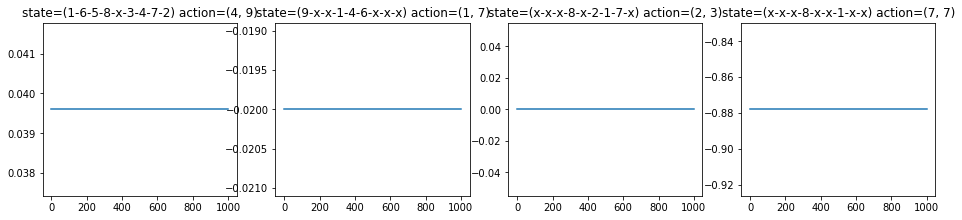

In [65]:
#print(type(xaxis))
xaxis = np.asarray(range(0,1000))
plt.figure(0, figsize=(16,7))
plt.subplot(241)
plt.title('state=(1-6-5-8-x-3-4-7-2) action=(4, 9)')
plt.plot(xaxis,np.asarray(States_track['1-6-5-8-x-3-4-7-2'][(4, 9)][-1000:]))
plt.subplot(242)
plt.title('state=(9-x-x-1-4-6-x-x-x) action=(1, 7)')
plt.plot(xaxis,np.asarray(States_track['9-x-x-1-4-6-x-x-x'][(1, 7)][-1000:]))
plt.subplot(243)
plt.title('state=(x-x-x-8-x-2-1-7-x) action=(2, 3)')
plt.plot(xaxis,np.asarray(States_track['x-x-x-8-x-2-1-7-x'][(2, 3)][-1000:]))
plt.subplot(244)
plt.title('state=(x-x-x-8-x-x-1-x-x) action=(7, 7)')
plt.plot(xaxis,np.asarray(States_track['x-x-x-8-x-x-1-x-x'][(7, 7)][-1000:]))


plt.show()

## Plotting the individual graphs

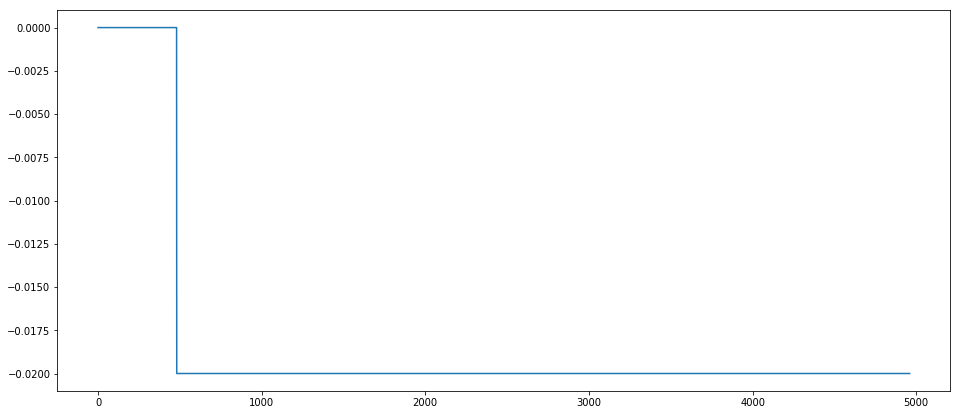

In [66]:
xaxis = np.arange(len(States_track['9-x-x-1-4-6-x-x-x'][(1, 7)]))
plt.figure(0, figsize=(16,7))

plt.plot(xaxis,np.array(States_track['9-x-x-1-4-6-x-x-x'][(1, 7)]))
plt.show()

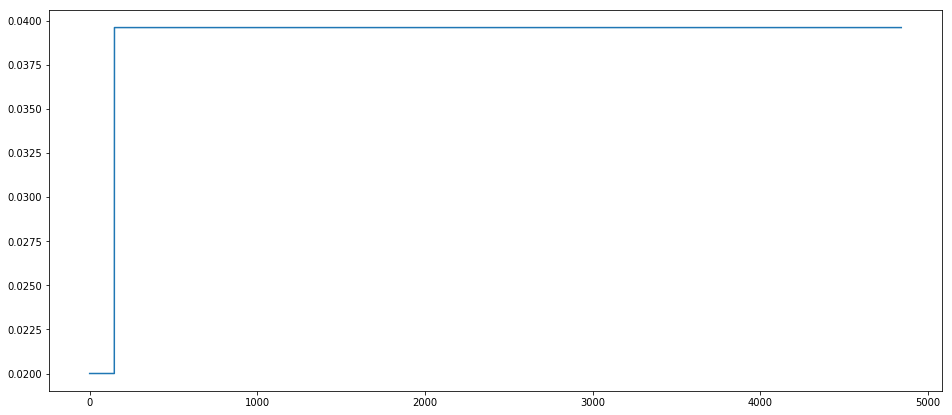

In [67]:
xaxis = np.arange(len(States_track['1-6-5-8-x-3-4-7-2'][(4, 9)]))
plt.figure(0, figsize=(16,7))

plt.plot(xaxis,np.array(States_track['1-6-5-8-x-3-4-7-2'][(4, 9)]))
plt.show()

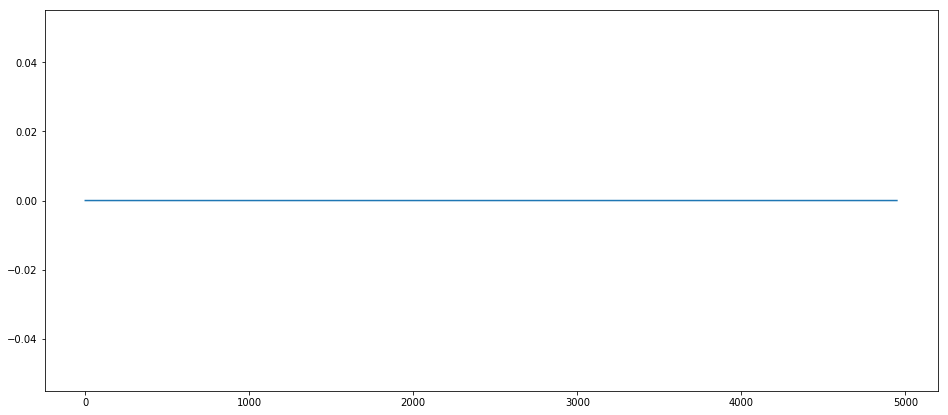

In [68]:
xaxis = np.arange(len(States_track['x-x-x-8-x-2-1-7-x'][(2, 3)]))
plt.figure(0, figsize=(16,7))

plt.plot(xaxis,np.array(States_track['x-x-x-8-x-2-1-7-x'][(2, 3)]))
plt.show()

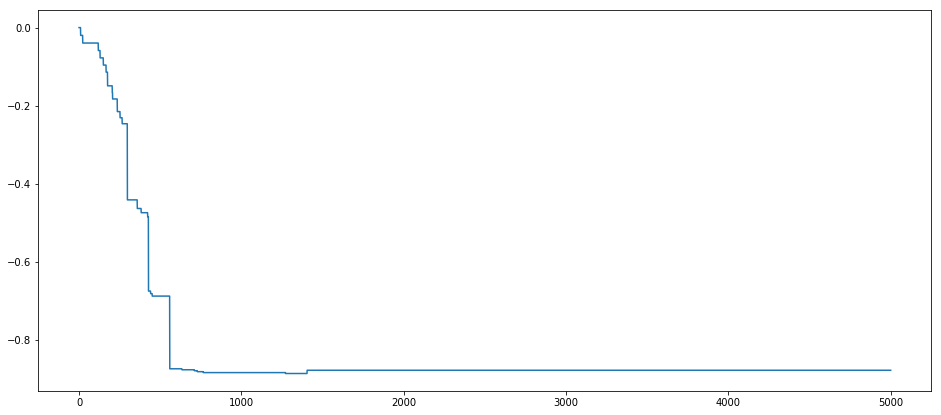

In [69]:
xaxis = np.arange(len(States_track['x-x-x-8-x-x-1-x-x'][(7, 7)]))
plt.figure(0, figsize=(16,7))

plt.plot(xaxis,np.array(States_track['x-x-x-8-x-x-1-x-x'][(7, 7)]))
plt.show()

### From the plots, we can see that the agent has learnt well and we can observe that the values are converging. Thus, we can include that RL training is successful.

### Epsilon - decay check

In [70]:
max_epsilon = 1.0
min_epsilon = 0.001
time = np.arange(0,5000000)
epsilon = []
for i in range(0,5000000):
    epsilon.append(min_epsilon + (max_epsilon - min_epsilon) * np.exp(-0.0000008*i))

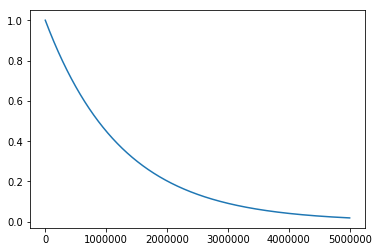

In [71]:
plt.plot(time, epsilon)
plt.show()

# Conclusion

## We see that the RL has been trained successfully and the results are as expected. Also, from the sample values, we could see that the values are converging